In [1]:
import pandas as pd
import warnings
# Ignoring FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
import numpy as np
import os
import time
import pickle
from matplotlib import pyplot as plt
import seaborn as sns
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from itertools import chain

import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import mean_squared_error

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader,Dataset
from torch.nn.utils.rnn import pad_sequence,pack_padded_sequence,pad_packed_sequence
from torch.optim.lr_scheduler import CosineAnnealingLR, CyclicLR
from torch.optim.swa_utils import AveragedModel
from pytorch_model_summary import summary

from s8_2_LSTM_regression_functions import *


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. DEFINE FUNCTIONS FOR LSTM

## Define LSTM

In [2]:
# Define a custom Dataset for handling grouped training data
class Grouped_Train_Dataset(Dataset):
    def __init__(self, X,y,model_complex,training_days):
        self.X = X
        self.y = y
        self.training_days = training_days
        self.patients=X['USUBJID'].unique()
        self.model_complex=model_complex
        #print('Training data shape',self.X.shape)

    def __len__(self):
        return len(self.X['COMBNUM'].unique())

    def __getitem__(self, idx):
        #combnum_dict=dict(zip(np.arange(len(self.X['COMBNUM'].unique())),self.X['COMBNUM'].unique()))
        #combnum=combnum_dict[idx]
        combnum=self.X['COMBNUM'].unique()[idx]
        X_patient_data=self.X[self.X['COMBNUM']==combnum]
        y_patient_data=self.y[self.y['COMBNUM']==combnum]

        if self.model_complex=='day_only':
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID will be dropped later in the script
            X_patient_data=X_patient_data.loc[:,X_patient_data.columns.str.contains('DAY|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)] 

        if self.model_complex=='regimen_only':       
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID|DAY will be dropped later in the script
            X_patient_data=X_patient_data.loc[:,X_patient_data.columns.str.contains('dr_reg|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)]       

        X_patient_data=X_patient_data.drop(columns=['USUBJID','COMBNUM'])
        y_patient_data=y_patient_data.drop(columns=['COMBNUM'])
            
        X_patient_data=torch.tensor(X_patient_data.values, dtype=torch.float32)
        y_patient_data=torch.tensor(y_patient_data.values, dtype=torch.float32)

        return X_patient_data, y_patient_data[-1]    


    def collate_fn(self, batch):
        inputs, targets= zip(*batch)
        inputs_padded = pad_sequence(inputs, batch_first=True, padding_value=0)
        targets = torch.stack(targets)
        seq_lens=torch.tensor([len(seq) for seq in inputs],dtype=torch.float32)
        return inputs_padded, targets, seq_lens


##### =======================================
# Define a custom Dataset for handling grouped test data for the training method training_on_first_x_days
class Grouped_Test_Dataset_first_x_days(Dataset):
    def __init__(self, X,y,training_days,std_training_days,model_complex,dataset_type):
        self.X_all_std=X
        self.y=y
        self.training_days = training_days
        self.std_training_days=std_training_days.flatten()[0]
        self.dataset_type=dataset_type
        
        if dataset_type=='training':
            self.X_test=X[X['DAY']<=self.std_training_days]
            self.y_test=y[y.index.get_level_values('STD_DAY')<=self.std_training_days]

        if dataset_type=='testing' or dataset_type=='validation':
            self.X_test=X[X['DAY']>self.std_training_days]
            self.y_test=y[y.index.get_level_values('STD_DAY')>self.std_training_days]            
        
        self.X_test=self.X_test.reset_index(drop=True)     

    def __len__(self):
        return len(self.X_test)

    def __getitem__(self, idx):
        patient_id = self.X_test.loc[idx,'USUBJID']
        
        ## Get day of study for which the prediction should be made
        day_to_pred=self.X_test.loc[idx,'DAY']
        
        ## If testing data ,add all prior study days, so they can bus used for prediction 
        #  i.e. Training was made on first 10 days, prediction should be made for day 14 
        #  then used Inputs from day1-day10 + day14 and predict y for day 14
        if self.dataset_type=='testing':
            
            days_for_prediction=self.X_all_std.loc[(self.X_all_std['USUBJID']==patient_id)&\
                                                (self.X_all_std['DAY']<=self.std_training_days),'DAY'].tolist() + [day_to_pred]
        
        ## If training, then just take all the days prior to the prediction day
        if self.dataset_type=='training':
            days_for_prediction=self.X_all_std.loc[(self.X_all_std['USUBJID']==patient_id)&\
                                                (self.X_all_std['DAY']<=day_to_pred),'DAY'].tolist()

        X_testing_data=self.X_all_std[(self.X_all_std['USUBJID']==patient_id)&\
                                        (self.X_all_std['DAY'].isin(days_for_prediction))].drop(columns=['USUBJID'])

        # Subset the y data for the specific patient and day 
        y_testing_data=self.y_test[(self.y_test.index.get_level_values('USUBJID')==patient_id) &\
                                   (self.y_test.index.get_level_values('STD_DAY')==day_to_pred)]#.drop(columns=['COMBNUM'])    
                                   
        X_testing_data=torch.tensor(X_testing_data.values, dtype=torch.float32)
        y_testing_data=torch.tensor(y_testing_data.values, dtype=torch.float32)

        return X_testing_data, y_testing_data    

##### =======================================
# Define a custom Dataset for handling grouped test data for the training method training_on__whole_data
class Grouped_Test_Dataset_whole_data(Dataset):
    def __init__(self, X_test,y_test,training_days,std_training_days,model_complex,dataset_type):
        self.X_test=X_test
        self.y_test=y_test
        self.model_complex=model_complex
        self.training_days = training_days
        #self.std_training_days=std_training_days.flatten()[0]      
        
        self.X_test=self.X_test.reset_index(drop=True)     

    def __len__(self):
        return len(self.X_test)

    def __getitem__(self, idx):
        patient_id=self.X_test.loc[idx,'USUBJID']
        
        ## Get day of study for which the prediction should be made
        day_to_pred=self.X_test.loc[idx,'DAY']

        ## Get all the data prior to the day that is predicted
        X_testing_data=self.X_test[(self.X_test['USUBJID']==patient_id)&\
                                        (self.X_test['DAY']<=day_to_pred)].drop(columns=['USUBJID'])

        if self.model_complex=='day_only':
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID will be dropped later in the script
            X_testing_data=X_testing_data.loc[:,X_testing_data.columns.str.contains('DAY|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)] 

        if self.model_complex=='regimen_only':       
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID|DAY will be dropped later in the script
            X_testing_data=X_testing_data.loc[:,X_testing_data.columns.str.contains('dr_reg|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)]                                        

        # Subset the y data for the specific patient and day 
        y_testing_data=self.y_test[(self.y_test.index.get_level_values('USUBJID')==patient_id) &\
                                   (self.y_test.index.get_level_values('STD_DAY')==day_to_pred)]#.drop(columns=['COMBNUM']) 
                
        X_testing_data=torch.tensor(X_testing_data.values, dtype=torch.float32)
        y_testing_data=torch.tensor(y_testing_data.values, dtype=torch.float32)

        return X_testing_data, y_testing_data   


##### =======================================
### LSTM for forecasting 
class LSTM_forecast(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size,fc_hidden_dims,device,custom_loss,dropout_prob,bidirectional):
        super().__init__()
        ## Init LSTM model
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, dropout=dropout_prob,batch_first=True,
                            bidirectional=bidirectional)
        
        # Dropout layer
        self.dropout = nn.Dropout(dropout_prob)

        ## Init fully connected (FC) layers
        dims=[hidden_size] + fc_hidden_dims + [output_size]
        layers=[]
        
        for i in range(len(dims) - 1):
            layers.append(nn.Linear(dims[i], dims[i+1]))
            layers.append(nn.BatchNorm1d(num_features=dims[i+1]))
            layers.append(nn.ReLU())            
            #layers.append(nn.Dropout(dropout_prob))
        
        if custom_loss==True:
            last_activation=nn.Hardtanh(1e-18, 1)
        if custom_loss==False:
            last_activation=nn.ReLU()

        # Replace the last activation function
        #layers[-2]=last_activation  
        layers[-1]=last_activation 

        ## Drop the last nn.Dropout() layer
        #layers=layers[:-1]


        self.fc=nn.Sequential(*layers)
        
        '''
        if custom_loss==False:
            self.fc = nn.Sequential(nn.Linear(hidden_size, int(hidden_size/2)),
                                    nn.ReLU(),
                                    nn.Dropout(dropout_prob), 
                                    nn.Linear(int(hidden_size/2),int(hidden_size/4)),
                                    nn.ReLU(),
                                    nn.Dropout(dropout_prob),
                                    nn.Linear(int(hidden_size/4),output_size),
                                    nn.ReLU())
        if custom_loss==True:
            self.fc = nn.Sequential(nn.Linear(hidden_size, int(hidden_size/2)),
                                    nn.ReLU(),
                                    #nn.Sigmoid(),
                                    nn.Dropout(dropout_prob), 
                                    nn.Linear(int(hidden_size/2),int(hidden_size/4)),
                                    nn.ReLU(),
                                    #nn.Sigmoid(),
                                    nn.Dropout(dropout_prob), 
                                    nn.Linear(int(hidden_size/4),output_size),
                                    nn.Hardtanh(1e-15, 1))
                                    #nn.Hardtanh(1e-6, 1))
                                    #nn.Sigmoid())   
        '''                             
        self.device=device
        
    def forward(self, x, seq_lens,mode):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(self.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(self.device)
        
        if mode=='training':
            lstm_input=pack_padded_sequence(x,seq_lens,enforce_sorted=False,batch_first=True)
        if mode=='testing':
            lstm_input=x #x.view(1,1,x.shape[0])

        output,(ht,ct) = self.lstm(lstm_input)
        ## Extract the last output of the LSTM layers (as there can be multiple)
        fc_input=ht[-1].unsqueeze(0)
        
        ## Permutate, to get the batch size as first dimension so reshape from (1,batch_size,hidden_size)
        #  into (batch_size,1,hidden_size)
        #fc_input=torch.permute(fc_input,(1,0,2))
        fc_input=(fc_input.squeeze(dim=0))    
        
        ## Run fully connected layer
        out = self.fc(fc_input)

        ## Reshape from (batch_size,1,1) to (batch_size,1)
        #out=out.squeeze(dim=2) 
        return out


##### =======================================
## Define CustomLoss -> modify Logloss, with a mixture of Logloss and MSELoss
#  As data is continuous until day 42, after that it is considered negative (==categorical), mix Log and MSELoss
class CustomLoss(nn.Module):
    def __init__(self, weight_logloss,weight_mse_loss,y_min_max,weight=None, size_average=True):
        super(CustomLoss,self).__init__()
        self.weight=weight
        self.weight_logloss=weight_logloss
        self.weight_mse_loss=weight_mse_loss
        self.y_min_max=y_min_max

    def forward(self, input, target,train_ds_type):
        ## Target is transformed to binary output (0,1). 0 means lowest TTP, 1 means highest TTP (>42 days)
        ## Get prediction class (0:positive, 1: negative) of target by rounding target TTPs
        if self.y_min_max==False:
            if train_ds_type=='raw':
                max_value=43
            if train_ds_type=='log':    
                max_value=np.log10(43)

            pred_classes=torch.floor(target/max_value)

        ## If min-max normalized, then 0== 0 days TTP, 1== >42 days TTP 
        if self.y_min_max==True:    
            pred_classes=torch.floor(target)

        ## If no weights are provided for the classes, initialise weight==1 for all targets
        if self.weight is None:
            weights=[1 for x in pred_classes.flatten().numpy()]
        
        ## If weights are provided for the classes (0:positive,1:negative), create weight list to calculate the final loss
        # as the weighted of the individual losses in the mini-batch 
        # i.e. pred_classes:[1,0,1], self.weight=[1,2] (1:negative,2:positive) -> weights=[2,1,2]
        elif self.weight is not None:
            weights=[self.weight[int(x)] for x in pred_classes.flatten().numpy()]
        
        ## Normalize weight and reshape them to match the prediction classes tensor
        weight_vector=torch.tensor([x/len(weights) for x in weights])
        weight_vector=weight_vector.view(pred_classes.size())

        ## Multiply each individual loss input-target loss element with its respective weight
        #  logloss: only effects negative (label:1) inputs, as (1-pred_classes*(torch.log(1-input))) part is missing 
        #  mse_loss: only affects positive (label:0) inputs, as the "*(1-pred_classes)"" part makes the negative inputs 0.

        ## Logloss only for negative (label:1) samples, mse_loss only for positive (label:0)
        #logloss=-pred_classes*torch.log(input)*weight_vector
        #mse_loss=torch.pow((target-input),2)*weight_vector*(1-pred_classes)

        ## Full logloss and mse_loss functions, calculating loss for both negative and positive samples
        logloss=(-(pred_classes*torch.log(input)+(1-pred_classes)*torch.log(1-input)))*weight_vector
        mse_loss=torch.pow((target-input),2)*weight_vector#*(1-pred_classes)
        loss=sum((self.weight_logloss*logloss + self.weight_mse_loss*mse_loss)/(self.weight_logloss + self.weight_mse_loss))
        
        #print('input',input)
        #print('torch.log(input)',torch.log(input))
        #print('torch.pow((target-input),2)',torch.pow((target-input),2))
        if (input < 0).any():
            raise ValueError("Model output tensor contains negative elements",input)
        return loss


##### =======================================
### Create training dataset by creating sliding windowed-data of patients' dataframe and concatenate them
def calculate_sliding_windows(X,y): 
    X_id_comb_list,y_id_comb_list=[],[]
    
    ## For each patient get the days in the study as a list and create a rolling-window style list of them
    #  i.e. Pat1 has DAY:[1,2,4,6,8,10] ->windows_size=2 ->[[1,2],[2,4],[4,6]...[8,10]]
    #  Window size is from 1 -> number of days for patient
    for pat_id in X['USUBJID'].unique()[:]:
        pat_df_X=X[X['USUBJID']==pat_id]
        pat_df_y=y[y.index.get_level_values('USUBJID')==pat_id]

        # Set the range of the window from 1 to the number of days
        for window_size in range(1,len(pat_df_X['DAY']) + 1):
            # Extract the indices of combinations for the current window size 
            #X_id_combination=[list(pat_df_X['DAY'].iloc[i:i+window_size].index) for i in range(len(pat_df_X['DAY']) - window_size + 1)]
            #y_id_combination=[pat_df_y.index[i:i+window_size] for i in range(len(pat_df_y.index) - window_size + 1)]

            X_id_combination=[list(pat_df_X['DAY'].iloc[0:window_size].index)]
            y_id_combination=[pat_df_y.index[0:window_size]]
            
            # Append the indices to list
            X_id_comb_list.extend(X_id_combination)
            y_id_comb_list.extend(y_id_combination)
    
    ## Based on the previously created indices subset the X and y (which should be==X_train,y_train_with_index) data
    #  save them in a respective list and concatenate them in the end.
    ## Add a unique combination number to each of the sliding-window combination, so DataLoader can load the data
    #  based on this column

    X_train_list,y_train_list=[],[]

    for comb_n,X_id,y_id in zip(range(len(X_id_comb_list)),X_id_comb_list,y_id_comb_list):
        X['COMBNUM']=comb_n
        y['COMBNUM']=comb_n
        X_train_list.append(X.loc[X_id,:])
        y_train_list.append(y.loc[y_id,:]) 

    X_train_slid_wind=pd.concat(X_train_list,axis=0)    
    y_train_slid_wind=pd.concat(y_train_list,axis=0)   

    return X_train_slid_wind,y_train_slid_wind


## Setup function for calculating elapsed time
def print_elapsed_time(start,stop):
    # Calculate the elapsed time in seconds
    elapsed_seconds=stop-start
    
    # Convert elapsed time to hours and minutes
    elapsed_minutes, elapsed_seconds = divmod(int(elapsed_seconds), 60)
    elapsed_hours, elapsed_minutes = divmod(elapsed_minutes, 60)
    
    # Print the result in the desired format
    return(f"{elapsed_hours} hours: {elapsed_minutes} minutes: {elapsed_seconds} seconds")


def create_folder_if_not_exists(folder_path):
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        print(f"Folder '{folder_path}' created successfully.")

## __Function for data splitting and ML model training__
1. __Preprocess data for ML and split into X and y matrices__
*  Drop columns with strings that are unnecessary and create one-hot encoded columns of categorical variables
*  Split data into training variables (X) and variable to predict (y== MGIT TTP values)
*  Split data into training variables (X) and variable to predict (log(y): log MGIT TTP values))

2. __Function to split data into train and test data and fit models__

-  __1. Method__: train on data containing MGIT measurements from whole study range -> predict MGIT measurements at any timepoint
-  __2. Method__: train on the data of first X days of therapy -> predict MGIT measurements of therapy days > X


3. __Train different predicitive models ans save the result of prediction__
*  Split data into train and test data
*  Train multiple predictive methods (RandomForest, linear regression, Ridge regression, Lasso regression, Elastic net)
*  Predict MGIT TTP using test data and save the results
*  Cross-validation of the training of the multiple models

In [3]:
## Function for splitting a list of patient IDs into training and testing sublists of patient IDs-> 
#  - This function splits up the sliding-window dataset into patients who are used for training and patients 
#    whose used for testing + it also splits up the training patients IDs into K-fold training-validation sets
def train_test_split_with_CV_split(X_slid_wind,training_method,test_data_ratio,k_folds,seed=None):
    import random     
    import itertools 
    
    ## Set seed
    if seed is None:
        random.seed()
    if seed is not None:
        random.seed(seed)

    if training_method=='training_on_whole_data':

        id_list=X_slid_wind['USUBJID'].unique().tolist()        
        
        ## Shuffle id list and split it into training/testing pat IDs
        random.shuffle(id_list)
        split_index=int(len(id_list) * (1-test_data_ratio))
        training_ids=id_list[:split_index]
        testing_ids=id_list[split_index:]

        ## If NO CV (==k_folds is None), return only training/testing IDs as nested listds (to keep same format as with k_folds== not None)
        #  Return training,validation, testing IDs -> testing_ids is split up in half: validation_ids (half) + testing_ids (half)
        if k_folds==1:
            val_data_split_index=int(len(testing_ids)/2)
            validation_ids=testing_ids[:val_data_split_index]
            half_testing_ids=testing_ids[val_data_split_index:]
            return training_ids,half_testing_ids,[training_ids], [validation_ids]

        if k_folds is not None:
            if k_folds<1:
                raise ValueError(f'K-folds has to be >0!')

            if len(training_ids)<k_folds:
                raise ValueError(f'Number of K-folds higher than length ({len(training_ids)}) of training data! Lower K-fold or check length of training data.')

            ## Shuffle training ids and split it into k_fold splits    
            random.shuffle(training_ids)
            cv_splits=np.array_split(training_ids,k_folds)

            ## Init nested lists that will contain the kfold training/validation ID (shape:(k_folds,len(id_list)))
            cv_training_id_array=[]
            cv_validation_id_array=[]

            ## Iterate over k_fold-splitted training ids, and always select one split as validation set, 
            #  the other splits as training set for the given K-fold
            for k,val_split in enumerate(cv_splits):
                train_ids=(np.delete(cv_splits, k, axis=0))
                train_ids_list=list(chain(*[sub_array.tolist() for sub_array in train_ids]))
                cv_training_id_array.append(train_ids_list)
                cv_validation_id_array.append(val_split.tolist())

            return training_ids,testing_ids,cv_training_id_array, cv_validation_id_array
    
    if training_method=='training_on_first_x_days':
        raise ValueError(f"@author of this code: write the code for the function 'train_test_split_with_CV_split' for \
                            training_method=='training_on_first_x_days'case as you haven't written it yet!")

# --------------------------------------------------------------------------------------------------------------------------
### Drop unnecessary columns from the whole dataset, one-hot encode categorical variables and return X and y dataframes 
def create_X_y_dataframe_from_raw_data(df_for_analysis,pat_id_df,y_as_log,y_min_max):
    ## Drop unnecessary columns and create one-hot encoding of categorical vars
    data=df_for_analysis.drop(columns=['STUDYID','ARM'])
    
    ## Select nominal columns with categorical variables >3 unique values and convert them to one-hot encoded variables
    data_hot_encoded=pd.get_dummies(data.drop(columns=['USUBJID']))
    data_hot_encoded=pd.concat([data_hot_encoded,data['USUBJID']],axis=1)


    ## Drop target variable from predictor variables' dataframe
    cols_to_drop=['mb_Time to Detection_STD_NUM_RESULT']
    X=data_hot_encoded.drop(columns=cols_to_drop)


    ## Create y data to predict + keep some data (day, study id, arm) for plotting later + add phase info
    y=df_for_analysis[['USUBJID','DAY','STUDYID','ARM','mb_Time to Detection_STD_NUM_RESULT']]
    y['STD_DAY']=StandardScaler().fit_transform(y.loc[:,'DAY'].values.reshape(-1,1))
    
    phase_dict=pd.Series(pat_id_df['PHASE'].astype(str).values,index=pat_id_df['USUBJID']).to_dict()
    y['PHASE']=y.loc[:,'USUBJID'].map(phase_dict)
    y=y.set_index(['USUBJID','DAY','STD_DAY','STUDYID','ARM','PHASE'],drop=True)
    y_log=np.log10(y.replace(0,1))


    if y_min_max==True:
        min_val=0
        max_value=1/(24*3600)+42
        y['mb_Time to Detection_STD_NUM_RESULT']=y['mb_Time to Detection_STD_NUM_RESULT'].replace({43:max_value},regex=True)
        y_log=np.log10(y.replace(0,1))

        for y_df,max_val in zip([y,y_log],[max_value,np.log10(max_value)]):
            y_df['mb_Time to Detection_STD_NUM_RESULT']=(y_df['mb_Time to Detection_STD_NUM_RESULT']-min_val)/(max_val-min_val)


    if y_as_log==False:
        return X,y
    if y_as_log==True:
        return X,y_log



# --------------------------------------------------------------------------------------------------------------------------
## Extract a std_scaler fitted to the non-binary numerical columns of the training data 
#  => will be used to standardise X_train and X_test data later on
def extract_non_binary_num_std_scaler(X):

    ## Select non-binary numerical columns
    numerical_cols=X.select_dtypes(exclude=['object'])
    non_binary_num_cols=[]

    for col in numerical_cols.columns:
        unique_values=np.sort(numerical_cols[col].unique())
        if np.array_equal(unique_values, np.array([0, 1]))==False:
            non_binary_num_cols.append(col)

    if 'COMBNUM' in non_binary_num_cols:
        non_binary_num_cols=[x for x in non_binary_num_cols if x!='COMBNUM']

    std_scaler=StandardScaler()
    std_scaler.fit(X.loc[:,non_binary_num_cols])
    
    return std_scaler,non_binary_num_cols

# --------------------------------------------------------------------------------------------------------------------------
## Create standardised X data: 
#  - only non-binary numerical columns are getting standardised)
#  - std_scaler=StandardScaler() fitted to the training_data
def standardise_non_binary_num_vars(X,non_binary_num_cols,std_scaler):
    ## If previously fitted std_scaler is provided, transform your dataframe with it an return only transformed data
    X.loc[:,non_binary_num_cols]=std_scaler.transform(X.loc[:,non_binary_num_cols])
    return X


# --------------------------------------------------------------------------------------------------------------------------
## Extract a std_scaler fitted to the 'DAY' column of the training data => will be used to standardise 'y' data's 'DAY' column
def extract_day_std_scaler(X):
    day_std_scaler=StandardScaler()
    day_std_scaler.fit(X.loc[:, 'DAY'].values.reshape(-1,1))
    return day_std_scaler


# --------------------------------------------------------------------------------------------------------------------------
## Function for standardising the 'DAY' column in the y dataframe, based on the 'DAY' dsitribution of the training dataset
def standardise_y_days(X,y):
    day_std_scaler=StandardScaler()
    day_std_scaler.fit(X.loc[:, 'DAY'].values.reshape(-1,1))

    ## If day_std_scaler has been fitted to the training data earlier, transform the given 'y' dataframe and return it
    y=y.reset_index()
    y['STD_DAY']=day_std_scaler.transform(y.loc[:,'DAY'].values.reshape(-1,1))

    #print('day_std_scaler is fitted',hasattr(day_std_scaler, "n_features_in_"))
    y=y.set_index(['USUBJID','DAY','STD_DAY','STUDYID','ARM','PHASE'],drop=True)
    return y


# --------------------------------------------------------------------------------------------------------------------------
## 1. Method: train on whole dataset and predict MGIT TTP at any timepoint
def training_on_whole_data(data,pat_id_df,data_split_random_state,y_min_max,y_as_log):

    X,y=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)
    ## Split training data
    test_data_ratio=0.25

    ## Select non-binary numerical columns
    numerical_cols=X.select_dtypes(exclude=['object'])
    non_binary_num_cols = []

    for col in numerical_cols.columns:
        unique_values = np.sort(numerical_cols[col].unique())
        if np.array_equal(unique_values, np.array([0, 1]))==False:
            non_binary_num_cols.append(col)

    X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=test_data_ratio, random_state=data_split_random_state,\
                                                        shuffle=True)

    ## FIT scaler on TRAINING data
    std_scaler=StandardScaler()
    std_scaler.fit(X_train.loc[:,non_binary_num_cols])

    ## Transform (standardise) data with previously fitted std_scaler
    for X_df in [X_train,X_test]:
        X_df.loc[:,non_binary_num_cols]=std_scaler.transform(X_df.loc[:,non_binary_num_cols])

    std_training_days=0
    return (X_train, X_test, y_train, y_test,std_training_days)


# --------------------------------------------------------------------------------------------------------------------------
## 2. Method: train only on first X days and predict MGIT TTP values after therapy day X
def training_on_first_x_days(training_days,data,pat_id_df,y_min_max,y_as_log):
    
    X,y=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)
    
    ## Select non-binary numerical columns
    numerical_cols=X.select_dtypes(exclude=['object'])
    non_binary_num_cols = []

    for col in numerical_cols.columns:
        unique_values = np.sort(numerical_cols[col].unique())
        if np.array_equal(unique_values, np.array([0, 1]))==False:
            non_binary_num_cols.append(col)


    ## Split training data by study days -> train only on the first X days, and predict the TTP values for the days > X
    X_train=X[X['DAY']<=training_days]
    X_test=X.copy() #[X['DAY']>training_days]
    y_train=y[y.index.get_level_values('DAY')<=training_days]
    y_test=y.copy() #[y.index.get_level_values('DAY')>training_days]

    ## FIT scaler on TRAINING data
    std_scaler = StandardScaler()
    std_scaler.fit(X_train.loc[:,non_binary_num_cols])

    ## Transform (standardise) data
    for X_df in [X_train,X_test]:
        X_df.loc[:,non_binary_num_cols]=std_scaler.transform(X_df.loc[:,non_binary_num_cols])

    ## As DAY column also gets standardised, transform the training_days number as well, in order to subset the
    #  data to training-testing set
    std_scaler = StandardScaler()
    std_scaler.fit(X_train.loc[:, 'DAY'].values.reshape(-1,1))
    std_training_days=std_scaler.transform(np.array([[training_days]]).reshape(1,-1))
   
    return (X_train, X_test, y_train, y_test,std_training_days)


# --------------------------------------------------------------------------------------------------------------------------
## Split the training data with the selected method and transform 'y' dataframes to colum vector necessary for ML algorithms
def split_training_data(training_method,data,pat_id_df,training_days,data_split_random_state,y_min_max):
     ## 1. Method
    if training_method=='training_on_whole_data':
        X_train, X_test, y_train, y_test,std_training_days=training_on_whole_data(data,pat_id_df,data_split_random_state,\
                                                                                y_min_max,y_as_log=False)

        X_train, X_test, y_train_log, y_test_log,std_training_days=training_on_whole_data(data,pat_id_df,data_split_random_state,\
                                                                                y_min_max,y_as_log=True)
    ## 2. Method
    if training_method=='training_on_first_x_days':
        X_train, X_test, y_train, y_test,std_training_days=training_on_first_x_days(training_days,data,pat_id_df,\
                                                                                    y_min_max,y_as_log=False)
        X_train, X_test, y_train_log, y_test_log,std_training_days=training_on_first_x_days(training_days,data,pat_id_df,\
                                                                                y_min_max,y_as_log=True)

    ## Extract the y values from y_test dataframes in order to feed it to ML algorithms
    #  (The multiindex of y_test dataframes will be used later for coloring the plots)
    y_test_vals=y_test.values.ravel()
    y_test_log_vals=y_test_log.values.ravel()
    y_train_vals=y_train.values.ravel()
    y_train_log_vals=y_train_log.values.ravel()

    return(X_train, X_test, y_train, y_test,y_train_log, y_test_log,\
          y_test_vals,y_test_log_vals,y_train_vals,y_train_log_vals,std_training_days)


# --------------------------------------------------------------------------------------------------------------------------
##  As lot of temporal columns are very sparse -> keep only those that have information X>=threshold number of patients
def drop_temporal_cols_with_insuff_data(data,temp_cols,threshold):
    data_temp_cols=data.columns[data.columns.str.startswith(tuple(temp_cols))].tolist()

    data_temp_cols_non_zero_mask=data[data_temp_cols].apply(lambda x : x!=0)
    data_temp_cols_non_zero_mask['USUBJID']=data['USUBJID'].values
    data_temp_cols_non_zero_mask=data_temp_cols_non_zero_mask.set_index('USUBJID',drop=True)

    data_temp_cols_non_zero_df=data_temp_cols_non_zero_mask.groupby('USUBJID').apply(lambda x: (x.apply(lambda y: any(y==True))))
    temp_vars_avail_for_pats=data_temp_cols_non_zero_df.apply(lambda x: sum(x))
    temporal_cols_to_drop=temp_vars_avail_for_pats[temp_vars_avail_for_pats<threshold].index.tolist()

    return data.drop(columns=temporal_cols_to_drop)

    
# --------------------------------------------------------------------------------------------------------------------------
def load_sliding_window_train_data(training_method,ds_name,train_ds_type,training_days,model_complex):
    ## Check if the sliding windows training datasets for X_train and y_train are already created ->
    #  If not raise error to create them    
    if training_method=='training_on_first_x_days':
        fn_x='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_X_train_data'])+'.csv.gz'
        fn_y='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_y_train_data'])+'.csv.gz'
        
    if training_method=='training_on_whole_data':
        fn_x='_'.join([ds_name,'whole_data','LSTM_slid_window_X_train_data'])+'.csv.gz'
        fn_y='_'.join([ds_name,'whole_data','LSTM_slid_window_y_train_data'])+'.csv.gz'    
        
    data_dir='../data'
    fname_x=os.path.join(data_dir,fn_x)
    fname_y=os.path.join(data_dir,fn_y)

    ## If data exists load them and transform y_train (min-max or log) if specified
    if os.path.exists(fname_x) and os.path.exists(fname_y):
        print('Loading previously saved training datasets')
        X_train_slid_wind=pd.read_csv(fname_x,index_col=0,low_memory=False)
        y_train_slid_wind=pd.read_csv(fname_y,index_col=[0,1,2,3,4,5],low_memory=False)
        
        #  Transform to y-df to logarithmic or min-max-scaled of necessary
        if y_min_max==False:
            if train_ds_type=='log':
                y_train_slid_wind_log=y_train_slid_wind.copy()
                y_train_slid_wind_log['mb_Time to Detection_STD_NUM_RESULT']=np.log10(y_train_slid_wind_log['mb_Time to Detection_STD_NUM_RESULT'].replace(0,1))
                y_train_slid_wind=y_train_slid_wind_log.copy()

        if y_min_max==True:
            min_val=0
            max_value=1/(24*3600)+42 # 42 days + 1 second converted to days ~ 42.0000001 day
            y_train_slid_wind['mb_Time to Detection_STD_NUM_RESULT']=y_train_slid_wind['mb_Time to Detection_STD_NUM_RESULT'].replace({43:max_value},regex=True)
            y_train_slid_wind_log=y_train_slid_wind.copy()
            y_train_slid_wind_log['mb_Time to Detection_STD_NUM_RESULT']=np.log10(y_train_slid_wind_log['mb_Time to Detection_STD_NUM_RESULT'].replace(0,1))

            for y_df,max_val in zip([y_train_slid_wind,y_train_slid_wind_log],[max_value,np.log10(max_value)]):
                y_df['mb_Time to Detection_STD_NUM_RESULT']=(y_df['mb_Time to Detection_STD_NUM_RESULT']-min_val)/(max_val-min_val)
            
            if train_ds_type=='log':
                y_train_slid_wind=y_train_slid_wind_log.copy()

        '''
        if model_complex=='day_only':
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID will be dropped later in the script
            X_train_slid_wind=X_train_slid_wind.loc[:,X_train_slid_wind.columns.str.contains('DAY|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)] 

        if model_complex=='regimen_only':       
            ### DROP COLUMNS FOR BASE MODEL => STUDY|ARM|USUBJID|DAY will be dropped later in the script
            X_train_slid_wind=X_train_slid_wind.loc[:,X_train_slid_wind.columns.str.contains('dr_reg|COMBNUM|STUDY|ARM|USUBJID|mb_Time to Detection_STD_NUM_RESULT',regex=True)]      
        '''
        return X_train_slid_wind, y_train_slid_wind

    ## If data is non-existent raise an error to create it    
    if os.path.exists(fname_x)==False or os.path.exists(fname_y)==False:
        raise ValueError ('Sliding-window train data is missing, create it before running training')



# --------------------------------------------------------------------------------------------------------------------------
## Function to train different prediction models. Save results of prediction if needed with cross-validation
def train_models(training_method,data,model_names,scoring_methods,train_dataset_types,training_days,
                 random_state,data_split_random_state,test_data_results,train_data_results,lstm_parameters,swa_params,pat_id_df,\
                 y_min_max,custom_loss,ds_name,num_of_cv_repeats,k_folds,start,model_complex,cross_validation,get_feature_importances):
        

    ## Add training method to the result dictionary
    test_data_results[training_method]={}
    train_data_results[training_method]={}

    ## Split training and testing dataset based on the method chosen
    X_train, X_test, y_train, y_test,y_train_log, y_test_log,\
        y_test_vals,y_test_log_vals,y_train_vals,y_train_log_vals,std_training_days=split_training_data(training_method,data,\
                                                                                                        pat_id_df,training_days,\
                                                                                                        data_split_random_state,
                                                                                                        y_min_max)
                                                                                      
    ## Collect the train and test data types( raw and logarithmic) into lists to loop over during training and prediction
    y_train_datasets=[y_train_vals,y_train_log_vals]
    y_test_datasets=[y_test_vals,y_test_log_vals]
    # Make list of y_test dataframes where the MultiIndex contains information for plotting (i.e. Day, Studyid, etc..)
    y_train_datasets_with_index=[y_train,y_train_log]
    y_test_datasets_with_index=[y_test,y_test_log]
    
    
    

    ## Loop over methods and train the models. If CV==true, perform CV and plot the results
    for train_ds_type,y_train_data,y_test_data_vals,\
        y_test_data_with_index,y_train_data_with_index in zip(train_dataset_types,y_train_datasets,y_test_datasets,\
                                                              y_test_datasets_with_index,y_train_datasets_with_index):
        print('\nTraining on ' + train_ds_type +' MGIT values')
        print()
        
        #loss_items_dict[train_ds_type+' TTP']=[]
        train_data_results[training_method][train_ds_type]={}
        test_data_results[training_method][train_ds_type]={}
        model_name='LSTM_'+train_ds_type
        
                
        ##### TRAINING #######
        if 'LSTM' in model_name:
            mode='training'

            ### INITIALIZE LSTM MODEL BASIC PARAMETERS ###
            # Define batch size
            batch_size=lstm_parameters['batch_size']

            ## Init device -> if CUDA, set pin_memory=True in order to make memory access faster
            #  https://saturncloud.io/blog/what-is-pytorch-and-how-does-pinmemory-work-in-dataloader/#:~:text=Pinned%20memory%20is%20a%20special,could%20with%20regular%20CPU%20memory.
            device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
            if torch.cuda.is_available():
                pin_memory=True
            if not torch.cuda.is_available():
                pin_memory=False

            # Create data loaders
            #train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
            DataLoader_num_workers=0
            

            ##### LOAD SLIDING-WINDOW TRAINING DATA #######
            ## Check if the sliding windows training datasets for X_train and y_train are already created ->
            #  If not raise error to create them    
            X_slid_wind,y_slid_wind=load_sliding_window_train_data(training_method,ds_name,train_ds_type,training_days,model_complex)
            
            ## Save columns of sliding_window training data -> at testing these colnames can be used to subset testing data
            #  columns -> costly drop_temporal_cols_with_insuff_data() function doesn't have to be run again
            X_slid_wind_cols=X_slid_wind.drop(columns=['COMBNUM']).columns

            ## Load whole data for later use 
            #  - subsetting testing data 
            #  - fitting std_scaler to training data -> scale input variables of training + testing data later
            if train_ds_type=='raw':
                y_as_log=False
            if train_ds_type=='log':    
                y_as_log=True

            X_all,y_all=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)
            X_all=X_all.loc[:,X_all.columns.isin(X_slid_wind_cols)]
                       
            ##### TRAIN-TEST SPLIT DATA #######
            ## Split the sliding window data (which contains all the data converted
            #  to sliding-window style) into training-validation pairs for CV + testing data. 

            ## Set CV parameters
            if cross_validation==False:
                k_folds=1
                num_of_train_reps=['training_results_no_CV']
            if cross_validation==True:
                num_of_train_reps=['cv_rep_'+str(cv_rep+1) for cv_rep in range(num_of_cv_repeats)]

            ## Collect trainig results into cv_rep_dict, which will be added in the end to "train_data_results"
            cv_rep_dict={}
            for k,rep in enumerate(num_of_train_reps):
                if cross_validation==True:
                    print(f'{rep}/{num_of_cv_repeats} CV repeats\n')

                ## Print elapsed time since the start
                training_start=time.time()
                t=print_elapsed_time(start,training_start)
                print('Elapsed time since start:',t)                    

                test_data_results[training_method][train_ds_type][rep]={}
                test_data_results[training_method][train_ds_type][rep]['results']={}
                
                cv_rep_dict[rep]={}

                ## 'k' is iterating with CV-repeats  => 'k' makes sure, that the data is split differently among
                #  CV-repeats, but the same way between tran_ds_types ('raw','log')
                data_split_random_state_=data_split_random_state+k
                
                training_pat_ids,testing_pat_ids,\
                    cv_training_ids, cv_validation_ids=train_test_split_with_CV_split(X_slid_wind=X_slid_wind,
                                                                                        training_method=training_method,
                                                                                        test_data_ratio=0.25,
                                                                                        k_folds=k_folds,
                                                                                        seed=data_split_random_state_)
                cv_rep_dict[rep]['training_pat_ids']=training_pat_ids
                cv_rep_dict[rep]['validation_pat_ids']=list(set(chain(*cv_validation_ids)))
                cv_rep_dict[rep]['testing_pat_ids']=testing_pat_ids

                cv_rep_dict[rep]['results']={'training':{},'validation':{}}
                cv_rep_dict[rep]['training_loss']={}
                cv_rep_dict[rep]['training_learning_rate']={}
                
                cv_rep_dict[rep]['cv_training_ids']=cv_training_ids
                cv_rep_dict[rep]['cv_validation_ids']=cv_validation_ids

               ## Run training K-fold times (if no CV -> just 1 loop with training and validation data)
                for k, train_ids,valid_ids in zip(range(k_folds),cv_training_ids,cv_validation_ids):
                    train_loss_list=[]
                    lr_list=[]  
                    if cross_validation==True:
                        print(f'Starting training of {k+1}/{k_folds}-fold\n')


                    ### STANDARDISE INPUT DATA
                    ## Fit StandardScaler to training data: 
                    #  - subset whole data to the training patients 
                    #  - fit standardScaler to training data and return scaler for the
                    #    standardisation of validation and tesing datasets later
                    if training_method=='training_on_whole_data':
                        X_train_for_scale=X_all.loc[X_all['USUBJID'].isin(train_ids),:]
                    if training_method=='training_firsy_x_days':    
                        X_train_for_scale=X_train.copy()

                    std_scaler_train_data,non_binary_num_cols=extract_non_binary_num_std_scaler(X_train_for_scale)
                    #del X_train_for_scale

                    ## Subset training data, standardise non-binary numerical columns 
                    X_train_slid_wind=X_slid_wind[X_slid_wind['USUBJID'].isin(train_ids)]
                    X_train_slid_wind=standardise_non_binary_num_vars(X_train_slid_wind,non_binary_num_cols,std_scaler=std_scaler_train_data)

                    ## Standardise 'DAY' column in 'y' dataframe based on training data's 'DAY' distribution
                    y_train_slid_wind=y_slid_wind[y_slid_wind.index.get_level_values('USUBJID').isin(train_ids)]
                    
                    y_train_slid_wind=standardise_y_days(X=X_train_for_scale,y=y_train_slid_wind)

                    print('Training data shape',X_train_slid_wind.shape)
                    ## Load train data into DataLoader object
                    train_dataset=Grouped_Train_Dataset(X_train_slid_wind,y_train_slid_wind,model_complex,training_days)

                    train_loader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                                            collate_fn=train_dataset.collate_fn,num_workers=DataLoader_num_workers,
                                            pin_memory=pin_memory)
                    
                    # Initialize the model and optimizer           
                    lstm_parameters['input_size']=X_train_slid_wind.drop(columns=['USUBJID','COMBNUM']).shape[1]
                    lstm_parameters['input_size']=train_dataset[0][0].shape[1]
                    print('X_Training data shape',train_dataset[0][0].shape)

                    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
                    model=LSTM_forecast(lstm_parameters['input_size'],lstm_parameters['hidden_size'],
                                        lstm_parameters['num_of_lstm_layers'],lstm_parameters['output_size'],
                                        lstm_parameters['fc_hidden_dims'],device, 
                                        custom_loss,lstm_parameters['dropout_prob'],
                                        bidirectional=lstm_parameters['bidirectional']).to(device)                                                                             

                    ## Remove big data variables as they are not necessary for evaluation         
                    del X_train_slid_wind,y_train_slid_wind,train_dataset
                    
                    ## Set loss function + optimizer
                    if custom_loss==False:
                        criterion=lstm_parameters['criterion']
                    if custom_loss==True:
                        criterion=lstm_parameters['custom_criterion']

                    # CyclicLR function used in SWA only works with SGD, not wth ADAM. Therefore if there are SWA steps after pretraining, select
                    # SGD as optimizer. If no SWA steps, select ADAM.
                    if swa_params['swa_epochs']==0:                        
                        optimizer=torch.optim.Adam(model.parameters(), lr=swa_params['pretrain_max_lr'],
                                                    weight_decay=swa_params['pretrain_weight_decay'])
                        pretrain_scheduler=CosineAnnealingLR(optimizer,
                                                        T_max=swa_params['pretrain_epochs']*len(train_loader),
                                                       eta_min=swa_params['pretrain_min_lr'])   

                    if swa_params['swa_epochs']>0:                                                 
                        optimizer=torch.optim.SGD(model.parameters(), lr=swa_params['pretrain_max_lr'],
                                                  weight_decay=swa_params['pretrain_weight_decay']) 
                        
                        pretrain_scheduler=CosineAnnealingLR(optimizer,
                                                        T_max=swa_params['pretrain_epochs']*len(train_loader),
                                                        eta_min=swa_params['pretrain_min_lr'])   

                        swa_scheduler=CyclicLR(optimizer,cycle_momentum=True,
                                                base_lr=swa_params['swa_min_lr'],
                                                max_lr=swa_params['swa_max_lr'],
                                                step_size_up=1,
                                                step_size_down=swa_params['swa_lr_cycle_length'])                                                                                                 
                    
                    num_of_epochs=swa_params['pretrain_epochs'] + swa_params['swa_epochs']
                    
                    
                    print('Number of batches/epoch:',len(train_loader))
                    # Train the model   
                    model.train()             
                    for epoch in range(num_of_epochs):
                        epoch_start=time.time()
                                    
                        #print('epoch:',epoch)
                        for n,(inputs, targets,seq_lens) in enumerate(train_loader,0):
                            #print('inputs.shape',inputs.shape,'targets.shape',targets.shape,'seq_lens',seq_lens)
                            #print('inputs',inputs)
                            #print('targets',targets)
                            inputs=inputs.to(device)
                            targets=targets.to(device)
                        
                            outputs=model(inputs,seq_lens,mode)
                            #print('outputs',outputs,'targets',targets)

                            if custom_loss==False:
                                loss=criterion(outputs, targets)
                            if custom_loss==True:
                                loss=criterion(outputs, targets,train_ds_type)
                            
                            if epoch==0 and n==0:
                                print(f'Initial loss: {loss.item():.3f}')
                            
                            train_loss_list.append(loss.item())
                            optimizer.zero_grad()
                            loss.backward()
                            optimizer.step()

                            ## Epochs after pretraining    
                            if epoch+1 > swa_params['pretrain_epochs']:   
                                ## Initiate averaged model from the pretrained model                         
                                if epoch+1==swa_params['pretrain_epochs']+1:
                                    swa_model=AveragedModel(model,device=device)

                                ## Update the AveragedModel only with the last 'swa_update_in_cycle_ratio' percent of
                                #  elements in the cycle
                                if divmod(n,swa_params['swa_lr_cycle_length'])[1] > int(1-swa_params['swa_update_in_cycle_ratio'])*swa_params['swa_lr_cycle_length']: #len(train_loader):
                                    swa_model.update_parameters(model)
                                
                                ## Update lr 
                                swa_scheduler.step()
                            else:
                                ## Update lr
                                pretrain_scheduler.step()

                            ## Add lr to lr list for saving 
                            lr_list.append(optimizer.param_groups[0]['lr'])
                        
                        epoch_end=time.time()
                        t=print_elapsed_time(epoch_start,epoch_end)

                        ## Save weights of the model for plotting later
                        # If folder doesn't exist, create it
                        folder_path='../data/saved_lstm_reg_models'
                        create_folder_if_not_exists(folder_path)
                        
                        fn=f'../data/saved_lstm_reg_models/{ds_name}_{train_ds_type}_epoch_{epoch+1}.pt'
                        pickle.dump(model.state_dict(),open(fn,"wb"))
                        
                        ## Print epoch number
                        if num_of_epochs>10:
                            if epoch==0:
                                print(f'Epoch [{epoch+1}/{num_of_epochs}], Loss: {loss.item():.3f}, Epoch runtime: {t}' )
                            if (epoch+1) % round(num_of_epochs/10) == 0:
                                print(f'Epoch [{epoch+1}/{num_of_epochs}], Loss: {loss.item():.3f}, Epoch runtime: {t}')
                        else:
                            print(f'Epoch [{epoch+1}], Loss: {loss.item():.7f}, Epoch runtime: {t}')                          
                

                    ## Add training loss + learning rates
                    norm_train_loss_list=[tr_loss/max(train_loss_list) for tr_loss in train_loss_list]
                    plt.plot(np.arange(len(train_loss_list)),norm_train_loss_list,label=train_ds_type)
                    plt.legend()
                    plt.ylabel('Normalized training loss')
                    cv_rep_dict[rep]['training_loss'][k]=train_loss_list
                    cv_rep_dict[rep]['training_learning_rate'][k]=lr_list
                    
                    ## Set the averaged model as model for the testing
                    if 'swa_model' in locals():
                        model=swa_model
            
                    training_stop=time.time()
                    t=print_elapsed_time(training_start,training_stop)
                    print('Training duration:',t,' ==> starting to test model')
                    print('-------------')
                
                    #### TESTING THE MODEL ON TRAINING + VALIDATION SET ######
                    # Evaluate the model  
                    model.eval()          
                    with torch.no_grad():
                        mode='testing'
                
                        ## Run prediction with trained model on Training and Testing dataset
                        for dataset_type in ['training','validation']:
                            if training_method=='training_on_whole_data':
                                Grouped_Test_Dataset=Grouped_Test_Dataset_whole_data

                                if dataset_type=='training':
                                    x_for_test=X_all[X_all['USUBJID'].isin(train_ids)]
                                    x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                                    y_data_with_index=y_all[y_all.index.get_level_values('USUBJID').isin(train_ids)]
                                    y_data_with_index=standardise_y_days(X=X_train_for_scale,y=y_data_with_index)                                 
                                    
                                                                                            
                                if dataset_type=='validation':
                                    x_for_test=X_all[X_all['USUBJID'].isin(valid_ids)]
                                    x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                                    y_data_with_index=y_all[y_all.index.get_level_values('USUBJID').isin(valid_ids)]
                                    y_data_with_index=standardise_y_days(X=X_train_for_scale,y=y_data_with_index)

                            if training_method=='training_on_first_x_days':    
                                Grouped_Test_Dataset=Grouped_Test_Dataset_first_x_days

                                if dataset_type=='training':
                                    x_for_test=X_train.copy()
                                    std_scaler_train_data,non_binary_num_cols=extract_non_binary_num_std_scaler(x_for_test)
                                    x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                                    y_data_with_index=y_test_data_with_index[y_test_data_with_index.index.get_level_values('DAY')<=training_days]
                                    y_data_with_index=standardise_y_days(X=X_train,y=y_data_with_index)

                                if dataset_type=='validation':
                                    raise ValueError('Check the x_for_test variable used for testing the model ==> currently it is equal to X_test, which\
                                                    is equal to all of the datapoints from later than threshold day of study')
                                    x_for_test=X_test.copy()
                                    std_scaler_train_data,non_binary_num_cols=extract_non_binary_num_std_scaler(x_for_test)
                                    x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                                    y_data_with_index=y_test_data_with_index[y_test_data_with_index.index.get_level_values('DAY')>training_days]                                                            
                                    y_data_with_index=standardise_y_days(X=X_train,y=y_data_with_index)

                            test_dataset=Grouped_Test_Dataset(x_for_test,y_data_with_index,training_days,std_training_days,model_complex,
                                                              dataset_type=dataset_type)

                            test_loader=DataLoader(test_dataset, batch_size=1, shuffle=False,
                                                    num_workers=DataLoader_num_workers,
                                                    pin_memory=pin_memory)#, collate_fn=train_dataset.collate_fn)
                            
                            #print('len(test_loader)',len(test_loader))
                            #print('next(iter(test_data))',next(iter(test_loader)))
                            predicted_output_list,target_list=[],[]
                            for inputs, targets in test_loader:
                            
                                #print('test input shape',inputs)
                                #print('test targets',targets.detach().cpu().numpy().flatten())
                                predicted_output=model(inputs,len(inputs),mode)
                                #print('predicted_output',predicted_output.detach().cpu().numpy().flatten())
                                predicted_output_list.append(predicted_output.detach().cpu().numpy().flatten())
                                target_list.append(targets.detach().cpu().numpy().flatten())
                            
                            predicted_output=list(chain(*predicted_output_list))
                            targets=list(chain(*target_list))
                            print(f"{dataset_type} set")
                            print(f"len({dataset_type} targets)",len(targets))
                            print(f'len({dataset_type} predicted_output)',len(predicted_output))
                            print(dataset_type +f' data MSE: {mean_squared_error(targets, predicted_output):.4f}')
                            print(dataset_type +f' data Test R2: {r2_score(targets, predicted_output):.2f}')
                            print('========')

                            cv_rep_dict[rep]['results'][dataset_type][k]={}
                            cv_rep_dict[rep]['results'][dataset_type][k][model_name+'_y']=targets
                            cv_rep_dict[rep]['results'][dataset_type][k][model_name+'_y_with_index']=y_data_with_index
                            cv_rep_dict[rep]['results'][dataset_type][k][model_name+'_predicted']=predicted_output
                            cv_rep_dict[rep]['results'][dataset_type][k][model_name+'_x']=x_for_test       
                

                #### TESTING THE MODEL ON HELD-OUT TESTING SET ######
                with torch.no_grad():
                    mode='testing'
                    if training_method=='training_on_whole_data':
                        Grouped_Test_Dataset=Grouped_Test_Dataset_whole_data

                        x_for_test=X_all[X_all['USUBJID'].isin(testing_pat_ids)]
                        x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                        y_data_with_index=y_all[y_all.index.get_level_values('USUBJID').isin(testing_pat_ids)]
                        y_data_with_index=standardise_y_days(X=X_train_for_scale,y=y_data_with_index)


                    if training_method=='training_on_first_x_days':    
                        Grouped_Test_Dataset=Grouped_Test_Dataset_first_x_days

                        x_for_test=X_test.copy()
                        std_scaler_train_data,non_binary_num_cols=extract_non_binary_num_std_scaler(x_for_test)
                        x_for_test=standardise_non_binary_num_vars(x_for_test,non_binary_num_cols,std_scaler_train_data)
                        y_data_with_index=y_test_data_with_index[y_test_data_with_index.index.get_level_values('DAY')>training_days]                                                            
                        y_data_with_index=standardise_y_days(X=X_train,y=y_data_with_index)

                    test_dataset=Grouped_Test_Dataset(x_for_test,y_data_with_index,training_days,std_training_days,model_complex,
                                                        dataset_type=dataset_type)

                    test_loader=DataLoader(test_dataset, batch_size=1, shuffle=False,
                                            num_workers=DataLoader_num_workers,
                                            pin_memory=pin_memory)#, collate_fn=train_dataset.collate_fn)
                    
                    predicted_output_list,target_list=[],[]
                    for inputs, targets in test_loader:
                    
                        #print('test input shape',inputs.shape)
                        #print('test targets',targets.detach().cpu().numpy().flatten())
                        predicted_output=model(inputs,len(inputs),mode)
                        #print('predicted_output',predicted_output.detach().cpu().numpy().flatten())
                        predicted_output_list.append(predicted_output.detach().cpu().numpy().flatten())
                        target_list.append(targets.detach().cpu().numpy().flatten())
                    
                    predicted_output=list(chain(*predicted_output_list))
                    targets=list(chain(*target_list))
                    print('testing set')
                    print('len(testing targets)',len(targets))
                    print('len(testing predicted_output)',len(predicted_output))
                    print(f'Test data MSE: {mean_squared_error(targets, predicted_output):.4f}')
                    print(f'Test data R2: {r2_score(targets, predicted_output):.2f}')
                    print('========')
                    
                    test_data_results[training_method][train_ds_type][rep]['results'][model_name+'_y']=targets
                    test_data_results[training_method][train_ds_type][rep]['results'][model_name+'_y_with_index']=y_data_with_index
                    test_data_results[training_method][train_ds_type][rep]['results'][model_name+'_predicted']=predicted_output
                    test_data_results[training_method][train_ds_type][rep]['results'][model_name+'_x']=x_for_test


        ## Add training (or CV) results to training_data_dict
        train_data_results[training_method][train_ds_type]=cv_rep_dict

        if training_method=='training_on_first_x_days':
            test_data_results[training_method][train_ds_type]['training_days']=(training_days)
            train_data_results[training_method][train_ds_type]['training_days']=(training_days)

    return  train_data_results,test_data_results                   


## Determine which preprocessed dataset to load

In [4]:
parameters_for_analysis={'phase1_391_pats_56_vars':{'selection_method':'phase',
                            'phase':'1',
                            'graph_metric':None,
                            'num_of_common_vars':56,
                            'training_days':10},

                        'phase2_482_pats_25_vars':{'selection_method':'phase',
                            'phase':'2',
                            'graph_metric':None,
                            'num_of_common_vars':25,
                            'training_days':30},

                        'phase3_1648_pats_39_vars':{'selection_method':'phase',
                            'phase':'3',
                            'graph_metric':None,
                            'num_of_common_vars':39,
                            'training_days':120},
                        
                        'pat_graph_692_pats_47_vars':{'selection_method':'patient_graph',
                            'phase':'1-2',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':47,
                            'training_days':30},

                        'var_graph_513_pats_59_vars':{'selection_method':'variable_graph',
                            'phase':'2',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':59,
                            'training_days':30},

                        'var_graph_2246_pats_27_vars':{'selection_method':'variable_graph',
                            'phase':'1-2-3',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':27,
                            'training_days':120},
                            

                            
                            #### BELOW THE SETS OF PATIENTS THAT HAVE BEEN SELECTED USING CLUSTERING
                            
                            'pat_graph_320_pats_57_vars_cluster':{'selection_method':'patient_graph',
                            'cluster':'1',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':57,
                            'training_days':30},

                        'pat_graph_467_pats_55_vars_cluster':{'selection_method':'patient_graph',
                            'cluster':'2',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':55,
                            'training_days':30},

                        'pat_graph_934_pats_39_vars_cluster':{'selection_method':'patient_graph',
                            'cluster':'1-2-4-5',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':39,
                            'training_days':30},

                        'pat_graph_604_pats_51_vars_cluster':{'selection_method':'patient_graph',
                            'cluster':'1-2-5',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':51,
                            'training_days':30},

                        'pat_graph_1043_pats_40_vars_cluster':{'selection_method':'patient_graph',
                            'cluster':'3-5',
                            'graph_metric':'Page rank',
                            'num_of_common_vars':40,
                            'training_days':30},    

                        'pat_clust_561_pats_57_vars_cluster':{'selection_method':'patient_clustering',
                            'cluster':'1-2',
                            'graph_metric':None,
                            'num_of_common_vars':57,
                            'training_days':30},
                        
                        'pat_clust_4140_pats_9_vars_cluster':{'selection_method':'patient_clustering',
                            'cluster':'1-2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':9,
                            'training_days':120},
                        
                        'phase3_1819_pats_39_vars_cluster':{'selection_method':'patient_clustering',
                            'cluster':'3',
                            'graph_metric':None,
                            'num_of_common_vars':39,
                            'training_days':120},

                        'phase3_2383_pats_13_vars_cluster':{'selection_method':'patient_clustering',
                            'cluster':'3-4',
                            'graph_metric':None,
                            'num_of_common_vars':12,
                            'training_days':120}                                    
                            }

## Create training data with sliding-window approach

In [11]:
import time

## List of temporal dataframe names to drop from loaded dataframe (as they are highly sparse, perhaps only add noise?)
temporal_data_names=['ae_','cmind_','cmdos_','cmday_','mh']
temporal_data_to_drop=['out']

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

data_split_random_state=44
training_method='training_on_first_x_days'
training_methods=['training_on_whole_data','training_on_first_x_days']

y_as_log=False
y_min_max=False

##### OVERWRITE EXISTING DATA? ###
overwrite_existing=False
################################


start=time.time()
for training_method in training_methods[0:1]:
    for ds_name in [*parameters_for_analysis][0:2]:

        loop_start=time.time()
        t=print_elapsed_time(start,loop_start)
        print('Elapsed time:',t)

        ## Select the number of training days for the training method 'training_on_first_x_days'
        parameter_dict=parameters_for_analysis[ds_name]
        training_days=parameter_dict['training_days']
        

        ## Check if the sliding windows training datasets for X_train and y_train are already created ->
        #  If yes, skip to next dataset
        ## Create filenames
        if training_method=='training_on_whole_data':
            fn_x='_'.join([ds_name,'whole_data','LSTM_slid_window_X_train_data'])+'.csv.gz'
            fn_y='_'.join([ds_name,'whole_data','LSTM_slid_window_y_train_data'])+'.csv.gz'

        if training_method=='training_on_first_x_days':
            fn_x='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_X_train_data'])+'.csv.gz'
            fn_y='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_y_train_data'])+'.csv.gz'

        data_dir='../data'
        fname_x=os.path.join(data_dir,fn_x)
        fname_y=os.path.join(data_dir,fn_y)

        if os.path.exists(fname_x)==True or os.path.exists(fname_y)==True:
            if overwrite_existing==False:
                print('Dataset ' +fn_x+' already exists, skipping to next dataset \n')
                continue

            if overwrite_existing==True:
                pass

    
        ## Load the preprocessed + imputed dataset
        try:
            data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv',index_col=0,low_memory=False)
        except FileNotFoundError:
            data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv.gz',index_col=0,low_memory=False)

        if 'RACE' in data.columns:
            race_dict={'BLACK OR AFRICAN AMERICAN':'BLACK','MIXED RACE OR COLOURED':'MIXED','MIXED ETHNIC':'MIXED'}
            data['RACE']=data['RACE'].replace(race_dict,regex=True) 

        print(ds_name,' - data shape:',data.shape)

        ## Drop temporal column where less then 'temp_col_threshold' number of patients have entries
        #  Threshold= at least ('perc_pat_thr'* Num of patients) patients have entry in that variable
        perc_pat_thr=0.05
        temp_col_threshold=round(len(data['USUBJID'].unique())* perc_pat_thr)
        print(' - '.join([training_method, ds_name,'Dropping insufficient temporal data']))
        data=drop_temporal_cols_with_insuff_data(data,temporal_data_names,temp_col_threshold)
        

        ## Drop predefined temporal data columns 
        data=data.loc[:,~data.columns.str.startswith(tuple(temporal_data_to_drop))]
        data=data.set_index('index')

        ### BASED ON TRAINING METHOD, CREATE X_train,y_train

        ## For training_on_whole_data, create the sliding window-data from the whole data, and split that into training-testing
        #  pair later -> so we don't have to do the sliding-window algorithm everytime we want to split the data into
        #  train=test datasets
        if training_method=='training_on_whole_data':
            X_train,y_train=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)
        

        ## For training_on_first_x_days, the training data is split based on the day -> it is always the same set of
        #  data -> we can use the X_train-y_train pair from split_training_data function to create a sliding window dataset
        if training_method=='training_on_first_x_days':

            ## Split training and testing dataset based on the method chosen
            X_train, X_test, y_train, y_test,y_train_log, y_test_log,\
                y_test_vals,y_test_log_vals,y_train_vals,y_train_log_vals,\
                    std_training_days=split_training_data(training_method,data,
                                                        pat_id_df,training_days,
                                                        data_split_random_state,
                                                        y_min_max)

        ## Check if the sliding windows training datasets for X_train and y_train are already created ->
        #  If not create them as save them az gzipped csv files

        #if overwrite_existing==True:
        #if os.path.exists(fname_x)==False or os.path.exists(fname_y)==False:
        print(' - '.join([training_method, ds_name,'Creating training data with sliding window approach']))
        X_train_slid_wind,y_train_slid_wind=calculate_sliding_windows(X_train,y_train)
        X_train_slid_wind.to_csv(fname_x,compression='gzip')
        y_train_slid_wind.to_csv(fname_y,compression='gzip')
        
        stop=time.time()
        t=print_elapsed_time(loop_start,stop)
        print(' - '.join([training_method, ds_name,'Loop duration:']),t,'\n')
        print(ds_name,' - X_train shape:',X_train_slid_wind.shape,'\n')
        del X_train_slid_wind,y_train_slid_wind,data

stop=time.time()
t=print_elapsed_time(loop_start,stop)
print('Completion time:',t)    
    

Elapsed time: 0 hours: 0 minutes: 0 seconds
Dataset phase1_391_pats_56_vars_whole_data_LSTM_slid_window_X_train_data.csv.gz already exists, skipping to next dataset 

Elapsed time: 0 hours: 0 minutes: 0 seconds
Dataset phase2_482_pats_25_vars_whole_data_LSTM_slid_window_X_train_data.csv.gz already exists, skipping to next dataset 

Completion time: 0 hours: 0 minutes: 0 seconds


# 2. Run LSTM

++++++++++++++++++
Model type: full
dataset name:  phase3_1819_pats_39_vars_cluster
Number of all patient visits:  22239

training method:  training_on_whole_data

Training on raw MGIT values

Loading previously saved training datasets
Elapsed time since start: 0 hours: 0 minutes: 25 seconds
X_Training data shape torch.Size([1, 89])
Number of batches/epoch: 65
Initial loss: 645.773
Epoch [1/250], Loss: 130.667, Epoch runtime: 0 hours: 1 minutes: 3 seconds
Epoch [25/250], Loss: 58.427, Epoch runtime: 0 hours: 1 minutes: 5 seconds
Epoch [50/250], Loss: 24.123, Epoch runtime: 0 hours: 1 minutes: 2 seconds
Epoch [75/250], Loss: 6.644, Epoch runtime: 0 hours: 1 minutes: 5 seconds
Epoch [100/250], Loss: 4.160, Epoch runtime: 0 hours: 1 minutes: 3 seconds
Epoch [125/250], Loss: 4.569, Epoch runtime: 0 hours: 1 minutes: 1 seconds
Epoch [150/250], Loss: 6.335, Epoch runtime: 0 hours: 1 minutes: 2 seconds
Epoch [175/250], Loss: 2.110, Epoch runtime: 0 hours: 1 minutes: 3 seconds
Epoch [200/250],

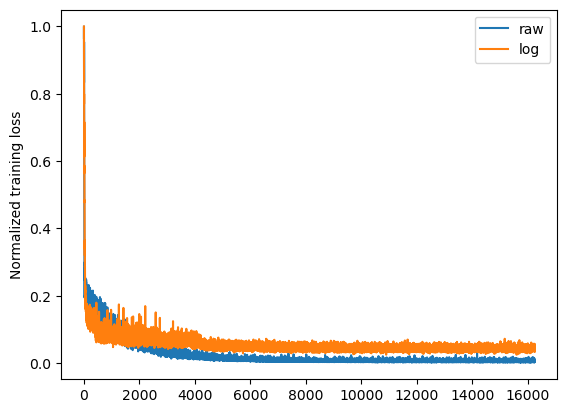

In [56]:
import time

scoring_methods=['neg_mean_squared_error','r2']

## List of training dataset types: raw MGIT TTP values or logaritmic MGIT TTP values
train_dataset_types=['raw','log']

## List of prediction models
model_names=['LSTM']

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

## Set training method and number of days to train on if training method is 'training_on_first_x_days'
training_methods=['training_on_whole_data','training_on_first_x_days']
random_state=44
data_split_random_state=44

## List of temporal dataframe names to drop from loaded dataframe (as they are highly sparse, perhaps only add noise?)
temporal_data_names=['ae_','cmind_','cmdos_','cmday_','mh']
temporal_data_to_drop=['out']
# If True, drop columns of temporal data given in the 'temporal_data_to_drop' list
drop_temporal=True

## Boolean if we want to update exsiting result_dict -> if False, the training will be run on only not-yet existing 
#  +ds_name+'_preproc_data.csv' files
update_existing_dicts=True


## List of model complexities: complexity here means which features are used as input for the model
# - LR: logistic regression with STUDY DAY as input ONLY  
# - BASE: multiple models with DRUG REGIMEN ONLY ==> NO Study day information
# - FULL: multiple models with ALL PATIENT DATA + DRUG REGIMEN  ==> NO Study day information
model_complexities=['day_only','regimen_only','full']


start=time.time()

for model_complex in model_complexities[2:]:
    print('++++++++++++++++++')
    print('Model type:',model_complex)
    for ds_name in [*parameters_for_analysis][-2:-1]:
    #for ds_name in [[*parameters_for_analysis][i] for i in (2,5)]:

        ## Select the number of training days for the training method 'training_on_first_x_days'
        parameter_dict=parameters_for_analysis[ds_name]
        training_days=parameter_dict['training_days']
        print('dataset name: ',ds_name)

        ## Load the preprocessed + imputed dataset
        try:
            data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv',index_col=0) 
        except FileNotFoundError:
            data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv.gz',index_col=0)
            
        if 'RACE' in data.columns:
            race_dict={'BLACK OR AFRICAN AMERICAN':'BLACK','MIXED RACE OR COLOURED':'MIXED','MIXED ETHNIC':'MIXED'}
            data['RACE']=data['RACE'].replace(race_dict,regex=True)
        

        ## Drop temporal column where less then 'temp_col_threshold' number of patients have entries
        #perc_pat_thr=0.1
        #temp_col_threshold=len(data['USUBJID'].unique()) * perc_pat_thr
        #print('Selecting columns with sufficient data')
        #data=drop_temporal_cols_with_insuff_data(data,temporal_data_names,temp_col_threshold)

        ## Drop predefined temporal data columns 
        data=data.loc[:,~data.columns.str.startswith(tuple(temporal_data_to_drop))]
        data=data.set_index('index')
        

        ## Check if result_dict already exists. If yes, load it, if not create a new one
        #fname='../data/'+ds_name+'_LSTM_regr_results.pickle'
        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        
        ## If result_dict doesn't exist yet or we want to update the existing result_dict -> 
        #  create empty result_dict and collect the results in it
        if os.path.exists(fname)==False or update_existing_dicts==True:
            result_dict={}
            #result_dict[ds_name]={}

        ## Check if test_data_results or cv_results already exists -> if not create them
        for result_type in ['test_data_results','cv_results','feat_importances']:
            if result_type not in result_dict.keys():
                result_dict[result_type]={}
        

        ## CustomLoss: mixture of loglos and MSEloss -> y-min_max has to be true for this loss!!!
        y_min_max=False
        custom_loss=False

        ## Choose CV features: number of folds and repeats for CV in the training + scoring method
        #### SET THIS TRUE FOR CV!!!! #########
        cross_validation=False
        #cross_validation=True

        ## If CV==False, set the numbers to 1 (they determine the number of rows and cols when plotting the results later)
        if cross_validation==False:
            k_folds=1
            num_of_cv_repeats=1

        if cross_validation==True:    
            num_of_cv_repeats=1
            k_folds=5
            
        

        # Define the hyperparameters
        lstm_parameters={#'input_size' :len(data.columns),## ==> willbe determined on the fly based on the number of vars due to model_complexity type
                        'batch_size':256,
                        'hidden_size':128,
                        'fc_hidden_dims':[64,32,8,4],
                        'num_of_lstm_layers':2,
                        'output_size':1,
                        'dropout_prob':0.1,
                        #'num_epochs':5,
                        'bidirectional':False,
                        'criterion':nn.MSELoss(),
                        'custom_criterion':CustomLoss(weight_logloss=0,
                                                    weight_mse_loss=0,
                                                    y_min_max=y_min_max,
                                                    weight=None)} # Weight: weight of labels (1:negative,0:positive)
        
        ## Stochastic weight averaging params
        ## https://pytorch.org/blog/pytorch-1.6-now-includes-stochastic-weight-averaging/

        ## Pretraining with AnnealingCosine LR scheduler => after pretraining CyclicLR, where every last
        #  swa_update_in_epoch_ratio * number_of_batches element in an epoch will update the AverageModel
        #  i.e. fastSWA: https://sh-tsang.medium.com/review-there-are-many-consistent-explanations-of-unlabeled-data-why-you-should-average-edcf5b3bfd7d
        swa_params={
                'pretrain_max_lr':5e-3,
                'pretrain_min_lr':5e-6,
                'pretrain_weight_decay':1e-4,
                'pretrain_epochs':200, # Num of epochs of pretraining

                'swa_epochs':50,    
                'swa_max_lr':1e-3,    
                'swa_min_lr':5e-6,            
                'swa_lr_cycle_length':20,
                'swa_update_in_cycle_ratio':0.1
                }                                                  

        print('Number of all patient visits: ',data.shape[0]) 
        print()

        ## Create dicts to collect test data, CV-results and importance scores for all training methods
        train_data_results={}
        test_data_results={}
        
        for training_method in training_methods[0:1]:
            print('training method: ',training_method)
            ### TRAIN MODELS AND SAVE CV-RESULTS + TEST DATA RESULTS #####
            ## Check if data already exists for given dataset -> only run training when training hasn't been run yet

            if training_method not in result_dict['test_data_results'].keys() \
                or training_method not in result_dict['cv_results'].keys():

                ## Update previously created dicts with ML results
                train_data_results,test_data_results=train_models(training_method,data,model_names,scoring_methods,\
                                                        train_dataset_types,training_days,random_state,data_split_random_state,\
                                                        test_data_results,train_data_results,lstm_parameters,swa_params,\
                                                        pat_id_df,y_min_max,custom_loss,ds_name,num_of_cv_repeats,k_folds,
                                                        start,model_complex,cross_validation=cross_validation,get_feature_importances=False)
                

                ## Add results of test data and CV to the result_dict
                result_dict['train_data_results']=train_data_results 
                result_dict['test_data_results']=test_data_results 
                #result_dict[ds_name_with_temp_df_names]['cv_results']=cv_results  

    ## Save results of ML on the given data
    fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
    with open(fname, 'wb') as f:
        pickle.dump(result_dict, f)            

# 3. PLOT RESULTS

## Training data

### Check weights during training

In [ ]:
num_of_epochs=swa_params['pretrain_epochs'] + swa_params['swa_epochs']
layers=['lstm.weight_hh_l0','lstm.weight_ih_l0','fc.3.weight','fc.6.weight','fc.9.weight']

for ds_name in [*parameters_for_analysis][:1]:
    for train_ds_type in train_dataset_types[1:2]:
        fig,axes=plt.subplots(len(layers),num_of_epochs,figsize=(5*num_of_epochs,5*len(layers)))
        for epoch in range(num_of_epochs):
            fn=f'../data/saved_lstm_models/{ds_name}_{train_ds_type}_epoch_{epoch+1}.pt'
            state_dict=pickle.load(open(fn,"rb"))

            for n,layer in enumerate(layers):
                ax=axes[n,epoch]
                #ax.hist(state_dict[layer].flatten(),label=epoch,bins=50)
                weight_mat=state_dict[layer]
                if 'lstm' in layer:
                    weight_mat=np.transpose(weight_mat)
                ax.imshow(weight_mat)
                #ax.legend(title='Epoch',labels=[epoch])
                ax.set_title(' - '.join([train_ds_type,layer,f'Epoch {epoch+1}']))
            #print(state_dict.keys())
            plt.subplots_adjust(hspace=0)
            #plt.tight_layout()


### Plot training loss curves

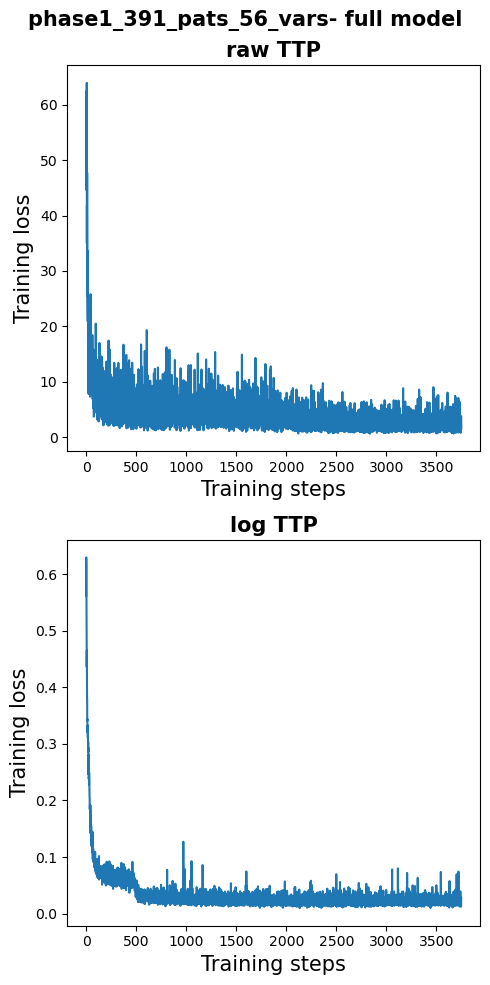

In [51]:
figtitle_size=30
subtitle_size=15
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=20

scoring_methods=['f1','precision','recall']
#model_names=['RandomForest','GradientBoost','XGBoost','DenseNetwork','SVC','KNN','LogisticRegression']#,'Lasso','Ridge']#,'ElasticNet']
model_names=['LSTM']

for model_complex in model_complexities[2:]:
    for ds_name in [*parameters_for_analysis][:1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)           

        training_data_results=result_dict['train_data_results']

        for training_method in training_methods[:1]:
            
            ncols=num_of_cv_repeats
            nrows=len(train_dataset_types)

            fig=plt.figure(figsize=((ncols)*5,(nrows)*5))
            n=0

            for train_ds_type in train_dataset_types:
                melted_df_list=[]
                for cv_rep in [*training_data_results[training_method][train_ds_type]][0:]:          
                    
                    ax=fig.add_subplot(nrows,ncols,n+1)
                    n=n+1
                    loss_dict=training_data_results[training_method][train_ds_type][cv_rep]['training_loss']
                    # Find the maximum length among the lists
                    max_length=max(len(lst) for lst in loss_dict.values())
                    # Pad the shorter lists with np.nan values
                    padded_loss_dict={key: lst + [np.nan]*(max_length - len(lst)) for key,lst in loss_dict.items()}

                    df=pd.DataFrame.from_dict(padded_loss_dict)
                    melted_df=pd.melt(df.reset_index(),id_vars='index',var_name='K-Fold',value_name='Training loss')
                    melted_df['CV-repeat']=cv_rep.split('_')[-1]

                    plot_df=melted_df.copy()#pd.concat(melted_df_list,axis=0)
                    if 'no_CV' in cv_rep:

                        plot_df=plot_df.drop(columns=['K-Fold'])
                        sns.lineplot(data=plot_df,y='Training loss',x='index',ax=ax)

                    if 'no_CV' not in cv_rep:
                        if num_of_cv_repeats==1:
                            sns.lineplot(data=plot_df,y='Training loss',x='index',hue='K-Fold',ax=ax)

                        if num_of_cv_repeats>1:
                            sns.lineplot(data=plot_df,y='Training loss',x='index',hue='K-Fold',ax=ax)
                            handles, labels = ax.get_legend_handles_labels()
                            ax.legend(handles=handles, labels=labels, title=f"CV-repeat: " + str(cv_rep.split('_')[-1]) +'\n   K-Fold')

                    ax.set_title(train_ds_type+' TTP',fontsize=subtitle_size,fontweight='bold')
                    ax.set_ylabel('Training loss',fontsize=y_label_size)
                    ax.set_xlabel('Training steps',fontsize=y_label_size)

                    

                    fig.suptitle('- '.join([ds_name,model_complex+' model']),fontsize=15,fontweight='bold')     
 
plt.tight_layout() 

### Plot learning rate schedule

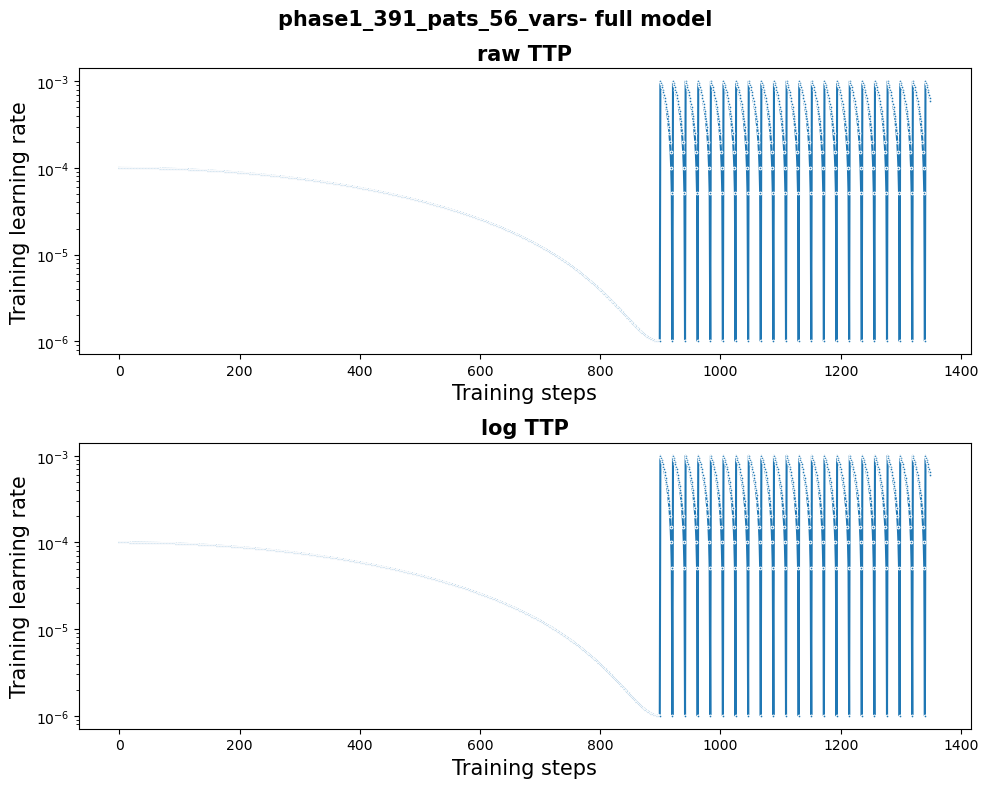

In [39]:
figtitle_size=30
subtitle_size=15
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=20

scoring_methods=['f1','precision','recall']
#model_names=['RandomForest','GradientBoost','XGBoost','DenseNetwork','SVC','KNN','LogisticRegression']#,'Lasso','Ridge']#,'ElasticNet']
model_names=['LSTM']
for model_complex in model_complexities[2:]:
    for ds_name in [*parameters_for_analysis][:1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)           

        training_data_results=result_dict['train_data_results']

        for training_method in training_methods[:1]:
            
            ncols=num_of_cv_repeats
            nrows=len(train_dataset_types)

            fig=plt.figure(figsize=((ncols)*10,(nrows)*4))
            n=0

            for train_ds_type in train_dataset_types:
                melted_df_list=[]
                for cv_rep in [*training_data_results[training_method][train_ds_type]][0:]:          
                    
                    ax=fig.add_subplot(nrows,ncols,n+1)
                    n=n+1
                    loss_dict=training_data_results[training_method][train_ds_type][cv_rep]['training_learning_rate']
                    # Find the maximum length among the lists
                    max_length=max(len(lst) for lst in loss_dict.values())
                    # Pad the shorter lists with np.nan values
                    padded_loss_dict={key: lst + [np.nan]*(max_length - len(lst)) for key,lst in loss_dict.items()}

                    df=pd.DataFrame.from_dict(padded_loss_dict)
                    melted_df=pd.melt(df.reset_index(),id_vars='index',var_name='K-Fold',value_name='Training learning rate')
                    melted_df['CV-repeat']=cv_rep.split('_')[-1]

                    plot_df=melted_df.copy()#pd.concat(melted_df_list,axis=0)
                    if 'no_CV' in cv_rep:
    
                        plot_df=plot_df.drop(columns=['K-Fold'])
                        sns.lineplot(data=plot_df,y='Training learning rate',x='index',ax=ax,marker='o',markersize=2)

                    if 'no_CV' not in cv_rep:
                        if num_of_cv_repeats==1:
                            sns.lineplot(data=plot_df,y='Training learning rate',x='index',hue='K-Fold',ax=ax,marker='o',markersize=2)

                        if num_of_cv_repeats>1:
                            sns.lineplot(data=plot_df,y='Training learning rate',x='index',hue='K-Fold',ax=ax)
                            handles, labels = ax.get_legend_handles_labels()
                            ax.legend(handles=handles, labels=labels, title=f"CV-repeat: " + str(cv_rep.split('_')[-1]) +'\n   K-Fold')

                    ax.set_title(train_ds_type+' TTP',fontsize=subtitle_size,fontweight='bold')
                    ax.set_ylabel('Training learning rate',fontsize=y_label_size)
                    ax.set_xlabel('Training steps',fontsize=y_label_size)
                    #ax.set_xlim(900,)
                    ax.set_yscale('log')
                    

                    fig.suptitle('- '.join([ds_name,model_complex+' model']),fontsize=15,fontweight='bold')    
 
plt.tight_layout() 

### Plot CV results

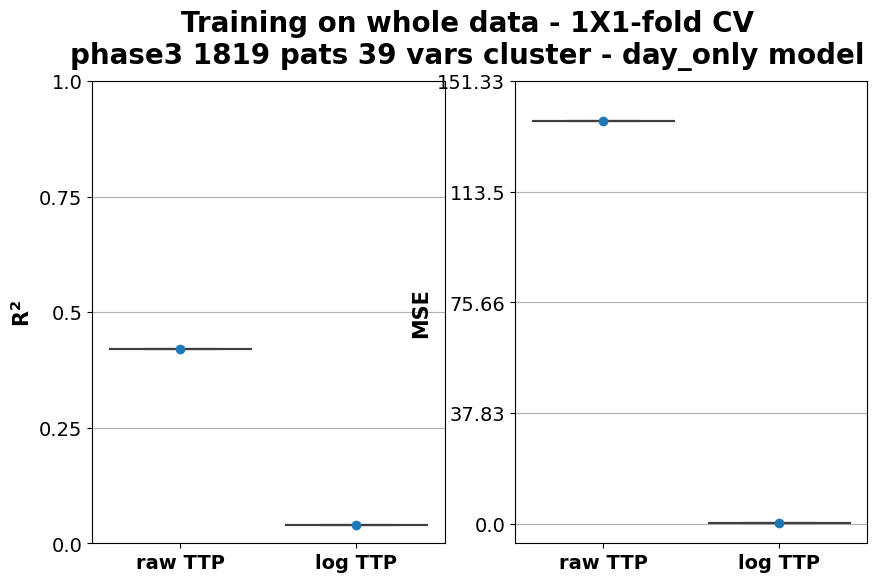

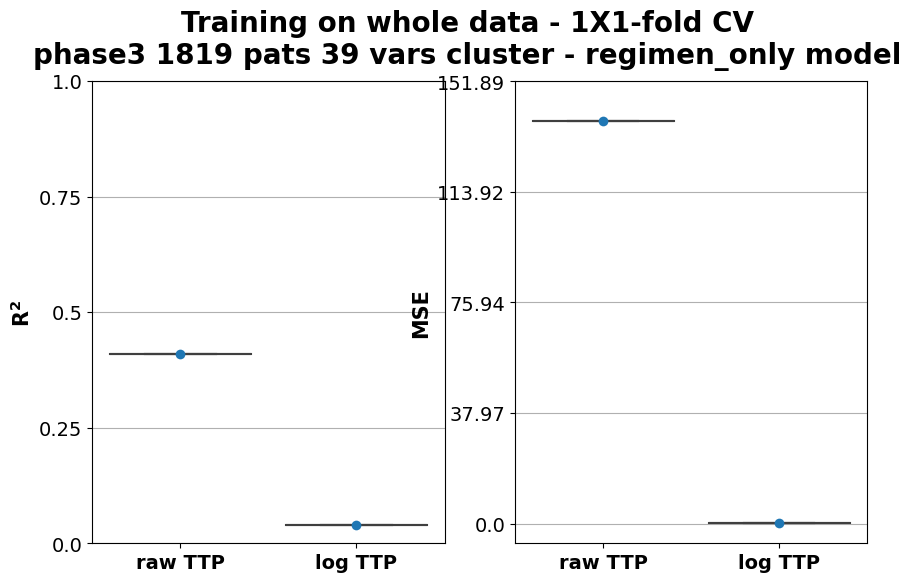

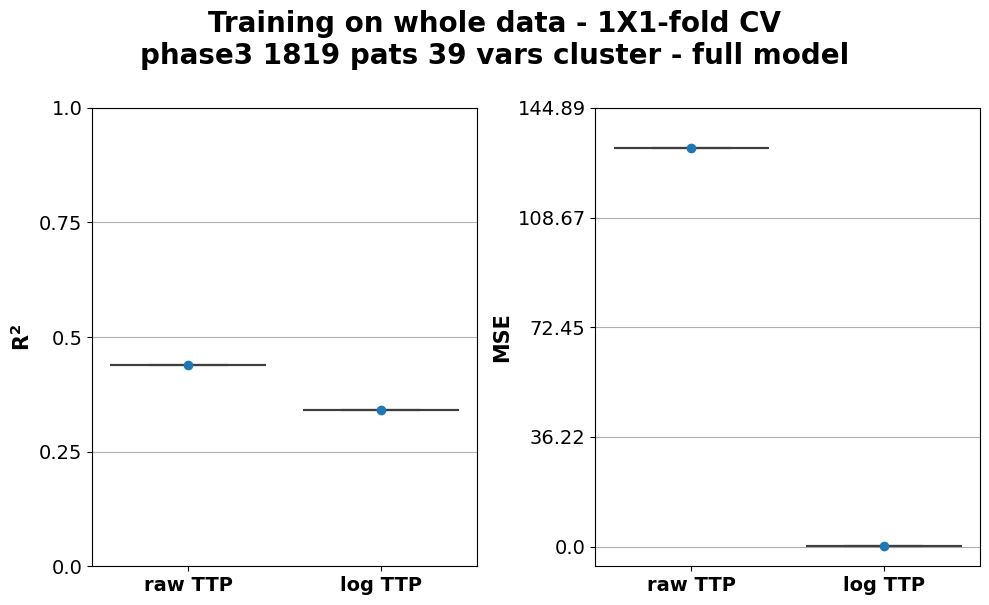

In [243]:
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
import matplotlib as mpl

figtitle_size=20
subplot_title_size=16
ylabel_size=12
text_size=18
legend_title_fontsize=13
scatter_dot_size=10
dot_size=7
x_tick_size=14
y_tick_size=14


model_names=['LSTM']
#train_dataset_types=['raw','log']

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase','USUBJID':'SubjectID'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


for model_complex in model_complexities[0:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        
        training_data_results=result_dict['train_data_results']

        df_list=[]
        for training_method in training_methods[:1]:  

            if training_method=='training_on_first_x_days':
                training_days=training_data_results['training_on_first_x_days']['training_days']
            
            cv_results={}
            for train_ds_type in train_dataset_types:

                cv_results[train_ds_type]={}
                r2_list,mse_list,cv_rep_list,=[],[],[]

                for cv_rep in [*training_data_results[training_method][train_ds_type]]:
                    k_fold_results=training_data_results[training_method][train_ds_type][cv_rep]['results']['validation']
                    
                    n=0
                    
                    for k_fold in [*k_fold_results]:
                        #print(k_fold_results[k_fold].keys())

                        model_name='LSTM_'+train_ds_type
                        actual_y=model_name+'_y'
                        #y_train_name=model_name+'_y_with_index'
                        predicted=model_name+'_predicted'

                        k_fold_results[k_fold][actual_y]

                        r2=round(r2_score(k_fold_results[k_fold][actual_y], k_fold_results[k_fold][predicted]),2)
                        mse=round(sklearn.metrics.mean_squared_error(k_fold_results[k_fold][actual_y], k_fold_results[k_fold][predicted]),2)

                        r2_list.append(r2)
                        mse_list.append(mse)
                        cv_rep_list.append(cv_rep.split('_')[-1])

                cv_results[train_ds_type]['r2']=r2_list
                cv_results[train_ds_type]['MSE']=mse_list
                cv_results[train_ds_type]['CV-repeat']=cv_rep_list

                df=pd.DataFrame.from_dict(cv_results[train_ds_type])
                df['Training type']=train_ds_type + ' TTP'
                df_list.append(df)

        ## Concatenate datqaframes of different training dataset types (i.e.raw TTP - log TTP)
        plot_df=pd.concat(df_list,axis=0)        


        metrics=['r2','MSE'][0:]
        ncols=len(metrics)
        nrows=1
        fig=plt.figure(figsize=(nrows*10,ncols*3))


        for n,scoring_method in enumerate(metrics[0:]):
            ax=fig.add_subplot(nrows,ncols,n+1)
            sns.boxplot(data=plot_df,y=scoring_method,x='Training type',ax=ax,boxprops={'facecolor':'none'})
            
            ## If no multiple CV repeats, then don't color by the CV-repeats column
            if len(plot_df['CV-repeat'].unique())==1:
                sns.swarmplot(data=plot_df,y=scoring_method,x='Training type',ax=ax,s=dot_size,dodge=False)
            if len(plot_df['CV-repeat'].unique())>1:
                sns.swarmplot(data=plot_df,y=scoring_method,x='Training type',ax=ax,hue='CV-repeat',s=dot_size,dodge=False)

            if scoring_method=='MSE':
                ylim=plot_df[scoring_method].values.max()*1.1

            if 'r2' in scoring_method:
                scoring_method=r"$\mathbf{R^{2}}$"
                #ylim=max(df.loc[:,df.columns.isin(model_names)].max().max() for df in r2_df_list)*1.1
                ylim=1

            ax.set_ylabel(scoring_method,fontsize=y_label_size,fontweight='bold')
            ax.set_xticklabels(ax.get_xticklabels(),fontsize=x_tick_size,fontweight='bold',rotation=0)

            ax.set_ylim(None,ylim)
            ax.set_yticks(np.linspace(0,ax.get_ylim()[1],5))
            ax.set_yticklabels(np.round(np.linspace(0,ax.get_ylim()[1],5),2),fontsize=y_tick_size)
            #title=train_data_type.split('_train')[0]+' TTP values'
            #ax.set_title(title,fontsize=subtitle_size,fontweight='bold')
            ax.set_xlabel('Training dataset',fontsize=y_label_size)
            ax.set_xlabel(None)
            ax.grid(axis='y')
            plt.tight_layout

    if training_method=='training_on_first_x_days':
        suptitle=training_method.replace('x',str(training_days))
        suptitle=suptitle.replace('_',' ').capitalize() + ' - '+ str(num_of_cv_repeats)+'X'+ str(k_folds)+'-fold CV'+'\n'+\
                    ds_name.replace('_',' ')+ ' - '+model_complex+' model'
                    
    else:
        suptitle=training_method.replace('_',' ').capitalize()+' - '+str(num_of_cv_repeats)+'X'+ str(k_folds)+'-fold CV'+\
                    '\n'+ds_name.replace('_',' ') + ' - '+model_complex+' model'
    fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=1)        
   
plt.tight_layout()

### Plot training data: __regression__

/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


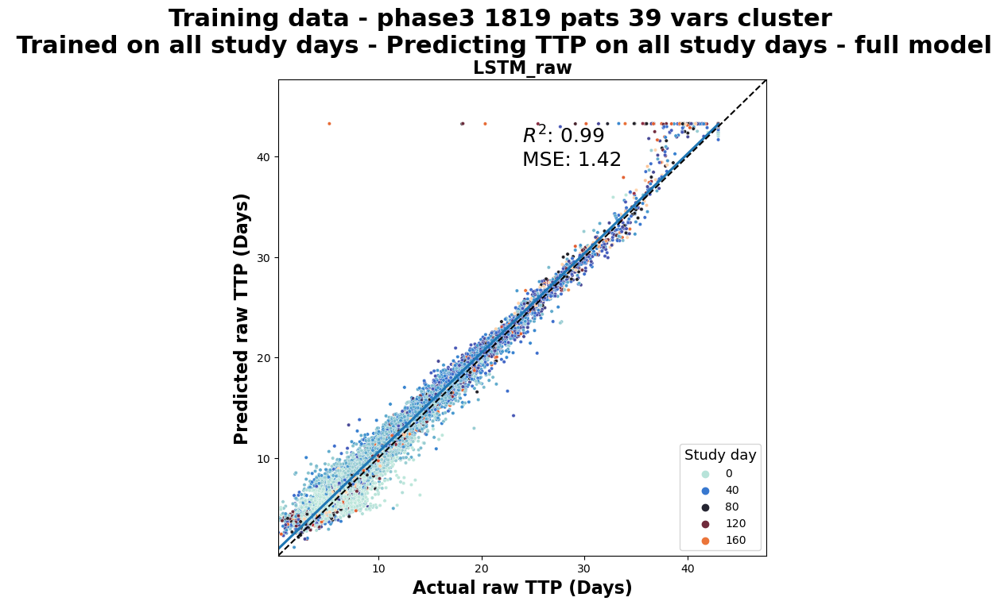

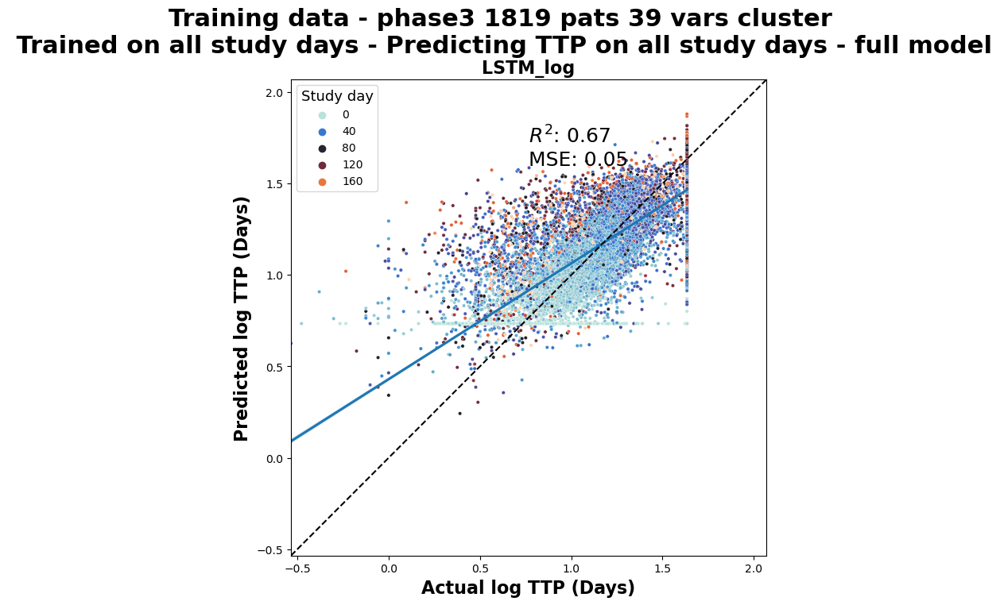

In [57]:
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
import matplotlib as mpl

figtitle_size=22
subplot_title_size=16
ylabel_size=16
text_size=18
legend_title_fontsize=13
scatter_dot_size=10


model_names=['LSTM']
#train_dataset_types=['raw','log']

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase','USUBJID':'SubjectID'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}

for model_complex in model_complexities[2:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        training_data_results=result_dict['train_data_results']

        for training_method in training_methods[:1]:  

            if training_method=='training_on_first_x_days':
                training_days=training_data_results['training_on_first_x_days']['training_days']
            
            for train_ds_type in train_dataset_types:
                for cv_rep in [*training_data_results[training_method][train_ds_type]]:
                    k_fold_results=training_data_results[training_method][train_ds_type][cv_rep]['results']['training']
                    
                    ncols=len([*k_fold_results])
                    nrows=len(train_dataset_types)
                    fig=plt.figure(figsize=(ncols*7,nrows*7))
                    n=0

                    for k_fold in [*k_fold_results]:

                        plot_dict={key: value for key, value in k_fold_results[k_fold].items() \
                                    if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                                'training_loss_dict'])}
                        pred_df=pd.DataFrame.from_dict(plot_dict)

                        model_name='LSTM_'+train_ds_type
                        actual_y=model_name+'_y'
                        y_train_name=model_name+'_y_with_index'
                        predicted=model_name+'_predicted'

                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1

                        y_train_with_index=k_fold_results[k_fold][y_train_name]

                        if training_method=='training_on_first_x_days':
                            study_length=int(y_train_with_index.index.get_level_values('DAY').max())
                            prediction_duration=range(training_days+1,study_length+1)

                        max_value=pred_df[[actual_y,predicted]].max().max()
                        min_value=pred_df[[actual_y,predicted]].min().min()
                        r2=round(r2_score(pred_df[actual_y], pred_df[predicted]),2)
                        mse=round(sklearn.metrics.mean_squared_error(pred_df[actual_y], pred_df[predicted]),2)

                        hue=y_train_with_index.index.get_level_values(color_by)
                        plot_df=pred_df.copy()
                        ## Add all columns to plot_df that can be used for coloring as hue
                        for color_legend in color_by_legend_title.keys():
                            plot_df[color_legend]=y_train_with_index.index.get_level_values(color_legend)
                        
                        ## IF hue is numeric change the range of the legend labels to avoid outliers messing it up
                        try:
                            y_train_with_index.index.get_level_values(color_by).astype(float)

                            # Define the desired range of hue values
                            hue_min=plot_df[color_by].quantile(0.05) 
                            hue_max=plot_df[color_by].quantile(0.98) 
                            norm_hue=mpl.colors.Normalize(hue_min,hue_max,clip=True)

                            plot_df[color_by+'_clipped']=plot_df[color_by].clip(hue_min,hue_max)
                            
                            ### PLOT values
                            scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by+'_clipped',s=scatter_dot_size,\
                                                    hue_norm=norm_hue,legend=True,palette='icefire',vmin=hue_min,vmax=hue_max)   

                            legend_handles, orig_labels= scatter.get_legend_handles_labels()
                            legend_labels=plot_df[color_by].quantile(np.linspace(0.05,0.98,len(legend_handles))).tolist()
                            legend_labels=[round(x) for x in legend_labels]
                            ax.legend(handles=legend_handles,labels=legend_labels,
                                    title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize,
                                    loc='lower right')
                        
                        ## IF hue is categorical, just plot the scatterplot with the regular legend
                        except TypeError:
                            scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by,s=scatter_dot_size,\
                                                    legend=True,palette='icefire')
                        sns.regplot(data=plot_df,x=actual_y,y=predicted,ax=ax,scatter=False)
                        #sns.jointplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by)
                        ax.set_ylim(min_value,max_value*1.1)
                        ax.set_xlim(min_value,max_value*1.1)
                        text=r"$R^2$: "+ str(r2)+'\nMSE: '+str(mse)
                        axis_range=max_value*1.1-min_value
                        ax.text(0.5*axis_range+min_value,0.82*axis_range+min_value,text,fontsize=text_size)

                        ylabel='Predicted '+ train_ds_type+' TTP (Days)'
                        ax.set_ylabel(ylabel,fontsize=ylabel_size,fontweight='bold')
                        xlabel='Actual '+ train_ds_type+' TTP (Days)'
                        ax.set_xlabel(xlabel,fontsize=ylabel_size,fontweight='bold')

                        ax.plot(ax.get_xlim(), ax.get_ylim(),color='black', linestyle='dashed')
                        
                        if 'no_CV' in cv_rep:
                            subtitle=model_name
                        if 'no_CV' not in cv_rep:
                            subtitle=model_name+' - K-Fold: '+str(k_fold+1)

                        ax.set_title(subtitle,fontsize=subplot_title_size,fontweight='bold')
                        ax.legend(title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize)

                    if training_method=='training_on_first_x_days':
                        if 'no_CV' in cv_rep:
                            suptitle='Training data - '+ ds_name.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                                        ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) 
                        if 'no_CV' not in cv_rep:
                            uptitle='Training data - '+ ds_name.replace('_',' ')+' - CV-rep:'+str(int(cv_rep.split('_')[-1]))+'\n'+\
                                            training_method_fig_title[training_method] + " "+\
                                            str(training_days)+' - Predicting TTP on days '+\
                                            str(prediction_duration[0])+ ' - '+str(prediction_duration[-1])       
                                    
                    else:
                        if 'no_CV' in cv_rep:
                            suptitle='Training data - '+ ds_name.replace('_',' ')+ '\n '+training_method_fig_title[training_method] + ' - '+model_complex+' model'
                        
                        if 'no_CV' not in cv_rep:
                            suptitle='Training data - '+ ds_name.replace('_',' ')+' - CV-rep: '+str(int(cv_rep.split('_')[-1]))+ \
                                    '\n '+training_method_fig_title[training_method]  + ' - '+model_complex+' model'
                        
                    fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold')
                plt.tight_layout()
   
        


### Plot training data: __classification__

/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/61496270.py:156: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/61496270.py:156: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/61496270.py:156: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), ax

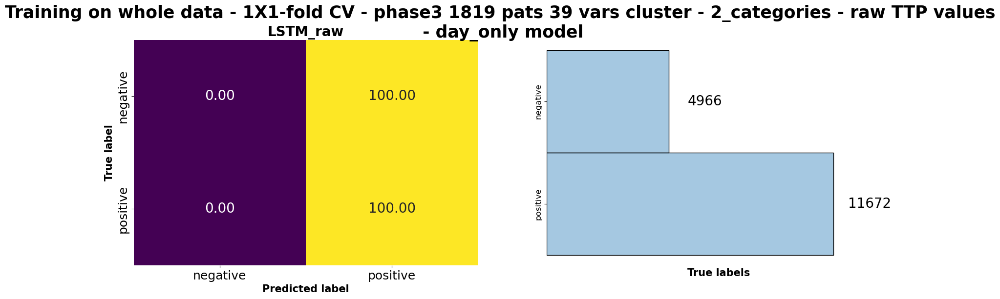

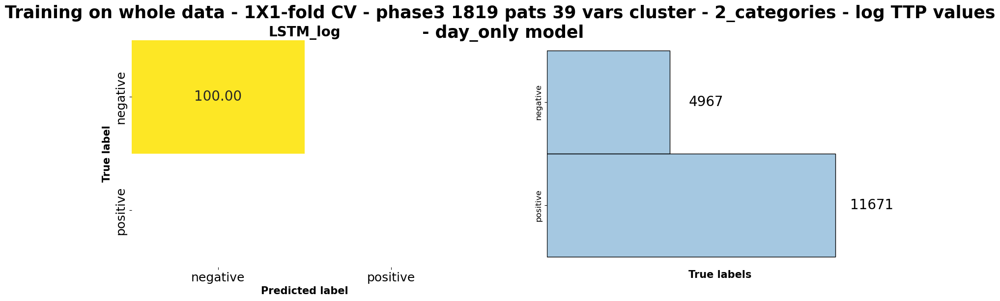

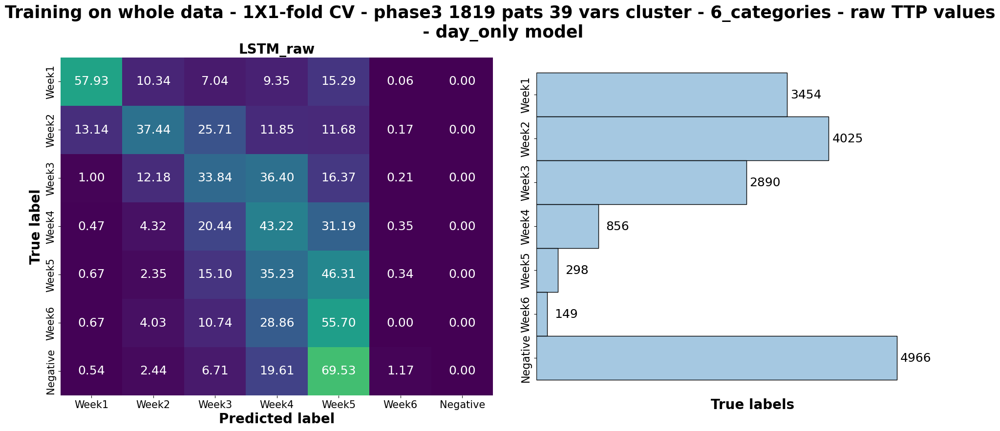

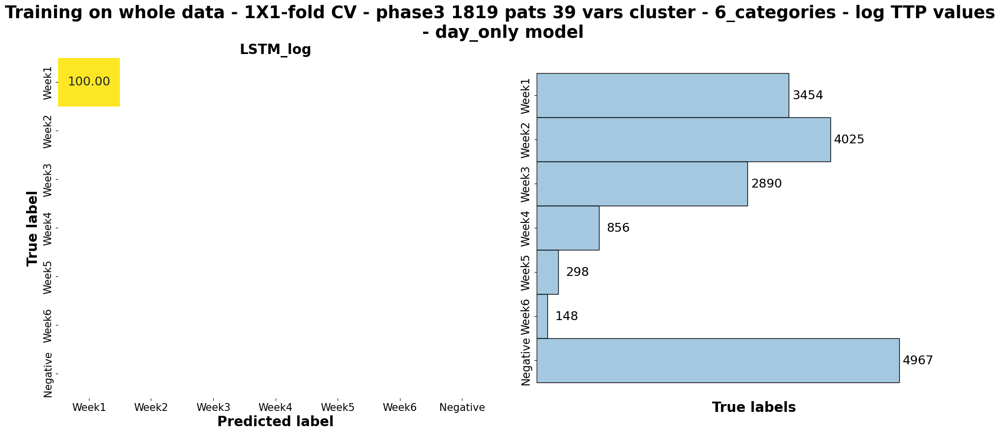

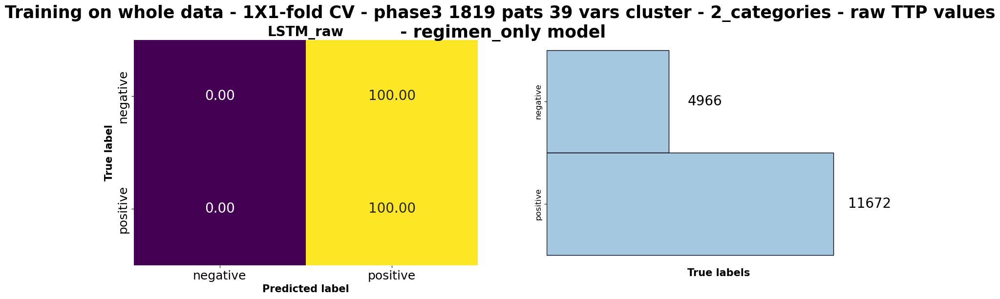

...

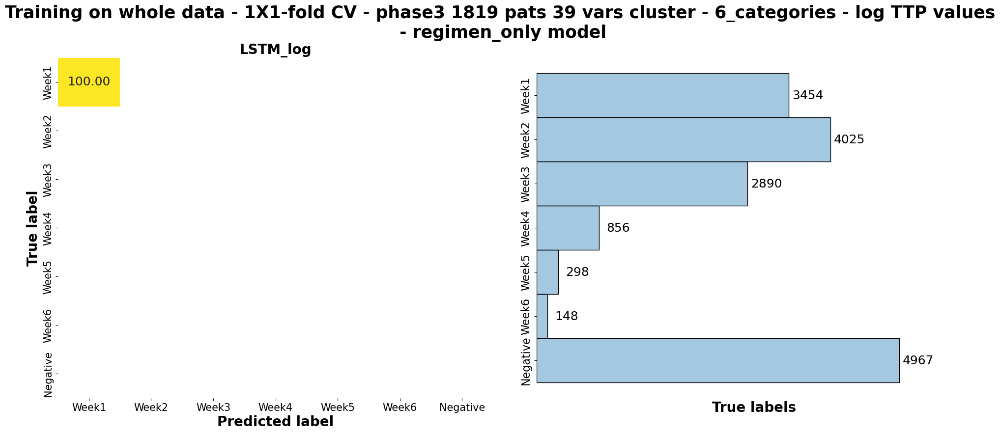

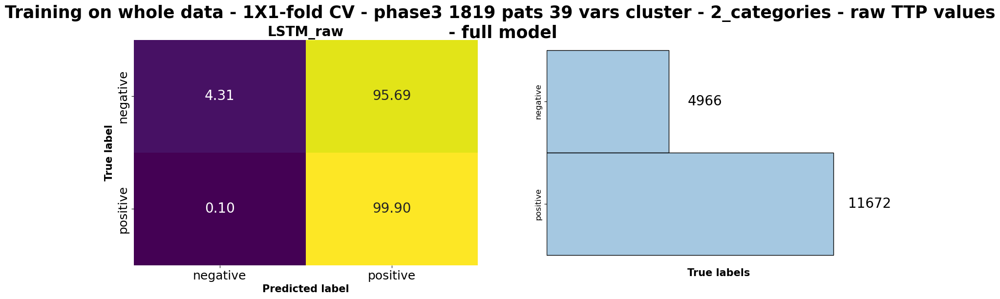

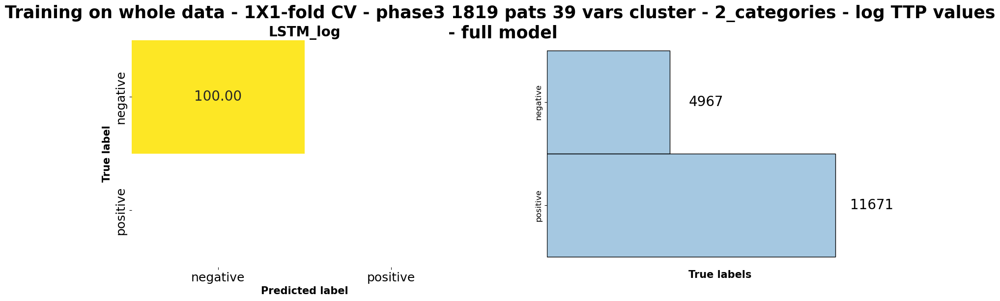

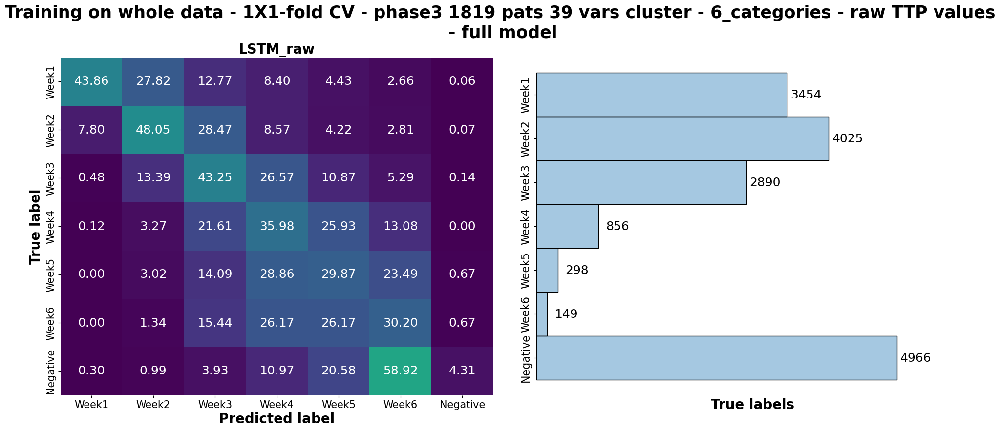

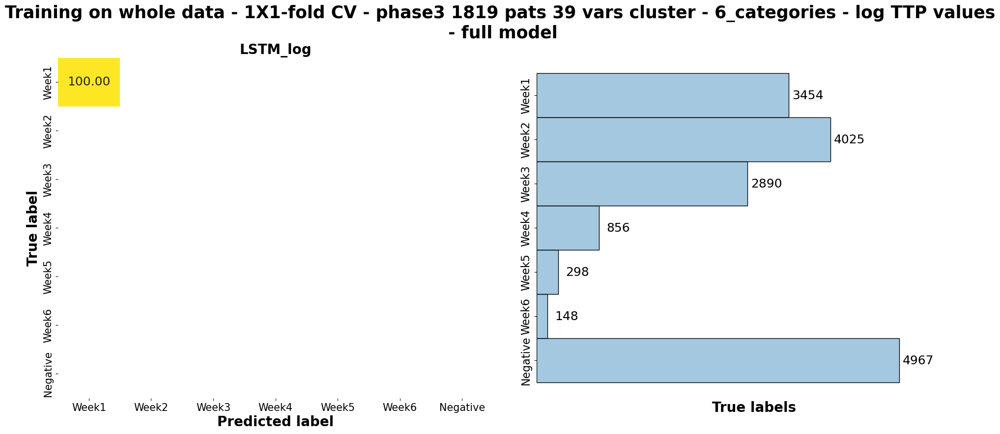

In [245]:
from sklearn import metrics

figtitle_size=25
subtitle_size=20
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=15

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

model_names=['LSTM']

train_dataset_types=['raw','log']
#train_dataset_types=['log']
training_methods=['training_on_whole_data']
data_split_random_state=44

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


## Dictionary for the conversion of TTP values to labels
categorical_map_dict={'2_categories':{'bins':[float('-inf'),42,float('inf')],'labels':[1,0],
                                      'labels_str':['positive','negative'],
                                      'weights':[1,2]},
                      '6_categories':{'bins':[float('-inf'),1*7,2*7,3*7,4*7,5*7,6*7,float('inf')],'labels':[0,1,2,3,4,5,6],
                                     'labels_str':['Week1','Week2','Week3','Week4','Week5','Week6','Negative'],
                                     'weights':[1,1,1,1,1,1,2]}}
for model_complex in model_complexities[0:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        training_days=parameters_for_analysis[ds_name]['training_days']
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        training_data_results=result_dict['train_data_results']
        #test_data_results=result_dict[ds_name]['test_data_results']
        #training_days=training_data_results['training_on_first_x_days']['training_days']

        for training_method in training_methods[:1]:
            for categorical_map_name in [*categorical_map_dict][0:2]:
                for train_ds_type in train_dataset_types:
                    confusion_matrix_list=[]

                    if '2' in categorical_map_name:
                        row_width_fact=10
                        col_height_fact=6
                        ncols=(num_of_cv_repeats)*2
                        nrows=1#len(train_dataset_types)
                        hspace=0.3
                        wspace=0.2
                        y_label_size=15
                        bar_annot_fontsize=20
                        x_tick_size=18
                        y_tick_size=18
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)

                    else:  
                        row_width_fact=12
                        col_height_fact=9
                        ncols=2
                        nrows=(num_of_cv_repeats)
                        hspace=0.2
                        wspace=0.1
                        y_label_size=20
                        bar_annot_fontsize=18
                        x_tick_size=15
                        y_tick_size=15
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)    
                    
                    #fig=plt.figure(figsize=(nrows*10,ncols*4))
                    n=0
                    for cv_rep in [*training_data_results[training_method][train_ds_type]]:
                        
                        k_fold_results=training_data_results[training_method][train_ds_type][cv_rep]['results']['training']

                        for k_fold in [*k_fold_results]:
                            #print(k_fold_results[k_fold].keys())

                            plot_dict={key: value for key, value in k_fold_results[k_fold].items() \
                                        if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                                    'training_loss_dict'])}
                            pred_df=pd.DataFrame.from_dict(plot_dict)

                            model_name='LSTM_'+train_ds_type
                            actual_y=model_name+'_y'
                            y_train_name=model_name+'_y_with_index'
                            predicted=model_name+'_predicted'


                            ## Check if data is min-max standardised -> revert standardisation 
                            if pred_df[actual_y].values.max()<=1.1:
                                min_val=0
                                max_value=1/(24*3600)+42
                                for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                                    pred_df.loc[:,pred_df.columns.str.contains(ds_type)]=max_value * pred_df.loc[:,pred_df.columns.str.contains(ds_type)]

                            ## If no min-max standardisation convert only log values back
                            if train_ds_type=='raw' and pred_df['LSTM_raw_y'].values.max()>1:
                                pred_df.loc[:,pred_df.columns.str.contains('log_')]=10**pred_df.loc[:,pred_df.columns.str.contains('log_')]

                            ## Convert numerical TTP values to categorical labels
                            categorical_map=categorical_map_dict[categorical_map_name]
                            pred_df_cat=pred_df.apply(pd.cut,bins=categorical_map['bins'],labels=categorical_map['labels'])

                            if pred_df_cat[predicted].isna().any()==True:
                                print(pred_df_cat[predicted].isna())
                                print(pred_df[predicted][pred_df_cat[predicted].isna().values])

                            confusion_matrix=pd.crosstab(pred_df_cat[actual_y], pred_df_cat[predicted], 
                                                    rownames=['Actual'], colnames=['Predicted'],margins=True)

                            ## Convert to dataframe and rename columns to label strings from numbers
                            confusion_matrix_=metrics.confusion_matrix(pred_df_cat[actual_y], pred_df_cat[predicted],normalize='true')
                            confusion_matrix_=pd.DataFrame(confusion_matrix_)
                            label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                                categorical_map_dict[categorical_map_name]['labels_str']))

                            confusion_matrix_=confusion_matrix_.rename(columns=label_dict)
                            confusion_matrix_=confusion_matrix_.rename(index=label_dict)

                            ## If by chance one label was not in the data, add it to the confusion matrix with full 0s
                            #  i.e Week 5 datapoints were not in the training data due to random split -> Week5 is missing from
                            #  confusion matrix -> add Week5 as a columns and rows and set its values to 0
                            missing_labels=[lab for lab in categorical_map['labels_str'] if lab not in confusion_matrix_.columns]
                            ## Add missing label to cols and rows
                            confusion_matrix_[missing_labels]=np.nan
                            for lab in missing_labels:
                                confusion_matrix_.loc[lab]=np.nan

                            ## Reorder columns and indices based on the categorical labels
                            if '2' in categorical_map_name:
                                order_list=['negative','positive']#categorical_map['labels_str'].reverse()
                            else:
                                order_list=categorical_map['labels_str']                            

                            confusion_matrix_=confusion_matrix_.reindex(columns=order_list)
                            confusion_matrix_=confusion_matrix_.reindex(index=order_list)
                            confusion_matrix_list.append(confusion_matrix_)
                    
                    
                        #for aa in confusion_matrix_list:
                        #    print(aa.shape)
                        confusion_matrix_vals_list=[df.values for df in confusion_matrix_list]
                        conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
                        conf_mat_std_dev=np.nanstd(np.array(confusion_matrix_vals_list), axis=0)

                        conf_mat_avg_df=pd.DataFrame(conf_mat_avg,columns=order_list,index=order_list)
                        conf_mat_std_dev_df=pd.DataFrame(conf_mat_std_dev,columns=order_list,index=order_list)

                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1
                        sns.heatmap(conf_mat_avg_df*100,ax=ax,annot=True,cbar=False, cmap='viridis', fmt='.2f',
                                    annot_kws={"size":bar_annot_fontsize},vmin=0, vmax=100)
                        
                        if 'no_CV' in cv_rep:
                            subtitle=model_name
                        if 'no_CV' not in cv_rep:
                            subtitle='-'.join([model_name,cv_rep])

                        ax.set_title(subtitle,fontsize=subtitle_size,fontweight='bold')
                        ax.set_ylabel('True label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xlabel('Predicted label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xticklabels(ax.get_xticklabels(), fontsize=x_tick_size)
                        ax.set_yticklabels(ax.get_yticklabels(), fontsize=y_tick_size)


                        ## Add the distribution of the predicted variable as last subplot
                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1

                        #categorical_map_name_key=list(set(['_'.join([model_name,train_ds_type,'y_with_index']) for key in \
                            #                           training_data_results[training_method].keys() if 'y_with_index' in key]))[0] 
                        
                        if train_ds_type=='raw':
                            y_as_log=False
                        if train_ds_type=='log':    
                            y_as_log=True

                        _,y_with_index=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)

                        #plot_df=training_data_results[training_method][categorical_map_name_key]
                        training_pat_ids=training_data_results[training_method][train_ds_type][cv_rep]['training_pat_ids']
                        plot_df=y_with_index.reset_index()
                        plot_df=plot_df[plot_df['USUBJID'].isin(training_pat_ids)]
                        #plot_df=plot_df.rename(columns=color_by_legend_title)

                        ## Check if data is min-max standardised -> revert standardisation 
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()<=1.1:
                            if train_ds_type=='raw':
                                max_value=1/(24*3600)+42
                            if train_ds_type=='log':
                                    max_value=np.log10(1/(24*3600)+42) 
                            #for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                            plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']=max_value * plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']

                        ## If no min-max standardisation convert only log values back
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()>1:
                            plot_df.loc[:,plot_df.columns.str.contains('log_')]=10**plot_df.loc[:,plot_df.columns.str.contains('log_')]

                        label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                                categorical_map_dict[categorical_map_name]['labels_str']))

                        ## Convert log TTP values back to raw TTp values
                        if train_ds_type=='log':
                            plot_df['mb_Time to Detection_STD_NUM_RESULT']=10**(plot_df['mb_Time to Detection_STD_NUM_RESULT']).values


                        ## Transform into categorical column and drop numerical column of target
                        plot_df['mb_Time to Detection_RESULT']=pd.cut(plot_df['mb_Time to Detection_STD_NUM_RESULT'],
                                                                        bins=categorical_map['bins'],
                                                                        labels=categorical_map['labels']).values
                        plot_df['mb_Time to Detection_RESULT']=plot_df['mb_Time to Detection_RESULT'].replace(label_dict,regex=True)

                        if '2' in categorical_map_name:
                            plot_df['mb_Time to Detection_RESULT']=pd.Categorical(plot_df['mb_Time to Detection_RESULT'],['negative','positive'])
                            bar_offset_fact=0.12
                        else:
                            bar_offset_fact=0.05  

                        histp=sns.histplot(data=plot_df,y='mb_Time to Detection_RESULT',ax=ax,#hue=color_by_legend_title[color_by],
                                            alpha=0.4,kde=False,linewidth=None)
                        
                        # Add count annotations next to the bars
                        for p in histp.patches:
                            histp.annotate(f'{int(p.get_width())}', (p.get_width()+ax.get_xlim()[1]*bar_offset_fact, p.get_y()+p.get_height() / 2), 
                                            ha='center', va='center',fontsize=bar_annot_fontsize)

                        # Remove x-label ticks on the x-axis
                        ax.set_xticks([])                       
                        ax.set_xlim(0,int(round(plot_df['mb_Time to Detection_RESULT'].value_counts().max()*1.2)))
                        ax.set_xlabel('True labels',fontsize=y_label_size,fontweight='bold')
                        #ax.set_ylabel('Count',fontsize=ylabel_size,fontweight='bold')
                        # Remove y-axis ticks and labels

                        # Set y-axis tick positions and labels
                        ax.set_ylabel('') 
                        ax.tick_params(axis='y', labelsize=y_label_size*0.8)
                        
                        for label in ax.get_yticklabels():
                            label.set_rotation(90)
                            label.set_va('center')
                        #ax.set_title('Label distribution',fontsize=y_label_size,fontweight='bold')
                        
                        # Remove the frame (border) around the plot
                        ax.spines['top'].set_visible(False)
                        ax.spines['right'].set_visible(False)
                        ax.spines['bottom'].set_visible(False)
                        ax.spines['left'].set_visible(False)

                        if training_method=='training_on_first_x_days':
                                suptitle=training_method.replace('x',str(training_days))
                                suptitle=suptitle.replace('_',' ').capitalize() + ' - '+ str(num_of_cv_repeats)+'X'+ \
                                        str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values'  + ' - '+model_complex+' model'
                                        
                        else:
                            suptitle=training_method.replace('_',' ').capitalize()+' - '+str(num_of_cv_repeats)+'X'+ \
                                    str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values\n'   + ' - '+model_complex+' model'
                    fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=1)

            
            

### REDO THIS! UMAP of training data with prediction error 

/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


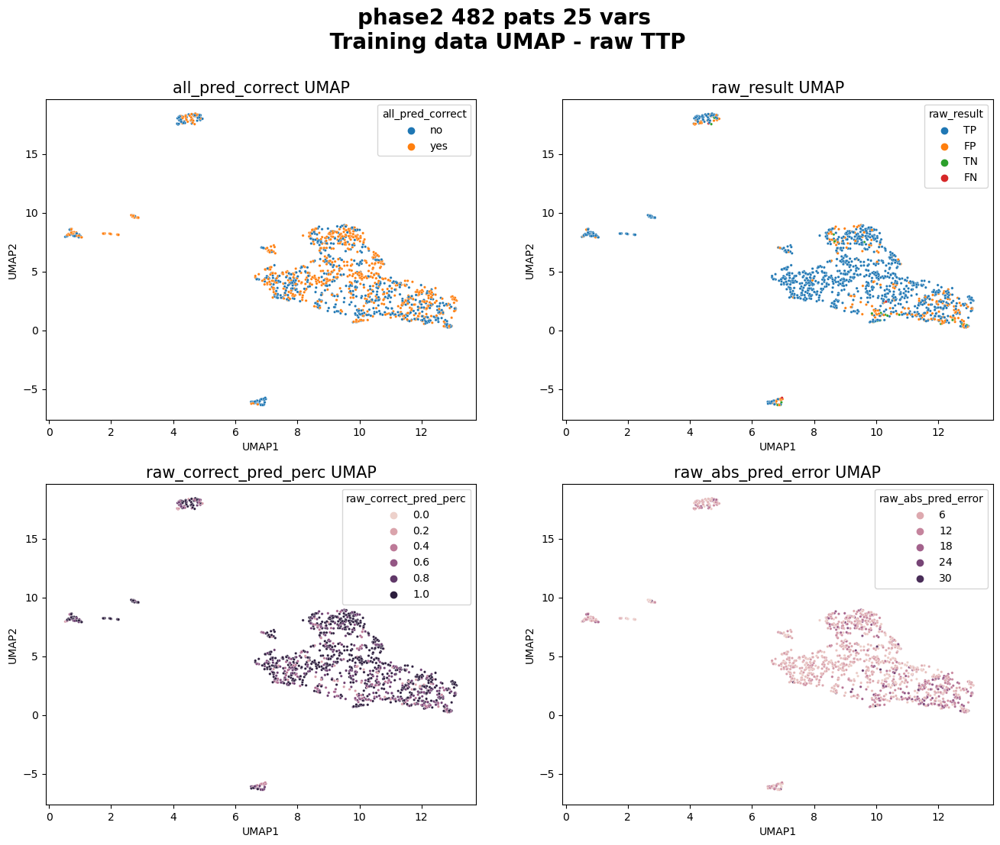

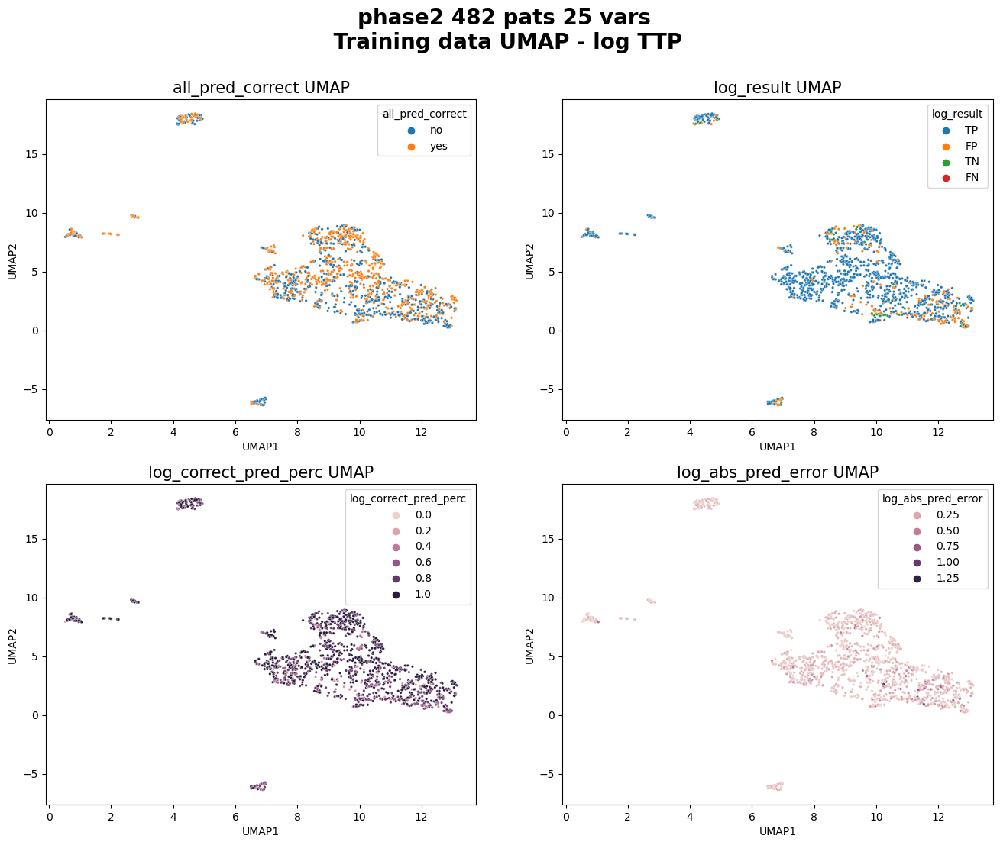

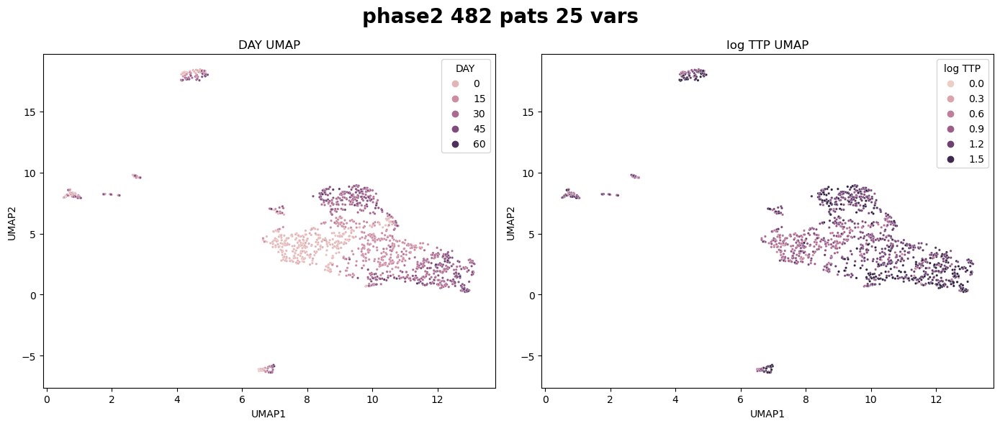

In [ ]:
import umap

figtitle_size=20
subtitle_size=15
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=15
dot_size=6

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

temporal_data_names=['ae_','cmind_','cmdos_','cmday_','mh']

model_names=['LSTM']

train_dataset_types=['raw','log']
#train_dataset_types=['log']
training_methods=['training_on_whole_data']
data_split_random_state=44

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


## Dictionary for the conversion of TTP values to labels
categorical_map_dict={'2_categories':{'bins':[float('-inf'),42,float('inf')],'labels':[1,0],
                                      'labels_str':['positive','negative'],
                                      'weights':[1,2]},
                      '6_categories':{'bins':[float('-inf'),1*7,2*7,3*7,4*7,5*7,6*7,float('inf')],'labels':[0,1,2,3,4,5,6],
                                     'labels_str':['Week1','Week2','Week3','Week4','Week5','Week6','Negative'],
                                     'weights':[1,1,1,1,1,1,2]}}

for ds_name in [*parameters_for_analysis][1:2]:
#for ds_name in [[*parameters_for_analysis][i] for i in (2,5,12)]:
    
    ## Load the preprocessed + imputed dataset
    data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv',index_col=0,low_memory=False)  

    training_days=parameters_for_analysis[ds_name]['training_days']
    fname='../data/'+ds_name+'_LSTM_regr_results.pickle'
    if os.path.exists(fname):
        with open(fname,'rb') as f:
            result_dict=pickle.load(f)
    

    training_data_results=result_dict[ds_name]['train_data_results']
    #test_data_results=result_dict[ds_name]['test_data_results']
    #training_days=training_data_results['training_on_first_x_days']['training_days']

    #X_train, X_test, y_train, y_test,\
    #            y_train_log, y_test_log,\
    #            y_test_vals,y_test_log_vals,\
    #            y_train_vals,y_train_log_vals,std_training_days=split_training_data(training_method,data,pat_id_df,\
    #                                                                                       training_days,data_split_random_state,y_min_max)    

    
    for training_method in training_methods[:1]:
        
        for categorical_map_name in [*categorical_map_dict][:1]:    

            ## Extract predicted and actual values saved during training and create a dataframe out of them
            plot_dict={key: value for key, value in training_data_results[training_method].items() \
                    if all(exclude_string not in key for exclude_string in ['_with_index','_x','_model','training_loss_dict'])}
            pred_df=pd.DataFrame.from_dict(plot_dict)

            ## Check if data is min-max standardised -> revert standardisation 
            if pred_df['LSTM_raw_y'].values.max()<=1:
                min_val=0
                max_value=1/(24*3600)+42
                for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                    pred_df.loc[:,pred_df.columns.str.contains(ds_type)]=max_value * pred_df.loc[:,pred_df.columns.str.contains(ds_type)]

            ## If no min-max standardisation convert only log values back
            elif pred_df['LSTM_raw_y'].values.max()>1:
                pred_df.loc[:,pred_df.columns.str.contains('log_')]=10**pred_df.loc[:,pred_df.columns.str.contains('log_')]

            ## Convert numerical TTP values to categorical labels
            categorical_map=categorical_map_dict[categorical_map_name]
            pred_df_cat=pred_df.apply(pd.cut,bins=categorical_map['bins'],labels=categorical_map['labels'])
            
            ## PLotting parameters
            num_col=1
            num_row=len(train_ds_type)
            row_width_fact=3
            col_height_fact=15
            #fig=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            #fig2=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            #fig3=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            
            for n,train_ds_type in enumerate(train_dataset_types):
                actual_y='_'.join(['LSTM',train_ds_type,'y'])
                predicted='_'.join(['LSTM',train_ds_type,'predicted'])
                x_train='_'.join(['LSTM',train_ds_type,'x'])

                # Add new column with information about the result of prediction (FN,FP,TN,TP)
                pred_df_cat[train_ds_type+'_result']=np.where((pred_df_cat[actual_y]==0)&(pred_df_cat[predicted]==0),'TN',
                                                        np.where((pred_df_cat[actual_y]==1)&(pred_df_cat[predicted]==1),'TP',
                                                        np.where((pred_df_cat[actual_y]==1)&(pred_df_cat[predicted]==0),'FN',
                                                        np.where((pred_df_cat[actual_y]==0)&(pred_df_cat[predicted]==1),'FP', 'unknown'))))

                ## Add columns of pred_df_cat to the y_with_index
                model_name='LSTM_'+train_ds_type
                actual_y_with_index=model_name+'_y_with_index'
                y_with_index=training_data_results[training_method][actual_y_with_index]
                y_with_index[pred_df_cat.columns.tolist()]=pred_df_cat.values
                y_res_df=y_with_index.reset_index()
            
                X_train=training_data_results[training_method][x_train]

                ## Check for patients whose timepoints were all predicted correctly
                result_check=y_res_df.groupby('USUBJID')[train_ds_type+'_result'].apply(lambda x: all(x.isin(['TP', 'TN'])))
                pats_with_corr_preds=result_check[result_check].index

                ## Extract percentage of correctly predicted TTp values for each patient
                #  i.e. 7 TTPs are TP/TN out of 10 TTP -> percentage=7/10
                corr_pred_perc=y_res_df.groupby('USUBJID')[train_ds_type+'_result'].apply(lambda x: len(x[x.isin(['TP', 'TN'])])/len(x))

                '''
                ## Plot TTP values of patients whose TTP values were ALL correctly predicted 
                ax=fig.add_subplot(num_row,num_col,n+1)
                sns.lineplot(data=y_res_df[y_res_df['USUBJID'].isin(pats_with_corr_preds)],x='DAY',
                             y='mb_Time to Detection_STD_NUM_RESULT',hue='USUBJID',ax=ax,marker='o')
                #ax.set_title(train_ds_type+' TTP values')      
                ax.set_ylabel(train_ds_type+' TTP values',fontsize=y_label_size)     
                ax.set_xlabel('Study day',fontsize=y_label_size)  
                ax.get_legend().remove()    


                ## Plot TTP values of patients where at least one visit's TTP was incorrectly predicted 
                ax2=fig2.add_subplot(num_row,num_col,n+1) 
                sns.lineplot(data=y_res_df[~y_res_df['USUBJID'].isin(pats_with_corr_preds)],x='DAY',
                             y='mb_Time to Detection_STD_NUM_RESULT',hue='USUBJID',ax=ax2,marker='o')
                #ax.set_title(train_ds_type+' TTP values')      
                ax2.set_ylabel(train_ds_type+' TTP values',fontsize=y_label_size)     
                ax2.set_xlabel('Study day',fontsize=y_label_size)  
                ax2.get_legend().remove()
                
                '''
                ### PLOT UMAPS OF TRAINING DATA ### 

                ## Extract variables from X_train_slid_wind in order to plot UMAP
                #  If not raise error to create them    
                if training_method=='training_on_first_x_days':
                    fn_x='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_X_train_data'])+'.csv.gz'
                    
                if training_method=='training_on_whole_data':
                    fn_x='_'.join([ds_name,'whole_data','LSTM_slid_window_X_train_data'])+'.csv.gz'
            
                fname_x=os.path.join('../data',fn_x)
                X_train_slid_wind=pd.read_csv(fname_x,index_col=0,nrows=0,low_memory=False)
                X_train_=X_train.loc[:,X_train.columns.isin(X_train_slid_wind.columns)]
                X_train_=X_train_.loc[:,~X_train_.columns.str.startswith(tuple(temporal_data_names))]


                ## Perform UMAP dimensionality reduction
                umap_reducer=umap.UMAP(n_neighbors=20, min_dist=0.1, n_components=2, random_state=42)
                umap_result=umap_reducer.fit_transform(X_train_.drop(columns=['USUBJID']))
                y_res_df[['UMAP1', 'UMAP2']]=umap_result


                ## Add columns indicating points of patients with all correct predictions
                y_res_df['all_pred_correct']=np.nan
                y_res_df.loc[y_res_df['USUBJID'].isin(pats_with_corr_preds),'all_pred_correct']='yes'
                y_res_df.loc[~y_res_df['USUBJID'].isin(pats_with_corr_preds),'all_pred_correct']='no'

                ## Add percentage of correctly predicted TTP values per patient as a new column
                d=pd.Series(corr_pred_perc.values,index=corr_pred_perc.index).to_dict()
                y_res_df[train_ds_type+ '_correct_pred_perc']=y_res_df.loc[:,'USUBJID'].map(d)

                ## Add error of TTP prediction as a column
                y_predicted=training_data_results[training_method][predicted]
                y_res_df[train_ds_type+'_predicted']=y_predicted
                y_res_df[train_ds_type+'_abs_pred_error']=abs(y_res_df['mb_Time to Detection_STD_NUM_RESULT']-y_res_df[train_ds_type+'_predicted'])

                ## Rename some columns for better readability
                y_res_df[train_ds_type+' TTP']=y_res_df['mb_Time to Detection_STD_NUM_RESULT']
                y_res_df['log Study Day']=np.log10(y_res_df['DAY'])


                
                ## PLOT UMAP COLORED BY PREDICTION RESULTS
                vars_for_coloring=['all_pred_correct',train_ds_type+'_result',train_ds_type+'_correct_pred_perc',
                                    train_ds_type+'_abs_pred_error']

                num_col=2
                num_row=math.ceil(len(vars_for_coloring)/num_col)
                row_width_fact=8
                col_height_fact=6
                #fig3,ax3=plt.subplots(num_row,num_col,figsize=(num_row*row_width_fact,num_col*col_height_fact))
                fig3=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
                
                for l,var in enumerate(vars_for_coloring[:]):
                    ax3=fig3.add_subplot(num_row,num_col,l+1) 
                    sns.scatterplot(data=y_res_df,x='UMAP1', y='UMAP2',hue=var,ax=ax3,s=dot_size)
                    ax3.set_title(var+' UMAP',fontsize=subtitle_size) 
                
        

                if training_method=='training_on_first_x_days':
                    suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                            ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) 
                            
                else:
                    suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Patients with only correct predictions'     
                    suptitle2=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Patients with incorrent predcictions' 
                    suptitle3=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Training data UMAP'+' - '+train_ds_type+' TTP'                                          
                    
                
                #fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=0.98)
                #fig2.suptitle(suptitle2,fontsize=figtitle_size,fontweight='bold',y=0.98)
                fig3.suptitle(suptitle3,fontsize=figtitle_size,fontweight='bold',y=0.98)          
                

            ## PLOT UMAP COLORED BY OTHER VARIABLES
            num_col=2
            num_row=math.ceil(len(train_dataset_types)/num_col)
            row_width_fact=14
            col_height_fact=3

            vars_for_coloring=['DAY',train_ds_type+' TTP']

            fig4=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            for l,var in enumerate(vars_for_coloring[:]):
                ax4=fig4.add_subplot(num_row,num_col,l+1) 
                sns.scatterplot(data=y_res_df,x='UMAP1', y='UMAP2',hue=var,ax=ax4,s=dot_size)
                ax4.set_title(var+' UMAP')   

            suptitle4=ds_name_with_temp_df_names.replace('_',' ')
            fig4.suptitle(suptitle4,fontsize=figtitle_size,fontweight='bold',y=0.98)

plt.tight_layout() 


            
                

### REDO THIS! Prediction error distributions

/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
 

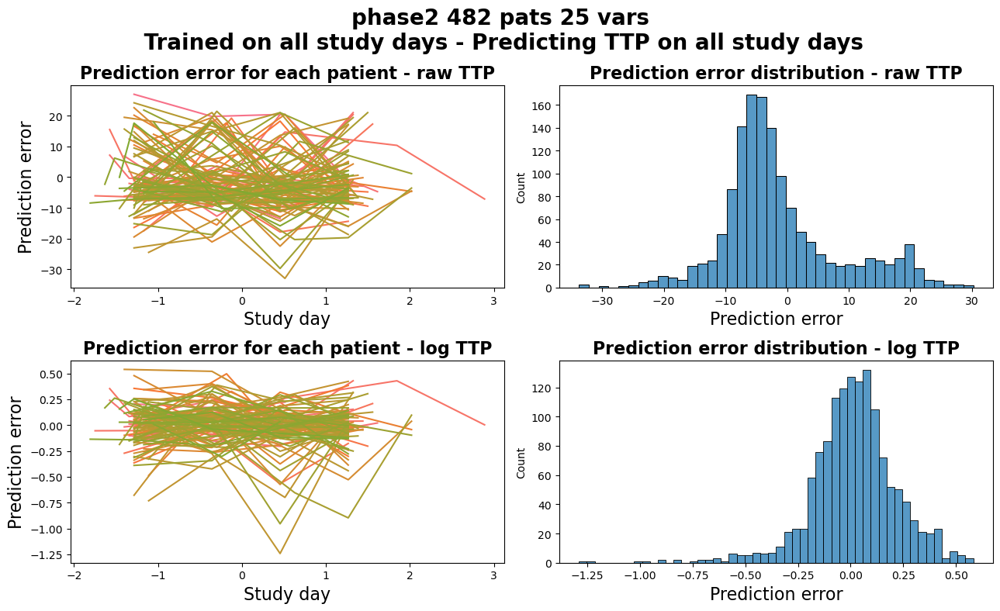

In [ ]:
figtitle_size=20
subplot_title_size=16
ylabel_size=16
text_size=18
legend_title_fontsize=13
scatter_dot_size=10


## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)      

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase','USUBJID':'SubjectID'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}

for ds_name in [*parameters_for_analysis][1:2]:
    
    ## Load the preprocessed + imputed dataset
    data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv',index_col=0,low_memory=False)   

    fname='../data/'+ds_name+'_LSTM_regr_results.pickle'
    if os.path.exists(fname):
        with open(fname,'rb') as f:
            result_dict=pickle.load(f)
    

    for ds_name_with_temp_df_names in [*result_dict][:]:
        training_data_results=result_dict[ds_name_with_temp_df_names]['train_data_results']

        for training_method in training_methods[:1]:  

            if training_method=='training_on_first_x_days':
                training_days=training_data_results['training_on_first_x_days']['training_days']      

            X_train, X_test, y_train, y_test,\
                y_train_log, y_test_log,\
                y_test_vals,y_test_log_vals,\
                y_train_vals,y_train_log_vals,std_training_days=split_training_data(training_method,data,pat_id_df,\
                                                                                            training_days,data_split_random_state,y_min_max)

            ## Select items from dict with actual and predicted values that were saved as np.arrays
            plot_dict={key: value for key, value in training_data_results[training_method].items() if '_with_index' not in key}
            plot_dict={key: value for key, value in training_data_results[training_method].items() \
                    if all(exclude_string not in key for exclude_string in ['_with_index','_x','_model','training_loss_dict'])}
            pred_df=pd.DataFrame.from_dict(plot_dict) 

            row_width_fact=6.5
            col_height_fact=4
            num_row=len(model_names)+1
            num_col=len(train_dataset_types)
            fig=plt.figure(figsize=(num_col*row_width_fact,num_row*col_height_fact))
            n=0

            for train_ds_type in train_dataset_types:
                
                model_name='LSTM_'+train_ds_type
                actual_y=model_name+'_y'
                actual_y_with_index=model_name+'_y_with_index'
                y_train_name=model_name+'_train_y_with_index'
                predicted=model_name+'_predicted'
                x_train=model_name+'_x'

                ## Subset data to patients who were in the training dataset
                y_with_index=training_data_results[training_method][actual_y_with_index]
                x_train_pats=y_with_index.index.get_level_values('USUBJID')
                X_train=training_data_results[training_method][x_train]
                plot_df=X_train.copy()
    
                ## Prediction error between ground truth and predicted values
                pred_err_sq=(pred_df[actual_y]-pred_df[predicted])#**2

                ## Lineplot of prediction error colroed by patient
                ax=fig.add_subplot(num_row,num_col,n+1)
                sns.lineplot(x=plot_df['DAY'],y=pred_err_sq,ax=ax,hue=plot_df['USUBJID'])
                ax.get_legend().remove()
                ax.set_title('Prediction error for each patient - ' +train_ds_type+' TTP',fontsize=subplot_title_size,
                             fontweight='bold')
                ax.set_ylabel('Prediction error',fontsize=ylabel_size)
                ax.set_xlabel('Study day',fontsize=ylabel_size)
                
                ## Distribution of prediction errors
                ax=fig.add_subplot(num_row,num_col,n+2)
                sns.histplot(pred_err_sq,ax=ax)
                ax.set_title('Prediction error distribution - '+train_ds_type+' TTP',fontsize=subplot_title_size,
                              fontweight='bold')
                ax.set_xlabel('Prediction error',fontsize=ylabel_size)

                n=n+2                    

            if training_method=='training_on_first_x_days':
                suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                         ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) 
                         
            else:
                suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n '+training_method_fig_title[training_method]
            fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold')
            plt.tight_layout()    
            

## Validation data - __if no CV__

### Plot validation data: __regression__

dict_keys(['LSTM_raw_y', 'LSTM_raw_y_with_index', 'LSTM_raw_predicted', 'LSTM_raw_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


dict_keys(['LSTM_log_y', 'LSTM_log_y_with_index', 'LSTM_log_predicted', 'LSTM_log_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


dict_keys(['LSTM_raw_y', 'LSTM_raw_y_with_index', 'LSTM_raw_predicted', 'LSTM_raw_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


dict_keys(['LSTM_log_y', 'LSTM_log_y_with_index', 'LSTM_log_predicted', 'LSTM_log_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


dict_keys(['LSTM_raw_y', 'LSTM_raw_y_with_index', 'LSTM_raw_predicted', 'LSTM_raw_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


dict_keys(['LSTM_log_y', 'LSTM_log_y_with_index', 'LSTM_log_predicted', 'LSTM_log_x'])


/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


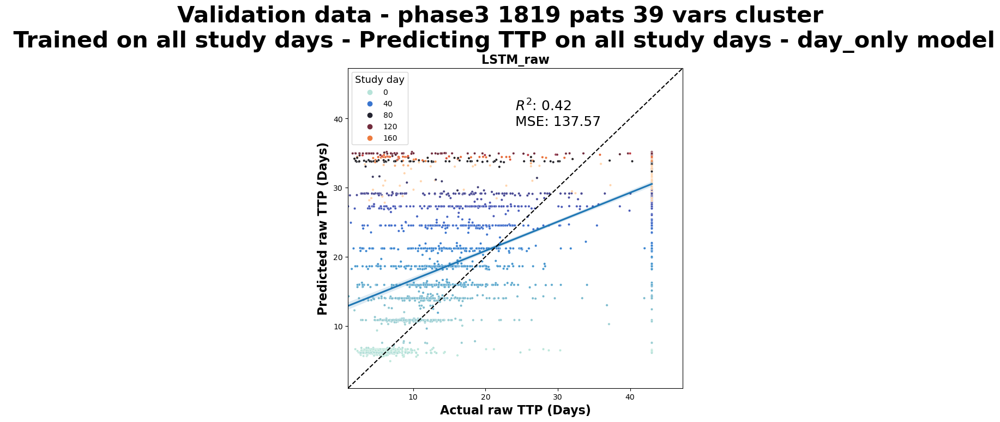

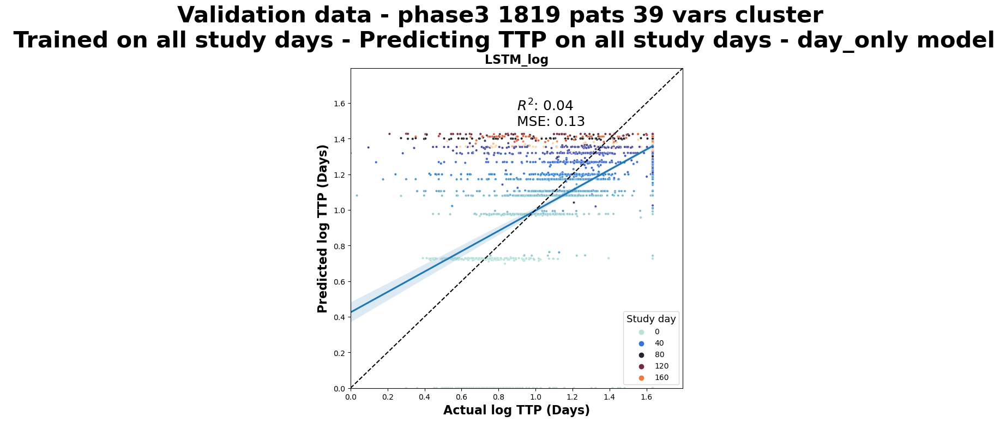

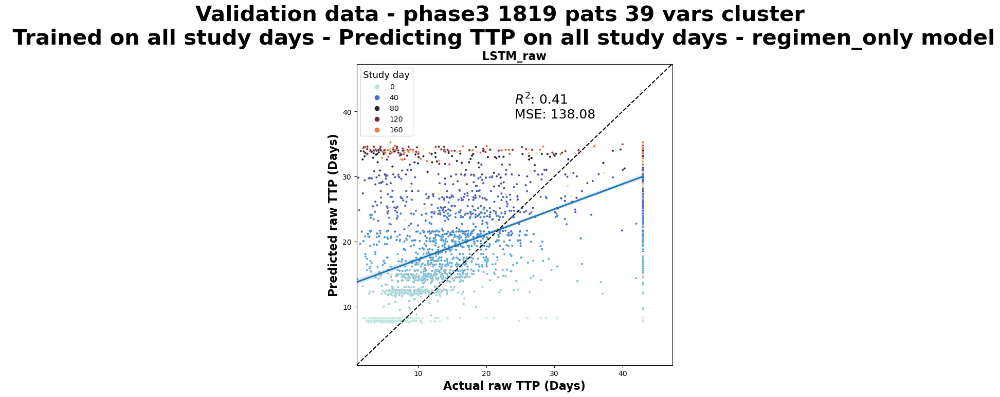

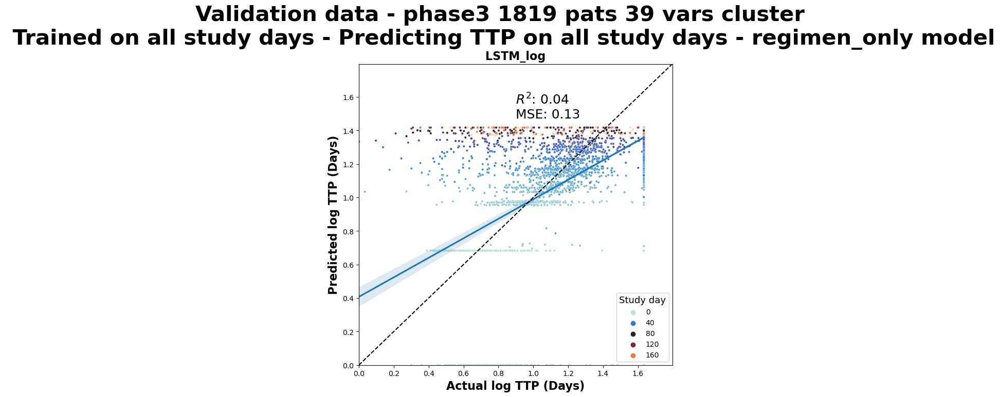

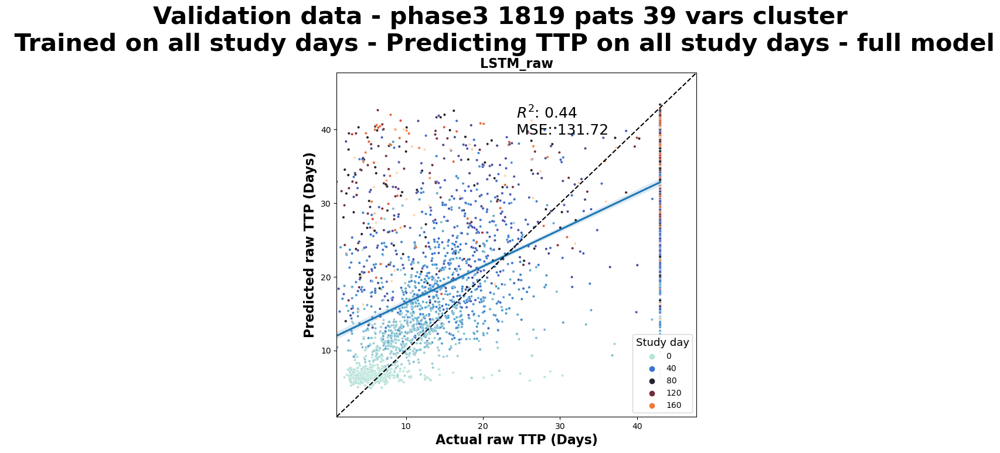

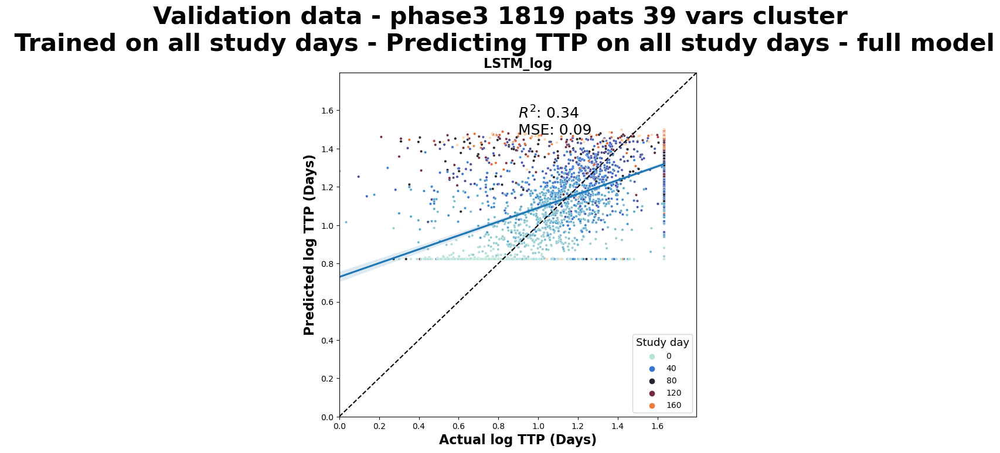

In [246]:
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
import matplotlib as mpl

figtitle_size=30
subplot_title_size=16
ylabel_size=16
text_size=18
legend_title_fontsize=13
scatter_dot_size=10


model_names=['LSTM']
#train_dataset_types=['raw','log']

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase','USUBJID':'SubjectID'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}

for model_complex in model_complexities[0:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        training_data_results=result_dict['train_data_results']

        for training_method in training_methods[:1]:  

            if training_method=='training_on_first_x_days':
                training_days=training_data_results['training_on_first_x_days']['training_days']
            
            for train_ds_type in train_dataset_types:
                for cv_rep in [*training_data_results[training_method][train_ds_type]]:
                    k_fold_results=training_data_results[training_method][train_ds_type][cv_rep]['results']['validation']
                    
                    ncols=len([*k_fold_results])
                    nrows=len(train_dataset_types)
                    fig=plt.figure(figsize=(ncols*7,nrows*7))
                    n=0

                    for k_fold in [*k_fold_results]:

                        plot_dict={key: value for key, value in k_fold_results[k_fold].items() \
                                    if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                                'training_loss_dict'])}
                        pred_df=pd.DataFrame.from_dict(plot_dict)

                        model_name='LSTM_'+train_ds_type
                        actual_y=model_name+'_y'
                        y_train_name=model_name+'_y_with_index'
                        predicted=model_name+'_predicted'

                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1

                        y_train_with_index=k_fold_results[k_fold][y_train_name]

                        if training_method=='training_on_first_x_days':
                            study_length=int(y_train_with_index.index.get_level_values('DAY').max())
                            prediction_duration=range(training_days+1,study_length+1)

                        max_value=pred_df[[actual_y,predicted]].max().max()
                        min_value=pred_df[[actual_y,predicted]].min().min()
                        r2=round(r2_score(pred_df[actual_y], pred_df[predicted]),2)
                        mse=round(sklearn.metrics.mean_squared_error(pred_df[actual_y], pred_df[predicted]),2)

                        hue=y_train_with_index.index.get_level_values(color_by)
                        plot_df=pred_df.copy()
                        ## Add all columns to plot_df that can be used for coloring as hue
                        for color_legend in color_by_legend_title.keys():
                            plot_df[color_legend]=y_train_with_index.index.get_level_values(color_legend)
                        
                        ## IF hue is numeric change the range of the legend labels to avoid outliers messing it up
                        try:
                            y_train_with_index.index.get_level_values(color_by).astype(float)

                            # Define the desired range of hue values
                            hue_min=plot_df[color_by].quantile(0.05) 
                            hue_max=plot_df[color_by].quantile(0.98) 
                            norm_hue=mpl.colors.Normalize(hue_min,hue_max,clip=True)

                            plot_df[color_by+'_clipped']=plot_df[color_by].clip(hue_min,hue_max)
                            
                            ### PLOT values
                            scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by+'_clipped',s=scatter_dot_size,\
                                                    hue_norm=norm_hue,legend=True,palette='icefire',vmin=hue_min,vmax=hue_max)   

                            legend_handles, orig_labels= scatter.get_legend_handles_labels()
                            legend_labels=plot_df[color_by].quantile(np.linspace(0.05,0.98,len(legend_handles))).tolist()
                            legend_labels=[round(x) for x in legend_labels]
                            ax.legend(handles=legend_handles,labels=legend_labels,
                                    title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize,
                                    loc='lower right')
                        
                        ## IF hue is categorical, just plot the scatterplot with the regular legend
                        except TypeError:
                            scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by,s=scatter_dot_size,\
                                                    legend=True,palette='icefire')
                        sns.regplot(data=plot_df,x=actual_y,y=predicted,ax=ax,scatter=False)
                        #sns.jointplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by)
                        ax.set_ylim(min_value,max_value*1.1)
                        ax.set_xlim(min_value,max_value*1.1)
                        text=r"$R^2$: "+ str(r2)+'\nMSE: '+str(mse)
                        axis_range=max_value*1.1-min_value
                        ax.text(0.5*axis_range+min_value,0.82*axis_range+min_value,text,fontsize=text_size)

                        ylabel='Predicted '+ train_ds_type+' TTP (Days)'
                        ax.set_ylabel(ylabel,fontsize=ylabel_size,fontweight='bold')
                        xlabel='Actual '+ train_ds_type+' TTP (Days)'
                        ax.set_xlabel(xlabel,fontsize=ylabel_size,fontweight='bold')

                        ax.plot(ax.get_xlim(), ax.get_ylim(),color='black', linestyle='dashed')
                        
                        if 'no_CV' in cv_rep:
                            subtitle=model_name
                        if 'no_CV' not in cv_rep:
                            subtitle=model_name+' - K-Fold: '+str(k_fold+1)

                        ax.set_title(subtitle,fontsize=subplot_title_size,fontweight='bold')
                        ax.legend(title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize)

                    if training_method=='training_on_first_x_days':
                        if 'no_CV' in cv_rep:
                            suptitle='Validation data - '+ ds_name.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                                        ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) 
                        if 'no_CV' not in cv_rep:
                            uptitle='Validation data - '+ ds_name.replace('_',' ')+' - CV-rep:'+str(int(cv_rep.split('_')[-1]))+'\n'+\
                                            training_method_fig_title[training_method] + " "+\
                                            str(training_days)+' - Predicting TTP on days '+\
                                            str(prediction_duration[0])+ ' - '+str(prediction_duration[-1])       
                                    
                    else:
                        if 'no_CV' in cv_rep:
                            suptitle='Validation data - '+ ds_name.replace('_',' ')+ '\n '+training_method_fig_title[training_method] + ' - '+model_complex+' model'
                        
                        if 'no_CV' not in cv_rep:
                            suptitle='Validation data - '+ ds_name.replace('_',' ')+' - CV-rep: '+str(int(cv_rep.split('_')[-1]))+ \
                                    '\n '+training_method_fig_title[training_method] + ' - '+model_complex+' model'
                        
                    fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold')
                plt.tight_layout()
   
        


### Plot validation data: __classification__

1
1
1
1
1
1
1
1
1
1
1
1


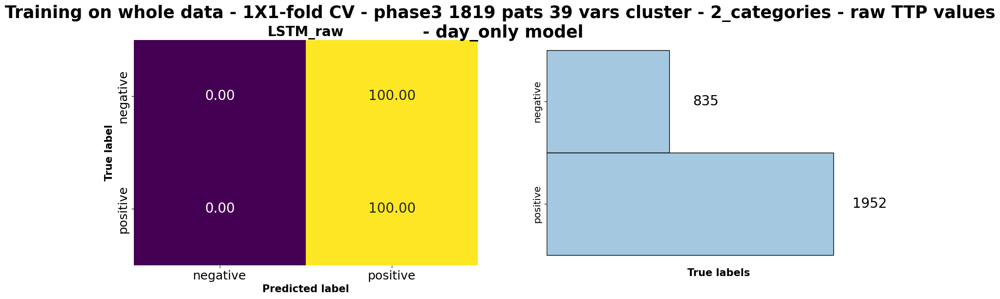

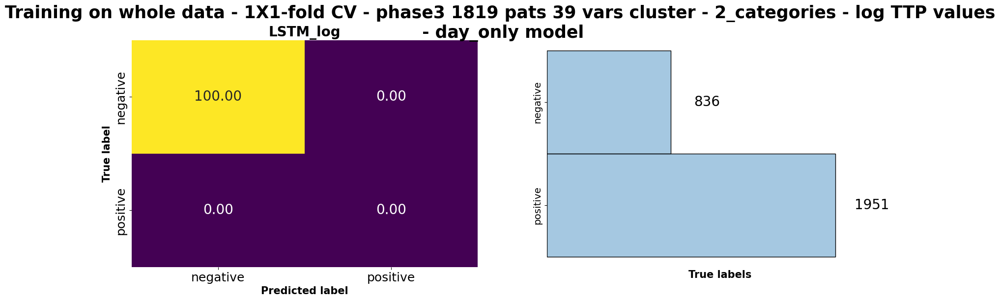

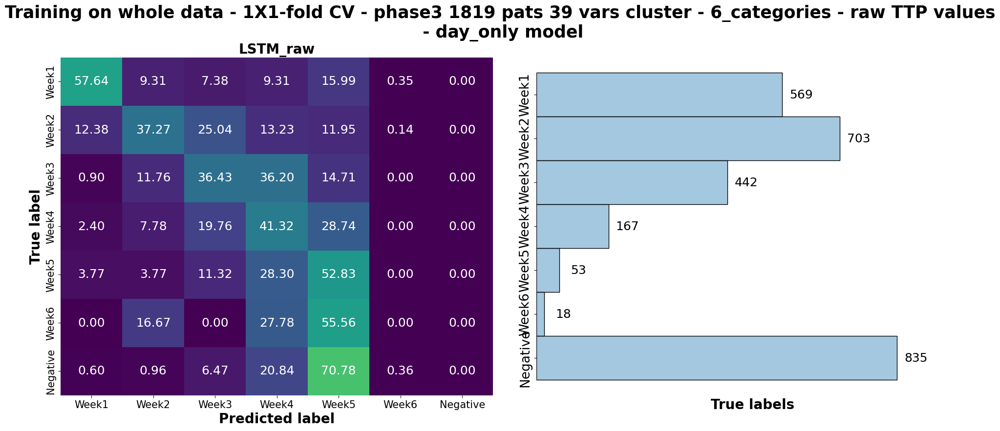

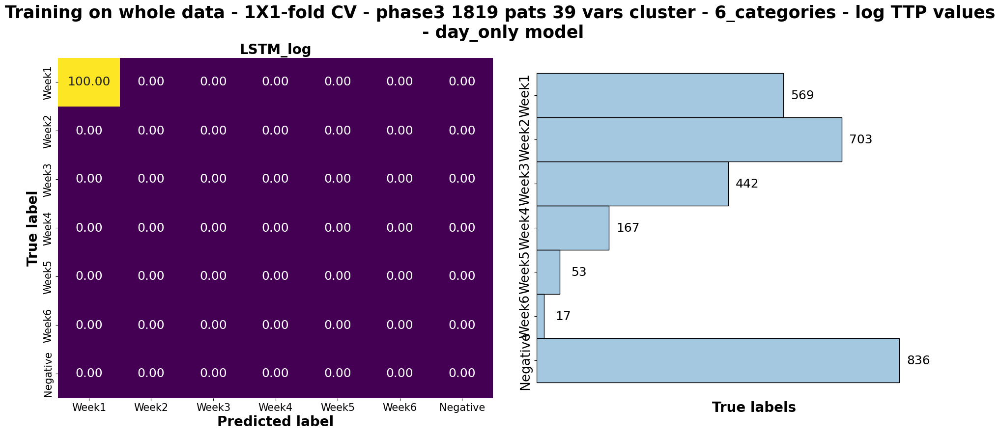

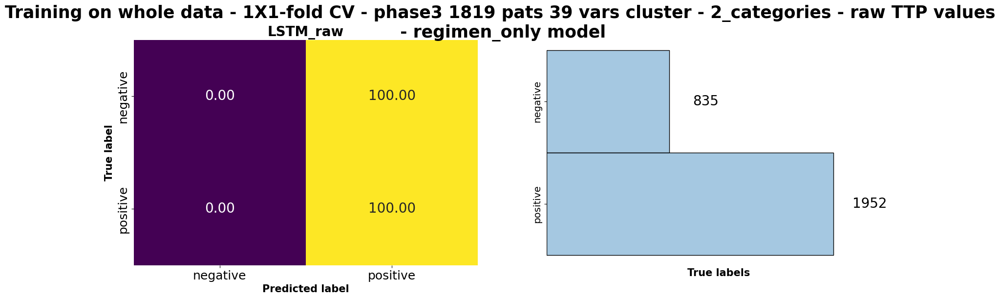

...

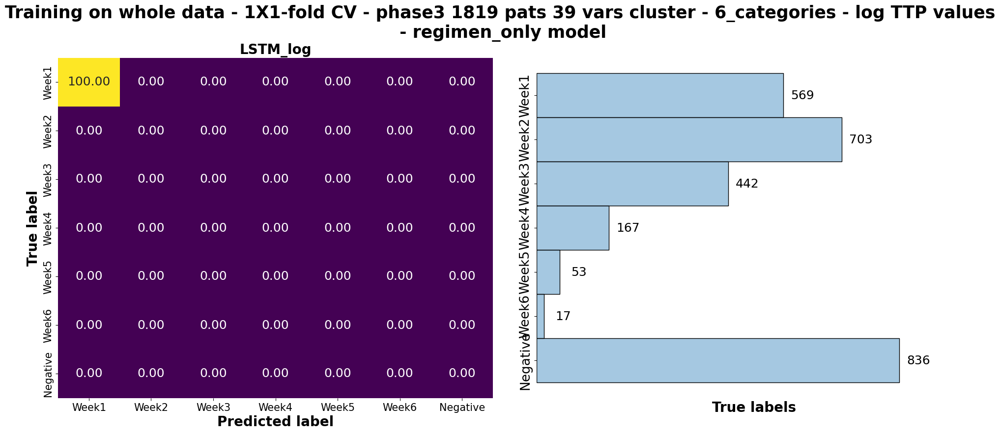

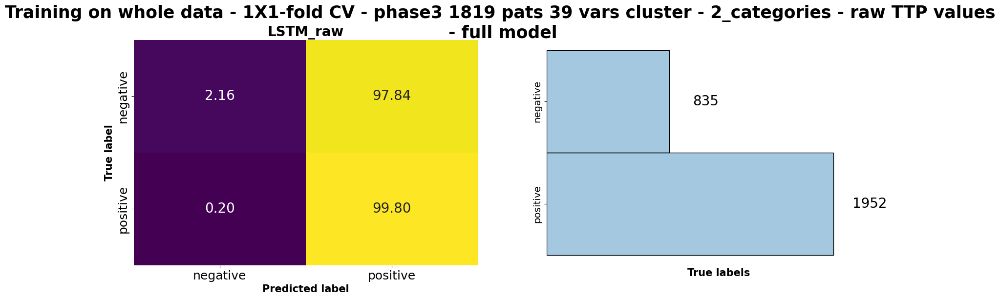

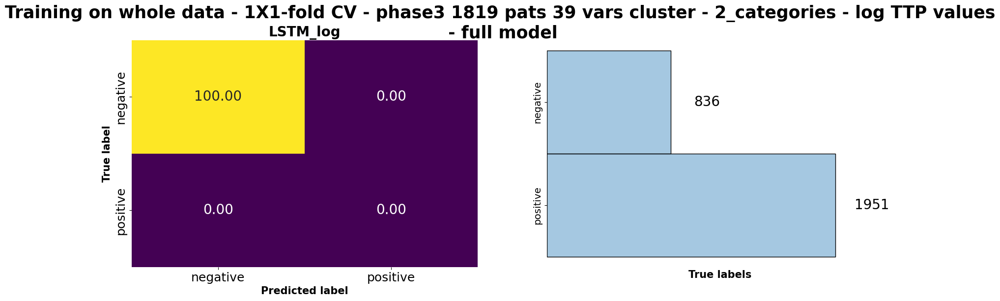

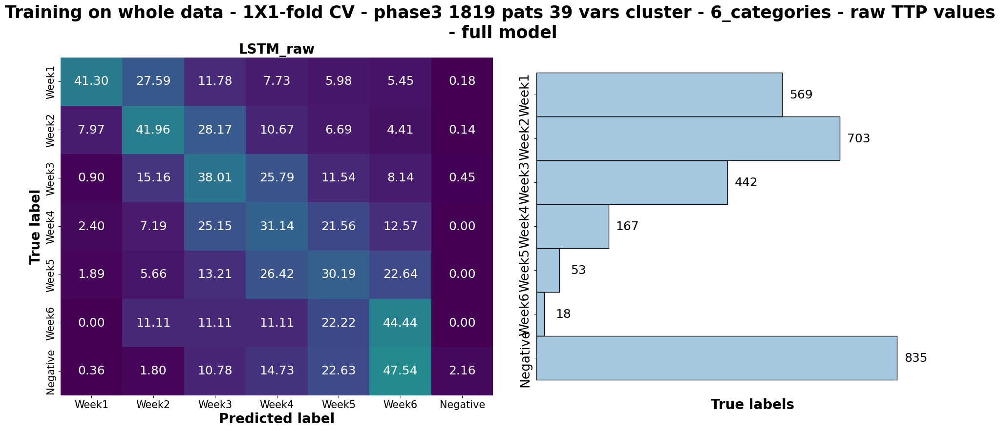

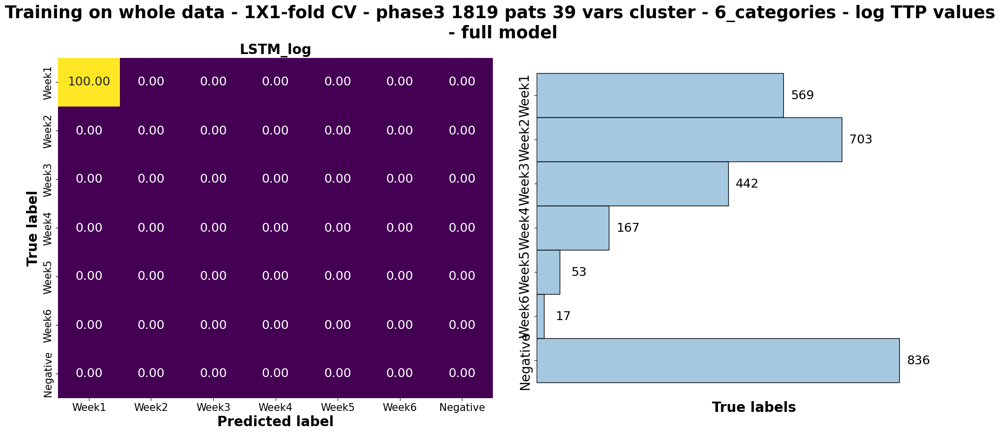

In [247]:
from sklearn import metrics

figtitle_size=25
subtitle_size=20
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=15

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

model_names=['LSTM']

train_dataset_types=['raw','log']
#train_dataset_types=['log']
training_methods=['training_on_whole_data']
data_split_random_state=44

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


## Dictionary for the conversion of TTP values to labels
categorical_map_dict={'2_categories':{'bins':[float('-inf'),42,float('inf')],'labels':[1,0],
                                      'labels_str':['positive','negative'],
                                      'weights':[1,2]},
                      '6_categories':{'bins':[float('-inf'),1*7,2*7,3*7,4*7,5*7,6*7,float('inf')],'labels':[0,1,2,3,4,5,6],
                                     'labels_str':['Week1','Week2','Week3','Week4','Week5','Week6','Negative'],
                                     'weights':[1,1,1,1,1,1,2]}}

for model_complex in model_complexities[0:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        training_days=parameters_for_analysis[ds_name]['training_days']
    
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        training_data_results=result_dict['train_data_results']
        #test_data_results=result_dict[ds_name]['test_data_results']
        #training_days=training_data_results['training_on_first_x_days']['training_days']

        for training_method in training_methods[:1]:
            for categorical_map_name in [*categorical_map_dict][0:2]:
                for train_ds_type in train_dataset_types:
                    confusion_matrix_list=[]

                    if '2' in categorical_map_name:
                        row_width_fact=10
                        col_height_fact=6
                        ncols=(num_of_cv_repeats)*2
                        nrows=1#len(train_dataset_types)
                        hspace=0.3
                        wspace=0.2
                        y_label_size=15
                        bar_annot_fontsize=20
                        x_tick_size=18
                        y_tick_size=18
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)

                    else:  
                        row_width_fact=12
                        col_height_fact=9
                        ncols=2
                        nrows=(num_of_cv_repeats)
                        hspace=0.2
                        wspace=0.1
                        y_label_size=20
                        bar_annot_fontsize=18
                        x_tick_size=15
                        y_tick_size=15
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)
                    
                    #fig=plt.figure(figsize=(nrows*10,ncols*4))
                    n=0
                    for cv_rep in [*training_data_results[training_method][train_ds_type]]:
                        
                        k_fold_results=training_data_results[training_method][train_ds_type][cv_rep]['results']['validation']

                        for k_fold in [*k_fold_results]:
                            #print(k_fold_results[k_fold].keys())

                            plot_dict={key: value for key, value in k_fold_results[k_fold].items() \
                                        if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                                    'training_loss_dict'])}
                            pred_df=pd.DataFrame.from_dict(plot_dict)

                            model_name='LSTM_'+train_ds_type
                            actual_y=model_name+'_y'
                            y_train_name=model_name+'_y_with_index'
                            predicted=model_name+'_predicted'


                            ## Check if data is min-max standardised -> revert standardisation 
                            if pred_df[actual_y].values.max()<=1.1:
                                min_val=0
                                max_value=1/(24*3600)+42
                                for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                                    pred_df.loc[:,pred_df.columns.str.contains(ds_type)]=max_value * pred_df.loc[:,pred_df.columns.str.contains(ds_type)]

                            ## If no min-max standardisation convert only log values back
                            if train_ds_type=='raw' and pred_df['LSTM_raw_y'].values.max()>1:
                                pred_df.loc[:,pred_df.columns.str.contains('log_')]=10**pred_df.loc[:,pred_df.columns.str.contains('log_')]

                            ## Convert numerical TTP values to categorical labels
                            categorical_map=categorical_map_dict[categorical_map_name]
                            pred_df_cat=pred_df.apply(pd.cut,bins=categorical_map['bins'],labels=categorical_map['labels'])

                            if pred_df_cat[predicted].isna().any()==True:
                                print(pred_df_cat[predicted].isna())
                                print(pred_df[predicted][pred_df_cat[predicted].isna().values])

                            confusion_matrix=pd.crosstab(pred_df_cat[actual_y], pred_df_cat[predicted], 
                                                    rownames=['Actual'], colnames=['Predicted'],margins=True)

                            ## Convert to dataframe and rename columns to label strings from numbers
                            confusion_matrix_=metrics.confusion_matrix(pred_df_cat[actual_y], pred_df_cat[predicted],normalize='true')
                            confusion_matrix_=pd.DataFrame(confusion_matrix_)
                            label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                                categorical_map_dict[categorical_map_name]['labels_str']))

                            confusion_matrix_=confusion_matrix_.rename(columns=label_dict)
                            confusion_matrix_=confusion_matrix_.rename(index=label_dict)

                            ## If by chance one label was not in the data, add it to the confusion matrix with full 0s
                            #  i.e Week 5 datapoints were not in the training data due to random split -> Week5 is missing from
                            #  confusion matrix -> add Week5 as a columns and rows and set its values to 0
                            missing_labels=[lab for lab in categorical_map['labels_str'] if lab not in confusion_matrix_.columns]
                            ## Add missing label to cols and rows
                            confusion_matrix_[missing_labels]=0
                            for lab in missing_labels:
                                confusion_matrix_.loc[lab]=0

                            ## Reorder columns and indices based on the categorical labels
                            if '2' in categorical_map_name:
                                order_list=['negative','positive']#categorical_map['labels_str'].reverse()
                            else:
                                order_list=categorical_map['labels_str']                            

                            confusion_matrix_=confusion_matrix_.reindex(columns=order_list)
                            confusion_matrix_=confusion_matrix_.reindex(index=order_list)
                            confusion_matrix_list.append(confusion_matrix_)
                    
                    
                        #for aa in confusion_matrix_list:
                        #    print(aa.shape)
                        confusion_matrix_vals_list=[df.values for df in confusion_matrix_list]
                        conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
                        conf_mat_std_dev=np.nanstd(np.array(confusion_matrix_vals_list), axis=0)

                        conf_mat_avg_df=pd.DataFrame(conf_mat_avg,columns=order_list,index=order_list)
                        conf_mat_std_dev_df=pd.DataFrame(conf_mat_std_dev,columns=order_list,index=order_list)

                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1
                        sns.heatmap(conf_mat_avg_df*100,ax=ax,annot=True,cbar=False, cmap='viridis', fmt='.2f',
                                    annot_kws={"size":bar_annot_fontsize},vmin=0, vmax=100)
                        
                        if 'no_CV' in cv_rep:
                            subtitle=model_name
                        if 'no_CV' not in cv_rep:
                            subtitle='-'.join([model_name,cv_rep])

                        ax.set_title(subtitle,fontsize=subtitle_size,fontweight='bold')
                        ax.set_ylabel('True label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xlabel('Predicted label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xticklabels(ax.get_xticklabels(), fontsize=x_tick_size)
                        ax.set_yticklabels(ax.get_yticklabels(), fontsize=y_tick_size)


                        ## Add the distribution of the predicted variable as last subplot
                        ax=fig.add_subplot(nrows,ncols,n+1)
                        print(n)
                        n=n+1

                        #categorical_map_name_key=list(set(['_'.join([model_name,train_ds_type,'y_with_index']) for key in \
                            #                           training_data_results[training_method].keys() if 'y_with_index' in key]))[0] 
                        
                        if train_ds_type=='raw':
                            y_as_log=False
                        if train_ds_type=='log':    
                            y_as_log=True

                        _,y_with_index=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)

                        #plot_df=training_data_results[training_method][categorical_map_name_key]
                        validation_pat_ids=training_data_results[training_method][train_ds_type][cv_rep]['validation_pat_ids']
                        plot_df=y_with_index.reset_index()
                        plot_df=plot_df[plot_df['USUBJID'].isin(validation_pat_ids)]
                        #plot_df=plot_df.rename(columns=color_by_legend_title)

                        ## Check if data is min-max standardised -> revert standardisation 
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()<=1.1:
                            if train_ds_type=='raw':
                                max_value=1/(24*3600)+42
                            if train_ds_type=='log':
                                    max_value=np.log10(1/(24*3600)+42) 
                            #for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                            plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']=max_value * plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']

                        ## If no min-max standardisation convert only log values back
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()>1:
                            plot_df.loc[:,plot_df.columns.str.contains('log_')]=10**plot_df.loc[:,plot_df.columns.str.contains('log_')]

                        label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                                categorical_map_dict[categorical_map_name]['labels_str']))

                        ## Convert log TTP values back to raw TTp values
                        if train_ds_type=='log':
                            plot_df['mb_Time to Detection_STD_NUM_RESULT']=10**(plot_df['mb_Time to Detection_STD_NUM_RESULT']).values


                        ## Transform into categorical column and drop numerical column of target
                        plot_df['mb_Time to Detection_RESULT']=pd.cut(plot_df['mb_Time to Detection_STD_NUM_RESULT'],
                                                                        bins=categorical_map['bins'],
                                                                        labels=categorical_map['labels']).values
                        plot_df['mb_Time to Detection_RESULT']=plot_df['mb_Time to Detection_RESULT'].replace(label_dict,regex=True)

                        if '2' in categorical_map_name:
                            plot_df['mb_Time to Detection_RESULT']=pd.Categorical(plot_df['mb_Time to Detection_RESULT'],['negative','positive'])
                            bar_offset_fact=0.12
                        else:
                            bar_offset_fact=0.05  

                        histp=sns.histplot(data=plot_df,y='mb_Time to Detection_RESULT',ax=ax,#hue=color_by_legend_title[color_by],
                                    alpha=0.4,kde=False,linewidth=None)

                        
                        # Add count annotations next to the bars
                        for p in histp.patches:
                            histp.annotate(f'{int(p.get_width())}', (p.get_width()+ax.get_xlim()[1]*bar_offset_fact, p.get_y()+p.get_height() / 2), 
                                            ha='center', va='center',fontsize=bar_annot_fontsize)

                        # Remove x-label ticks on the x-axis
                        ax.set_xticks([])                       
                        ax.set_xlim(0,int(round(plot_df['mb_Time to Detection_RESULT'].value_counts().max()*1.2)))
                        ax.set_xlabel('True labels',fontsize=y_label_size,fontweight='bold')
                        #ax.set_ylabel('Count',fontsize=ylabel_size,fontweight='bold')
                        # Remove y-axis ticks and labels

                        # Set y-axis tick positions and labels
                        ax.set_ylabel('') 
                        ax.tick_params(axis='y', labelsize=y_label_size*0.95)
                        
                        for label in ax.get_yticklabels():
                            label.set_rotation(90)
                            label.set_va('center')
                        #ax.set_title('Label distribution',fontsize=y_label_size,fontweight='bold')
                        
                        # Remove the frame (border) around the plot
                        ax.spines['top'].set_visible(False)
                        ax.spines['right'].set_visible(False)
                        ax.spines['bottom'].set_visible(False)
                        ax.spines['left'].set_visible(False)

                        if training_method=='training_on_first_x_days':
                                suptitle=training_method.replace('x',str(training_days))
                                suptitle=suptitle.replace('_',' ').capitalize() + ' - '+ str(num_of_cv_repeats)+'X'+ \
                                        str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values' + ' - '+model_complex+' model'
                                        
                        else:
                            suptitle=training_method.replace('_',' ').capitalize()+' - '+str(num_of_cv_repeats)+'X'+ \
                                    str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values\n' + ' - '+model_complex+' model'
                        fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=1)

            
            

## Testing data

### Plot testing data: __regression__

/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/seaborn/relational.py:567: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


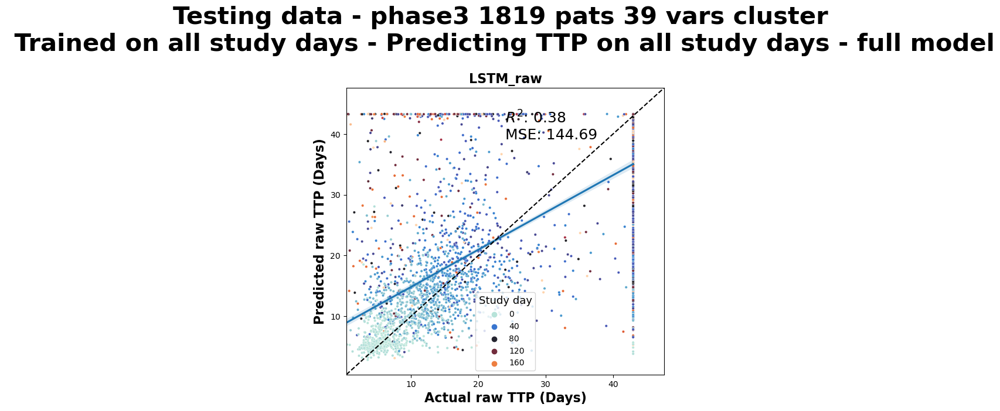

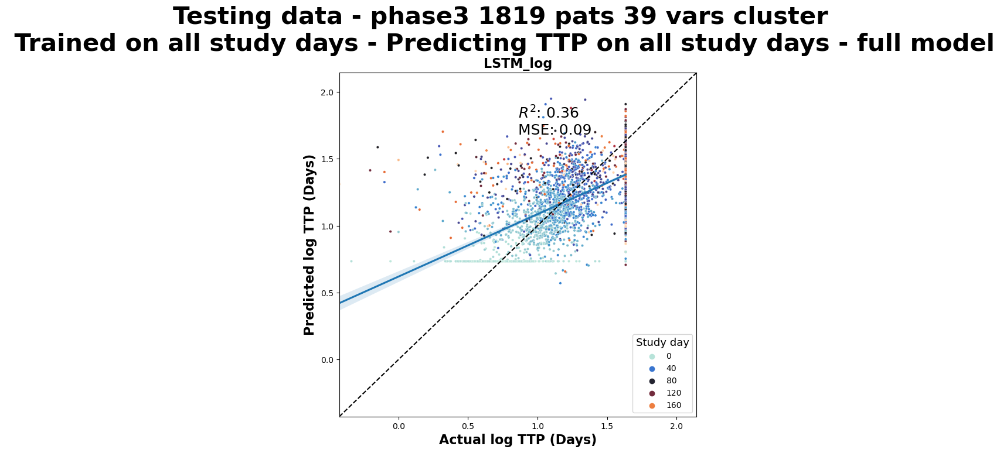

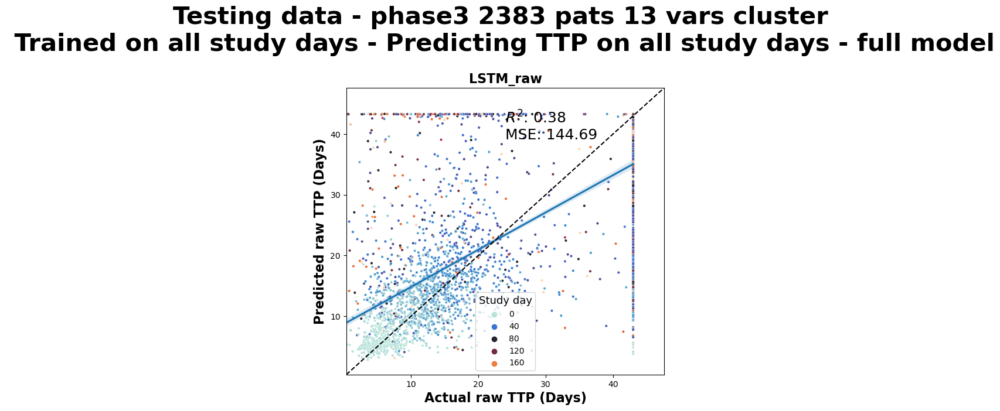

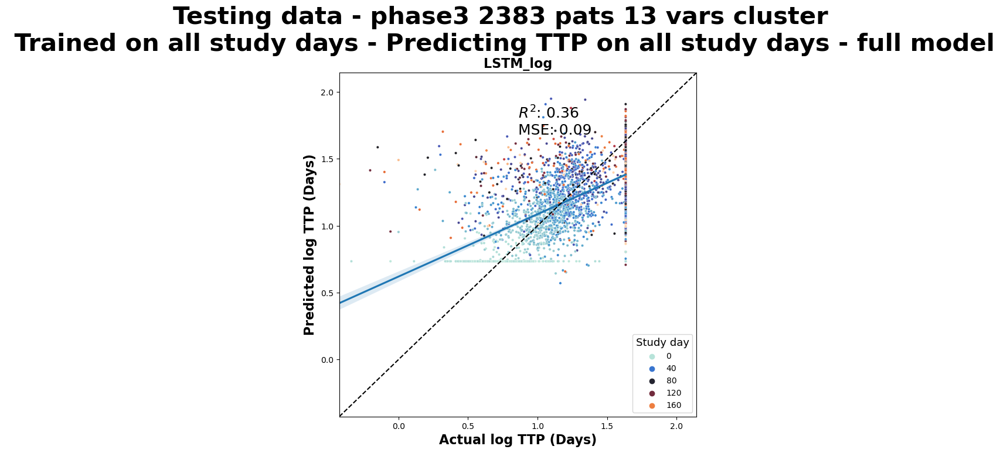

In [58]:
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
import matplotlib as mpl

figtitle_size=30
subplot_title_size=16
ylabel_size=16
text_size=18
legend_title_fontsize=13
scatter_dot_size=10


model_names=['LSTM']
#train_dataset_types=['raw','log']

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase','USUBJID':'SubjectID'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}

for model_complex in model_complexities[2:]:
    for ds_name in [*parameters_for_analysis][-2:]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        test_data_results=result_dict['test_data_results']

        for training_method in training_methods[:1]:  

            if training_method=='training_on_first_x_days':
                training_days=test_data_results['training_on_first_x_days']['training_days']
            
            for train_ds_type in train_dataset_types:
                ncols=num_of_cv_repeats
                nrows=len(train_dataset_types)
                fig=plt.figure(figsize=(ncols*7,nrows*7))
                n=0
                for cv_rep in [*test_data_results[training_method][train_ds_type]]:
                    results=test_data_results[training_method][train_ds_type][cv_rep]['results']
                    
                    

                    #for k_fold in [*k_fold_results]:

                    plot_dict={key: value for key, value in results.items() \
                                if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                            'training_loss_dict'])}

                    #print(plot_dict.keys())                                                                        
                    pred_df=pd.DataFrame.from_dict(plot_dict)

                    model_name='LSTM_'+train_ds_type
                    actual_y=model_name+'_y'
                    y_train_name=model_name+'_y_with_index'
                    predicted=model_name+'_predicted'

                    ax=fig.add_subplot(nrows,ncols,n+1)
                    n=n+1

                    y_train_with_index=results[y_train_name]

                    if training_method=='training_on_first_x_days':
                        study_length=int(y_train_with_index.index.get_level_values('DAY').max())
                        prediction_duration=range(training_days+1,study_length+1)

                    max_value=pred_df[[actual_y,predicted]].max().max()
                    min_value=pred_df[[actual_y,predicted]].min().min()
                    r2=round(r2_score(pred_df[actual_y], pred_df[predicted]),2)
                    mse=round(sklearn.metrics.mean_squared_error(pred_df[actual_y], pred_df[predicted]),2)

                    hue=y_train_with_index.index.get_level_values(color_by)
                    plot_df=pred_df.copy()
                    ## Add all columns to plot_df that can be used for coloring as hue
                    for color_legend in color_by_legend_title.keys():
                        plot_df[color_legend]=y_train_with_index.index.get_level_values(color_legend)
                    
                    ## IF hue is numeric change the range of the legend labels to avoid outliers messing it up
                    try:
                        y_train_with_index.index.get_level_values(color_by).astype(float)

                        # Define the desired range of hue values
                        hue_min=plot_df[color_by].quantile(0.05) 
                        hue_max=plot_df[color_by].quantile(0.98) 
                        norm_hue=mpl.colors.Normalize(hue_min,hue_max,clip=True)

                        plot_df[color_by+'_clipped']=plot_df[color_by].clip(hue_min,hue_max)
                        
                        ### PLOT values
                        scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by+'_clipped',s=scatter_dot_size,\
                                                hue_norm=norm_hue,legend=True,palette='icefire',vmin=hue_min,vmax=hue_max)   

                        legend_handles, orig_labels= scatter.get_legend_handles_labels()
                        legend_labels=plot_df[color_by].quantile(np.linspace(0.05,0.98,len(legend_handles))).tolist()
                        legend_labels=[round(x) for x in legend_labels]
                        ax.legend(handles=legend_handles,labels=legend_labels,
                                title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize,
                                loc='lower right')
                    
                    ## IF hue is categorical, just plot the scatterplot with the regular legend
                    except TypeError:
                        scatter=sns.scatterplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by,s=scatter_dot_size,\
                                                legend=True,palette='icefire')
                    sns.regplot(data=plot_df,x=actual_y,y=predicted,ax=ax,scatter=False)
                    #sns.jointplot(data=plot_df,x=actual_y,y=predicted,ax=ax,hue=color_by)
                    ax.set_ylim(min_value,max_value*1.1)
                    ax.set_xlim(min_value,max_value*1.1)
                    text=r"$R^2$: "+ str(r2)+'\nMSE: '+str(mse)
                    axis_range=max_value*1.1-min_value
                    ax.text(0.5*axis_range+min_value,0.82*axis_range+min_value,text,fontsize=text_size)

                    ylabel='Predicted '+ train_ds_type+' TTP (Days)'
                    ax.set_ylabel(ylabel,fontsize=ylabel_size,fontweight='bold')
                    xlabel='Actual '+ train_ds_type+' TTP (Days)'
                    ax.set_xlabel(xlabel,fontsize=ylabel_size,fontweight='bold')

                    ax.plot(ax.get_xlim(), ax.get_ylim(),color='black', linestyle='dashed')
                    
                    if 'no_CV' in cv_rep:
                        subtitle=model_name
                    if 'no_CV' not in cv_rep:
                        subtitle=model_name+' - CV-repeat: '+str(cv_rep.split('_')[-1])

                    ax.set_title(subtitle,fontsize=subplot_title_size,fontweight='bold')
                    ax.legend(title=color_by_legend_title[color_by],title_fontsize=legend_title_fontsize)

                if training_method=='training_on_first_x_days':   
                    suptitle='Testing data - '+ ds_name.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                                    ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) \
                                        + ' - '+model_complex+' model'
        
                                
                else:      
                    suptitle='Testing data - '+ ds_name.replace('_',' ')+ '\n '+training_method_fig_title[training_method] + ' - '+model_complex+' model'

                    
                fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold')
            plt.tight_layout()
   
        


### Plot testing data: __classification__

/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/1797706424.py:159: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/1797706424.py:159: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/var/folders/0_/_m74rlq93855zphvhkg3qkhh19_hwl/T/ipykernel_89240/1797706424.py:159: RuntimeWarning: Mean of empty slice
  conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_lis

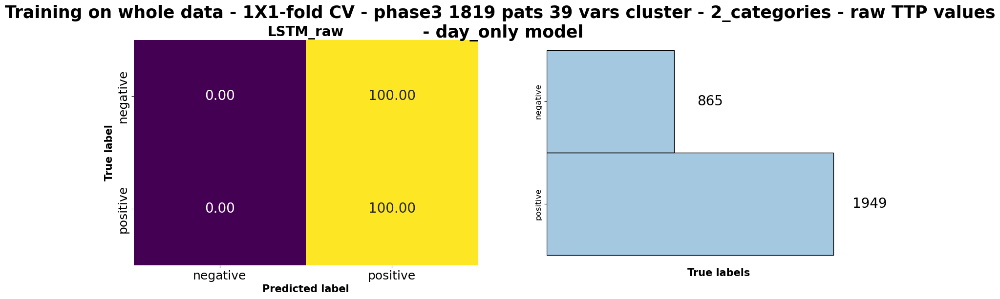

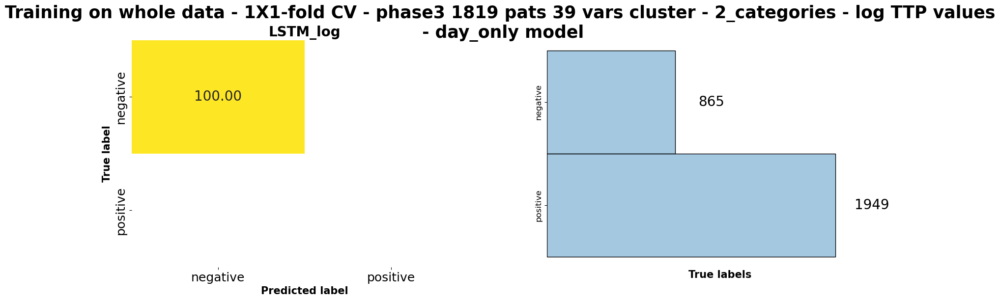

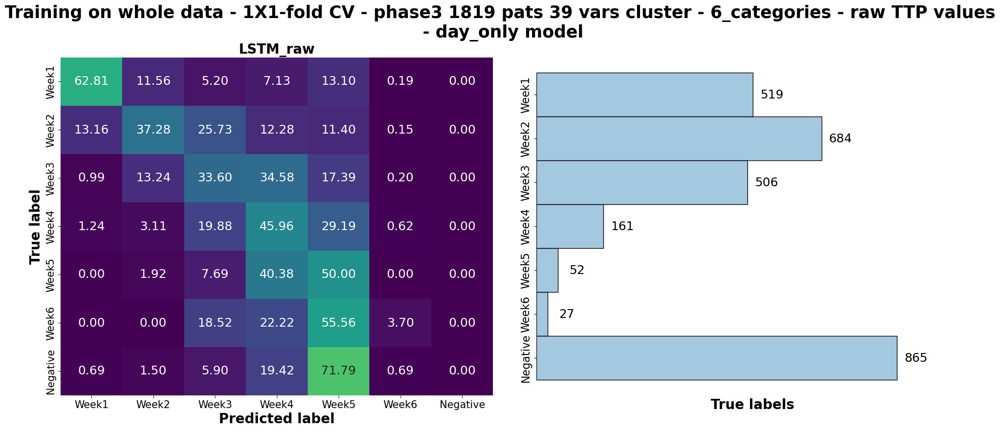

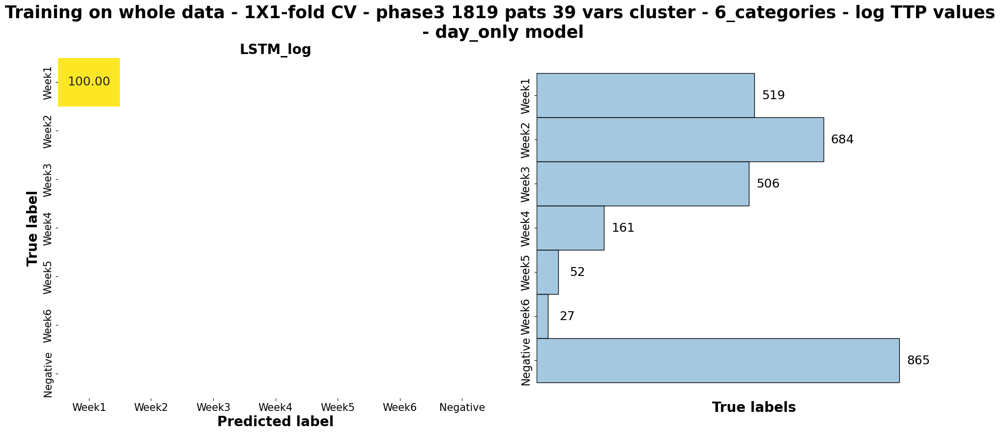

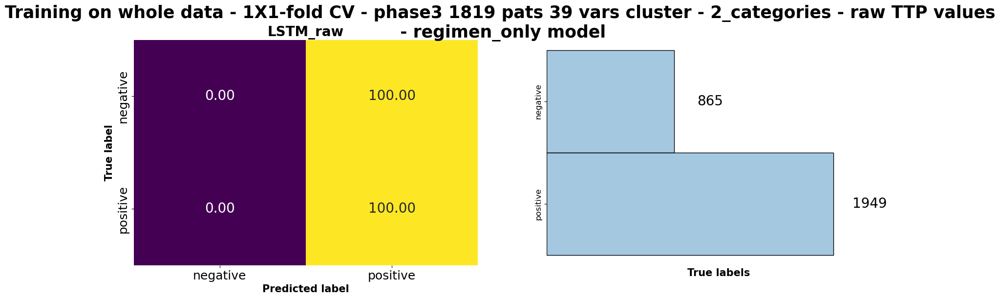

...

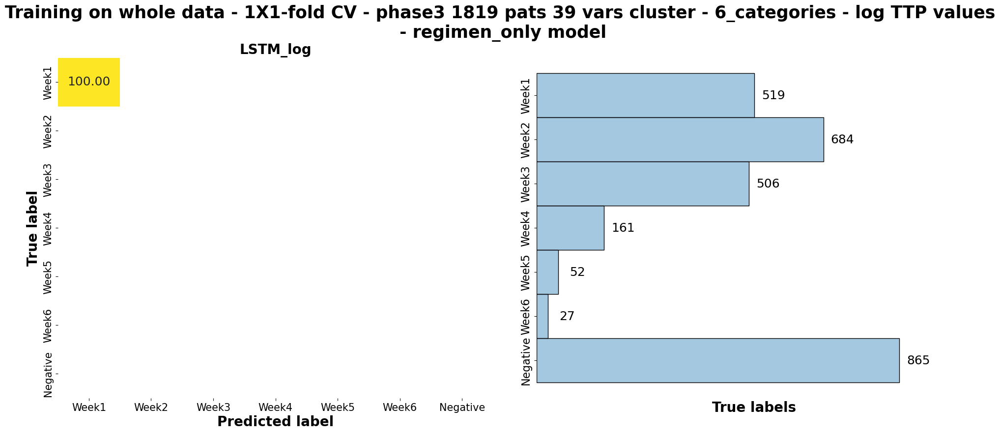

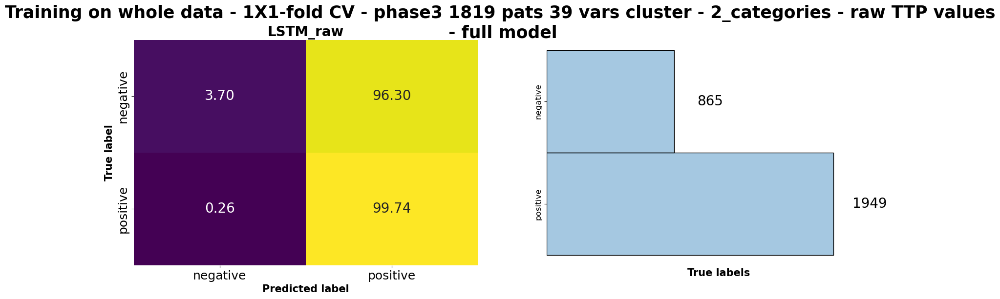

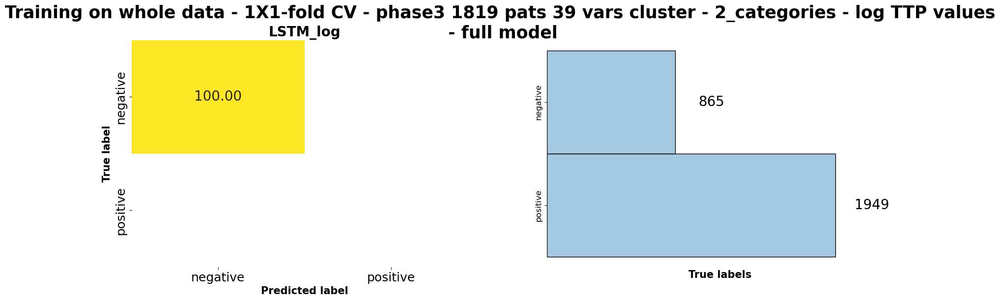

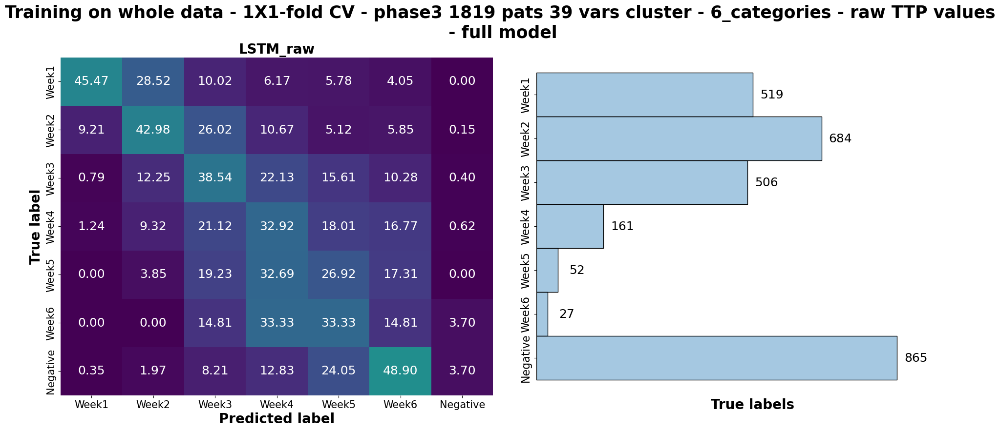

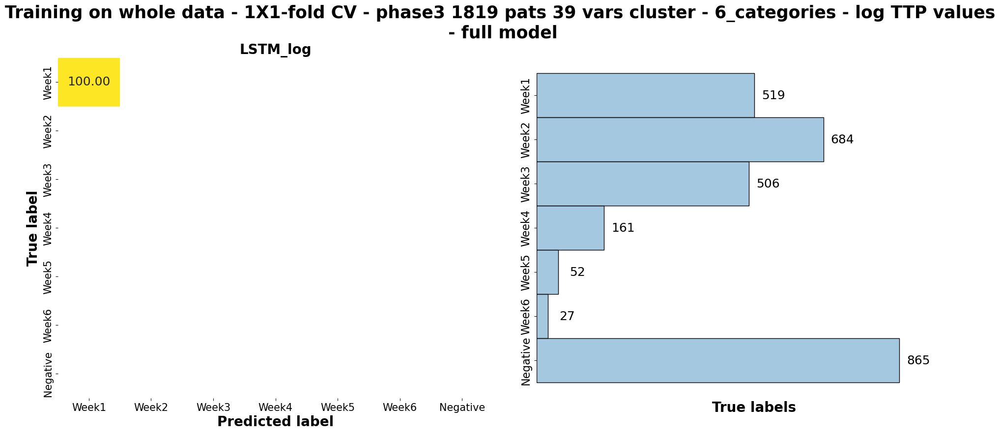

In [249]:
from sklearn import metrics

figtitle_size=25
subtitle_size=20
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=15

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

model_names=['LSTM']

train_dataset_types=['raw','log']
#train_dataset_types=['log']
training_methods=['training_on_whole_data']
data_split_random_state=44

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


## Dictionary for the conversion of TTP values to labels
categorical_map_dict={'2_categories':{'bins':[float('-inf'),42,float('inf')],'labels':[1,0],
                                      'labels_str':['positive','negative'],
                                      'weights':[1,2]},
                      '6_categories':{'bins':[float('-inf'),1*7,2*7,3*7,4*7,5*7,6*7,float('inf')],'labels':[0,1,2,3,4,5,6],
                                     'labels_str':['Week1','Week2','Week3','Week4','Week5','Week6','Negative'],
                                     'weights':[1,1,1,1,1,1,2]}}

for model_complex in model_complexities[0:]:
    for ds_name in [*parameters_for_analysis][-2:-1]:

        fname=f'../data/{ds_name}_LSTM_regr_results_{model_complex}_model.pickle'
        training_days=parameters_for_analysis[ds_name]['training_days']

        if os.path.exists(fname):
            with open(fname,'rb') as f:
                result_dict=pickle.load(f)
        

        #training_data_results=result_dict['train_data_results']
        test_data_results=result_dict['test_data_results']
        #training_days=training_data_results['training_on_first_x_days']['training_days']

        for training_method in training_methods[:1]:
            for categorical_map_name in [*categorical_map_dict][0:2]:
                for train_ds_type in train_dataset_types:
                    confusion_matrix_list=[]

                    if '2' in categorical_map_name:
                        row_width_fact=10
                        col_height_fact=6
                        ncols=(num_of_cv_repeats)*2
                        nrows=1#len(train_dataset_types)
                        hspace=0.3
                        wspace=0.2
                        y_label_size=15
                        bar_annot_fontsize=20
                        x_tick_size=18
                        y_tick_size=18
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)

                    else:  
                        row_width_fact=12
                        col_height_fact=9
                        ncols=2
                        nrows=(num_of_cv_repeats)
                        hspace=0.2
                        wspace=0.1
                        y_label_size=20
                        bar_annot_fontsize=18
                        x_tick_size=15
                        y_tick_size=15
                        #num_row=math.ceil(len(model_names)/num_col)
                        fig=plt.figure(figsize=(ncols*row_width_fact,nrows*col_height_fact))
                        fig.subplots_adjust(hspace=hspace,wspace=wspace)    
                    
                    #fig=plt.figure(figsize=(nrows*10,ncols*4))
                    n=0
                    for cv_rep in [*test_data_results[training_method][train_ds_type]]:
                        
                        results=test_data_results[training_method][train_ds_type][cv_rep]['results']

                        #for k_fold in [*k_fold_results]:
                        #print(k_fold_results[k_fold].keys())

                        plot_dict={key: value for key, value in results.items() \
                                    if all(exclude_string not in key for exclude_string in ['_with_index','_x',
                                                                                'training_loss_dict'])}
                        pred_df=pd.DataFrame.from_dict(plot_dict)

                        model_name='LSTM_'+train_ds_type
                        actual_y=model_name+'_y'
                        y_train_name=model_name+'_y_with_index'
                        predicted=model_name+'_predicted'


                        ## Check if data is min-max standardised -> revert standardisation 
                        if pred_df[actual_y].values.max()<=1.1:
                            min_val=0
                            max_value=1/(24*3600)+42
                            for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                                pred_df.loc[:,pred_df.columns.str.contains(ds_type)]=max_value * pred_df.loc[:,pred_df.columns.str.contains(ds_type)]

                        ## If no min-max standardisation convert only log values back
                        if train_ds_type=='raw' and pred_df['LSTM_raw_y'].values.max()>1:
                            pred_df.loc[:,pred_df.columns.str.contains('log_')]=10**pred_df.loc[:,pred_df.columns.str.contains('log_')]

                        ## Convert numerical TTP values to categorical labels
                        categorical_map=categorical_map_dict[categorical_map_name]
                        pred_df_cat=pred_df.apply(pd.cut,bins=categorical_map['bins'],labels=categorical_map['labels'])

                        if pred_df_cat[predicted].isna().any()==True:
                            print(pred_df_cat[predicted].isna())
                            print(pred_df[predicted][pred_df_cat[predicted].isna().values])

                        confusion_matrix=pd.crosstab(pred_df_cat[actual_y], pred_df_cat[predicted], 
                                                rownames=['Actual'], colnames=['Predicted'],margins=True)

                        ## Convert to dataframe and rename columns to label strings from numbers
                        confusion_matrix_=metrics.confusion_matrix(pred_df_cat[actual_y], pred_df_cat[predicted],normalize='true')
                        confusion_matrix_=pd.DataFrame(confusion_matrix_)
                        label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                            categorical_map_dict[categorical_map_name]['labels_str']))

                        confusion_matrix_=confusion_matrix_.rename(columns=label_dict)
                        confusion_matrix_=confusion_matrix_.rename(index=label_dict)

                        
                        ## If by chance one label was not in the data, add it to the confusion matrix with full 0s
                        #  i.e Week 5 datapoints were not in the training data due to random split -> Week5 is missing from
                        #  confusion matrix -> add Week5 as a columns and rows and set its values to 0
                        missing_labels=[lab for lab in categorical_map['labels_str'] if lab not in confusion_matrix_.columns]
                        ## Add missing label to cols and rows
                        confusion_matrix_[missing_labels]=np.nan
                        for lab in missing_labels:
                            confusion_matrix_.loc[lab]=np.nan

                        ## Reorder columns and indices based on the categorical labels
                        if '2' in categorical_map_name:
                            order_list=['negative','positive']#categorical_map['labels_str'].reverse()
                        else:
                            order_list=categorical_map['labels_str']                            

                        confusion_matrix_=confusion_matrix_.reindex(columns=order_list)
                        confusion_matrix_=confusion_matrix_.reindex(index=order_list)
                        confusion_matrix_list.append(confusion_matrix_)
                    
                    
                        #for aa in confusion_matrix_list:
                        #    print(aa.shape)
                        confusion_matrix_vals_list=[df.values for df in confusion_matrix_list]
                        conf_mat_avg=np.nanmean(np.array(confusion_matrix_vals_list), axis=0)
                        conf_mat_std_dev=np.nanstd(np.array(confusion_matrix_vals_list), axis=0)

                        conf_mat_avg_df=pd.DataFrame(conf_mat_avg,columns=order_list,index=order_list)
                        conf_mat_std_dev_df=pd.DataFrame(conf_mat_std_dev,columns=order_list,index=order_list)

                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1
                        sns.heatmap(conf_mat_avg_df*100,ax=ax,annot=True,cbar=False, cmap='viridis', fmt='.2f',
                                    annot_kws={"size":bar_annot_fontsize},vmin=0, vmax=100)
                        
                        if 'no_CV' in cv_rep:
                            subtitle=model_name
                        if 'no_CV' not in cv_rep:
                            subtitle='-'.join([model_name,cv_rep])

                        ax.set_title(subtitle,fontsize=subtitle_size,fontweight='bold')
                        ax.set_ylabel('True label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xlabel('Predicted label',fontsize=y_label_size,fontweight='bold')
                        ax.set_xticklabels(ax.get_xticklabels(), fontsize=x_tick_size)
                        ax.set_yticklabels(ax.get_yticklabels(), fontsize=y_tick_size)


                        ## Add the distribution of the predicted variable as last subplot
                        ax=fig.add_subplot(nrows,ncols,n+1)
                        n=n+1

                        #categorical_map_name_key=list(set(['_'.join([model_name,train_ds_type,'y_with_index']) for key in \
                            #                           training_data_results[training_method].keys() if 'y_with_index' in key]))[0] 
                        
                        if train_ds_type=='raw':
                            y_as_log=False
                        if train_ds_type=='log':    
                            y_as_log=True

                        _,y_with_index=create_X_y_dataframe_from_raw_data(data,pat_id_df,y_as_log,y_min_max)

                        #plot_df=training_data_results[training_method][categorical_map_name_key]
                        testing_pat_ids=training_data_results[training_method][train_ds_type][cv_rep]['testing_pat_ids']
                        plot_df=y_with_index.reset_index()
                        plot_df=plot_df[plot_df['USUBJID'].isin(testing_pat_ids)]
                        #plot_df=plot_df.rename(columns=color_by_legend_title)

                        ## Check if data is min-max standardised -> revert standardisation 
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()<=1.1:
                            if train_ds_type=='raw':
                                max_value=1/(24*3600)+42
                            if train_ds_type=='log':
                                    max_value=np.log10(1/(24*3600)+42) 
                            #for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                            plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']=max_value * plot_df.loc[:,'mb_Time to Detection_STD_NUM_RESULT']

                        ## If no min-max standardisation convert only log values back
                        if plot_df['mb_Time to Detection_STD_NUM_RESULT'].values.max()>1:
                            plot_df.loc[:,plot_df.columns.str.contains('log_')]=10**plot_df.loc[:,plot_df.columns.str.contains('log_')]

                        label_dict=dict(zip(categorical_map_dict[categorical_map_name]['labels'],
                                                categorical_map_dict[categorical_map_name]['labels_str']))

                        ## Convert log TTP values back to raw TTp values
                        if train_ds_type=='log':
                            plot_df['mb_Time to Detection_STD_NUM_RESULT']=10**(plot_df['mb_Time to Detection_STD_NUM_RESULT']).values


                        ## Transform into categorical column and drop numerical column of target
                        plot_df['mb_Time to Detection_RESULT']=pd.cut(plot_df['mb_Time to Detection_STD_NUM_RESULT'],
                                                                        bins=categorical_map['bins'],
                                                                        labels=categorical_map['labels']).values
                        plot_df['mb_Time to Detection_RESULT']=plot_df['mb_Time to Detection_RESULT'].replace(label_dict,regex=True)

                        if '2' in categorical_map_name:
                            plot_df['mb_Time to Detection_RESULT']=pd.Categorical(plot_df['mb_Time to Detection_RESULT'],['negative','positive'])
                            bar_offset_fact=0.12
                        else:
                            bar_offset_fact=0.05  

                        histp=sns.histplot(data=plot_df,y='mb_Time to Detection_RESULT',ax=ax,#hue=color_by_legend_title[color_by],
                                    alpha=0.4,kde=False,linewidth=None)

                        
                        # Add count annotations next to the bars
                        for p in histp.patches:
                            histp.annotate(f'{int(p.get_width())}', (p.get_width()+ax.get_xlim()[1]*bar_offset_fact, p.get_y()+p.get_height() / 2), 
                                            ha='center', va='center',fontsize=bar_annot_fontsize)

                        # Remove x-label ticks on the x-axis
                        ax.set_xticks([])                       
                        ax.set_xlim(0,int(round(plot_df['mb_Time to Detection_RESULT'].value_counts().max()*1.2)))
                        ax.set_xlabel('True labels',fontsize=y_label_size,fontweight='bold')
                        #ax.set_ylabel('Count',fontsize=ylabel_size,fontweight='bold')
                        # Remove y-axis ticks and labels

                        # Set y-axis tick positions and labels
                        ax.set_ylabel('') 
                        ax.tick_params(axis='y', labelsize=y_label_size*0.8)
                        
                        for label in ax.get_yticklabels():
                            label.set_rotation(90)
                            label.set_va('center')
                        #ax.set_title('Label distribution',fontsize=y_label_size,fontweight='bold')
                        
                        # Remove the frame (border) around the plot
                        ax.spines['top'].set_visible(False)
                        ax.spines['right'].set_visible(False)
                        ax.spines['bottom'].set_visible(False)
                        ax.spines['left'].set_visible(False)

                        if training_method=='training_on_first_x_days':
                                suptitle=training_method.replace('x',str(training_days))
                                suptitle=suptitle.replace('_',' ').capitalize() + ' - '+ str(num_of_cv_repeats)+'X'+ \
                                        str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values' + ' - '+model_complex+' model'
                                        
                        else:
                            suptitle=training_method.replace('_',' ').capitalize()+' - '+str(num_of_cv_repeats)+'X'+ \
                                    str(k_folds)+'-fold CV - '+ds_name.replace('_',' ') + ' - '+ categorical_map_name +\
                                        ' - '+ train_ds_type +' TTP values\n' + ' - '+model_complex+' model'
                        fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=1)

            
            

### UMAP of testing data with prediction error 

/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/daniel.garger/anaconda3/envs/pytorch/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


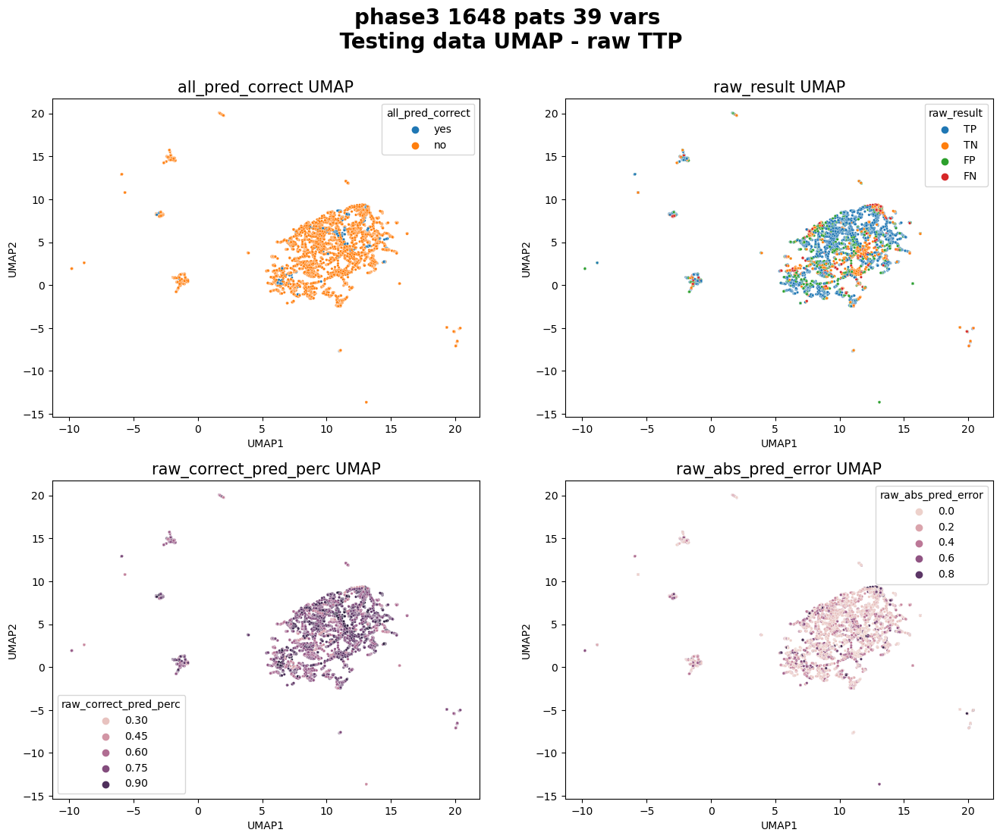

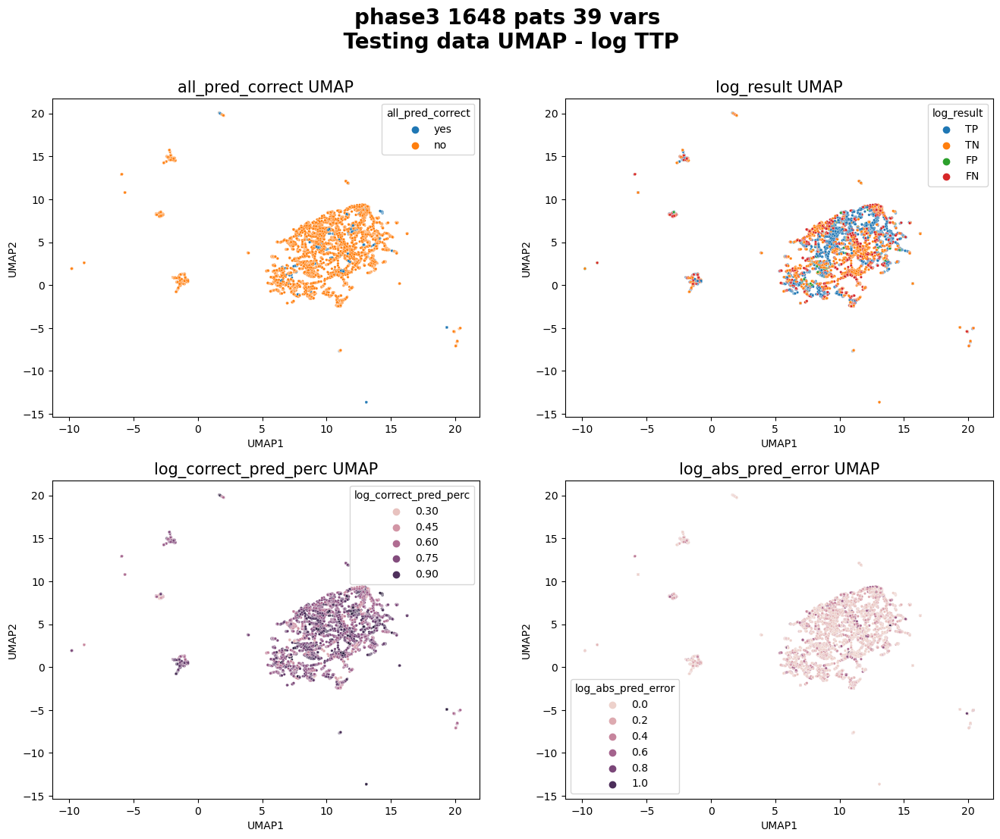

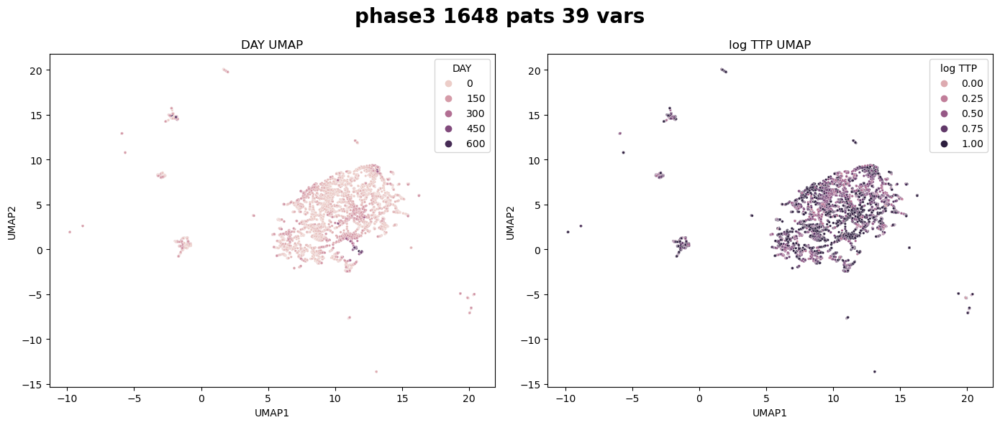

In [ ]:
import umap

figtitle_size=20
subtitle_size=15
x_tick_size=31
y_tick_size=31
y_label_size=15
bar_annot_fontsize=15
dot_size=6

## Load pat IDS with information which study phase they belong to
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv',index_col=0)

temporal_data_names=['ae_','cmind_','cmdos_','cmday_','mh']

model_names=['LSTM']

train_dataset_types=['raw','log']
#train_dataset_types=['log']
training_methods=['training_on_whole_data']
data_split_random_state=44

color_by='DAY'
color_by_legend_title={'STUDYID':'Study','DAY':'Study day','ARM':'Arm','PHASE':'Phase'}
training_method_fig_title={'training_on_whole_data':'Trained on all study days - Predicting TTP on all study days',
                           'training_on_first_x_days':'Trained on up until day'}


## Dictionary for the conversion of TTP values to labels
categorical_map_dict={'2_categories':{'bins':[float('-inf'),42,float('inf')],'labels':[1,0],
                                      'labels_str':['positive','negative'],
                                      'weights':[1,2]},
                      '6_categories':{'bins':[float('-inf'),1*7,2*7,3*7,4*7,5*7,6*7,float('inf')],'labels':[0,1,2,3,4,5,6],
                                     'labels_str':['Week1','Week2','Week3','Week4','Week5','Week6','Negative'],
                                     'weights':[1,1,1,1,1,1,2]}}

for ds_name in [*parameters_for_analysis][2:3]:
#for ds_name in [[*parameters_for_analysis][i] for i in (2,5,12)]:
    
    ## Load the preprocessed + imputed dataset
    data=pd.read_csv('../data/'+ds_name+'_preproc_data.csv',index_col=0,low_memory=False)  

    training_days=parameters_for_analysis[ds_name]['training_days']
    fname='../data/'+ds_name+'_LSTM_regr_results.pickle'
    if os.path.exists(fname):
        with open(fname,'rb') as f:
            result_dict=pickle.load(f)
    

    #training_data_results=result_dict[ds_name]['train_data_results']
    test_data_results=result_dict[ds_name]['test_data_results']
    #training_days=training_data_results['training_on_first_x_days']['training_days']

    
    for training_method in training_methods[:1]:
        
        for categorical_map_name in [*categorical_map_dict][:1]:    

            ## Extract predicted and actual values saved during training and create a dataframe out of them
            plot_dict={key: value for key, value in test_data_results[training_method].items() \
                    if all(exclude_string not in key for exclude_string in ['_with_index','_x','_model','training_loss_dict'])}
            pred_df=pd.DataFrame.from_dict(plot_dict)

            ## Check if data is min-max standardised -> revert standardisation 
            if pred_df['LSTM_raw_y'].values.max()<=1:
                min_val=0
                max_value=1/(24*3600)+42
                for ds_type,max_val in zip(train_dataset_types,[max_value,np.log10(max_value)]):
                    pred_df.loc[:,pred_df.columns.str.contains(ds_type)]=max_value * pred_df.loc[:,pred_df.columns.str.contains(ds_type)]

            ## If no min-max standardisation convert only log values back
            elif pred_df['LSTM_raw_y'].values.max()>1:
                pred_df.loc[:,pred_df.columns.str.contains('log_')]=10**pred_df.loc[:,pred_df.columns.str.contains('log_')]

            ## Convert numerical TTP values to categorical labels
            categorical_map=categorical_map_dict[categorical_map_name]
            pred_df_cat=pred_df.apply(pd.cut,bins=categorical_map['bins'],labels=categorical_map['labels'])
            
            ## PLotting parameters
            num_col=1
            num_row=len(train_ds_type)
            row_width_fact=3
            col_height_fact=15
            #fig=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            #fig2=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            #fig3=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            
            for n,train_ds_type in enumerate(train_dataset_types):
                actual_y='_'.join(['LSTM',train_ds_type,'y'])
                predicted='_'.join(['LSTM',train_ds_type,'predicted'])
                x_train='_'.join(['LSTM',train_ds_type,'x'])

                # Add new column with information about the result of prediction (FN,FP,TN,TP)
                pred_df_cat[train_ds_type+'_result']=np.where((pred_df_cat[actual_y]==0)&(pred_df_cat[predicted]==0),'TN',
                                                        np.where((pred_df_cat[actual_y]==1)&(pred_df_cat[predicted]==1),'TP',
                                                        np.where((pred_df_cat[actual_y]==1)&(pred_df_cat[predicted]==0),'FN',
                                                        np.where((pred_df_cat[actual_y]==0)&(pred_df_cat[predicted]==1),'FP', 'unknown'))))

                ## Add columns of pred_df_cat to the y_with_index
                model_name='LSTM_'+train_ds_type
                actual_y_with_index=model_name+'_y_with_index'
                y_with_index=test_data_results[training_method][actual_y_with_index]
                y_with_index[pred_df_cat.columns.tolist()]=pred_df_cat.values
                y_res_df=y_with_index.reset_index()
            
                X_test=test_data_results[training_method][x_train]

                ## Check for patients whose timepoints were all predicted correctly
                result_check=y_res_df.groupby('USUBJID')[train_ds_type+'_result'].apply(lambda x: all(x.isin(['TP', 'TN'])))
                pats_with_corr_preds=result_check[result_check].index

                ## Extract percentage of correctly predicted TTp values for each patient
                #  i.e. 7 TTPs are TP/TN out of 10 TTP -> percentage=7/10
                corr_pred_perc=y_res_df.groupby('USUBJID')[train_ds_type+'_result'].apply(lambda x: len(x[x.isin(['TP', 'TN'])])/len(x))

                '''
                ## Plot TTP values of patients whose TTP values were ALL correctly predicted 
                ax=fig.add_subplot(num_row,num_col,n+1)
                sns.lineplot(data=y_res_df[y_res_df['USUBJID'].isin(pats_with_corr_preds)],x='DAY',
                             y='mb_Time to Detection_STD_NUM_RESULT',hue='USUBJID',ax=ax,marker='o')
                #ax.set_title(train_ds_type+' TTP values')      
                ax.set_ylabel(train_ds_type+' TTP values',fontsize=y_label_size)     
                ax.set_xlabel('Study day',fontsize=y_label_size)  
                ax.get_legend().remove()    


                ## Plot TTP values of patients where at least one visit's TTP was incorrectly predicted 
                ax2=fig2.add_subplot(num_row,num_col,n+1) 
                sns.lineplot(data=y_res_df[~y_res_df['USUBJID'].isin(pats_with_corr_preds)],x='DAY',
                             y='mb_Time to Detection_STD_NUM_RESULT',hue='USUBJID',ax=ax2,marker='o')
                #ax.set_title(train_ds_type+' TTP values')      
                ax2.set_ylabel(train_ds_type+' TTP values',fontsize=y_label_size)     
                ax2.set_xlabel('Study day',fontsize=y_label_size)  
                ax2.get_legend().remove()
                
                '''
                ### PLOT UMAPS OF TRAINING DATA ### 

                ## Extract variables from X_train_slid_wind in order to plot UMAP
                #  If not raise error to create them    
                if training_method=='training_on_first_x_days':
                    fn_x='_'.join([ds_name,str(training_days),'train_days','LSTM_slid_window_X_train_data'])+'.csv.gz'
                    
                if training_method=='training_on_whole_data':
                    fn_x='_'.join([ds_name,'whole_data','LSTM_slid_window_X_train_data'])+'.csv.gz'
            
                #fname_x=os.path.join('../data',fn_x)
                #X_train_slid_wind=pd.read_csv(fname_x,index_col=0,nrows=0,low_memory=False)
                #X_test_=X_test.loc[:,X_test.columns.isin(X_train_slid_wind.columns)]
                #X_test_=X_test_.loc[:,~X_test_.columns.str.startswith(tuple(temporal_data_names))]


                ## Perform UMAP dimensionality reduction
                umap_reducer=umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
                umap_result=umap_reducer.fit_transform(X_test.drop(columns=['USUBJID']))
                y_res_df[['UMAP1', 'UMAP2']]=umap_result


                ## Add columns indicating points of patients with all correct predictions
                y_res_df['all_pred_correct']=np.nan
                y_res_df.loc[y_res_df['USUBJID'].isin(pats_with_corr_preds),'all_pred_correct']='yes'
                y_res_df.loc[~y_res_df['USUBJID'].isin(pats_with_corr_preds),'all_pred_correct']='no'

                ## Add percentage of correctly predicted TTP values per patient as a new column
                d=pd.Series(corr_pred_perc.values,index=corr_pred_perc.index).to_dict()
                y_res_df[train_ds_type+ '_correct_pred_perc']=y_res_df.loc[:,'USUBJID'].map(d)

                ## Add error of TTP prediction as a column
                y_predicted=test_data_results[training_method][predicted]
                y_res_df[train_ds_type+'_predicted']=y_predicted
                y_res_df[train_ds_type+'_abs_pred_error']=abs(y_res_df['mb_Time to Detection_STD_NUM_RESULT']-y_res_df[train_ds_type+'_predicted'])

                ## Rename some columns for better readability
                y_res_df[train_ds_type+' TTP']=y_res_df['mb_Time to Detection_STD_NUM_RESULT']
                y_res_df['log Study Day']=np.log10(y_res_df['DAY'])


                
                ## PLOT UMAP COLORED BY PREDICTION RESULTS
                vars_for_coloring=['all_pred_correct',train_ds_type+'_result',train_ds_type+'_correct_pred_perc',
                                    train_ds_type+'_abs_pred_error']

                num_col=2
                num_row=math.ceil(len(vars_for_coloring)/num_col)
                row_width_fact=8
                col_height_fact=6
                #fig3,ax3=plt.subplots(num_row,num_col,figsize=(num_row*row_width_fact,num_col*col_height_fact))
                fig3=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
                
                for l,var in enumerate(vars_for_coloring[:]):
                    ax3=fig3.add_subplot(num_row,num_col,l+1) 
                    sns.scatterplot(data=y_res_df,x='UMAP1', y='UMAP2',hue=var,ax=ax3,s=dot_size)
                    ax3.set_title(var+' UMAP',fontsize=subtitle_size) 
                
        

                if training_method=='training_on_first_x_days':
                    suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n'+training_method_fig_title[training_method] +\
                            ' '+ str(training_days)+' - Predicting TTP on days '+str(prediction_duration[0])+ ' - '+str(prediction_duration[-1]) 
                            
                else:
                    suptitle=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Patients with only correct predictions'     
                    suptitle2=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Patients with incorrent predcictions' 
                    suptitle3=ds_name_with_temp_df_names.replace('_',' ')+'\n '+ 'Testing data UMAP' +' - '+train_ds_type+' TTP'                                           
                    
                
                #fig.suptitle(suptitle,fontsize=figtitle_size,fontweight='bold',y=0.98)
                #fig2.suptitle(suptitle2,fontsize=figtitle_size,fontweight='bold',y=0.98)
                fig3.suptitle(suptitle3,fontsize=figtitle_size,fontweight='bold',y=0.98)          
                

            ## PLOT UMAP COLORED BY OTHER VARIABLES
            num_col=2
            num_row=math.ceil(len(train_dataset_types)/num_col)
            row_width_fact=14
            col_height_fact=3

            vars_for_coloring=['DAY',train_ds_type+' TTP'] #'log Study Day'

            fig4=plt.figure(figsize=(num_row*row_width_fact,num_col*col_height_fact))
            for l,var in enumerate(vars_for_coloring[:]):
                ax4=fig4.add_subplot(num_row,num_col,l+1) 
                sns.scatterplot(data=y_res_df,x='UMAP1', y='UMAP2',hue=var,ax=ax4,s=dot_size)
                ax4.set_title(var+' UMAP')   

            suptitle4=ds_name_with_temp_df_names.replace('_',' ')
            fig4.suptitle(suptitle4,fontsize=figtitle_size,fontweight='bold',y=0.98)

plt.tight_layout() 
        
                